# Importation des packages 

In [1]:
#t =pd.DataFrame()
#t=train.copy() " pour copy the columns" or t=train['isFraud'].copy()
# accée pour une cellule i d'une collonne est train['isFraud].iloc[i] pour series et array , pour data frame train['isFraud'][i]
#train_enco['P_emaildomain'][train_enco['P_emaildomain']=='NaN']=np.nan # il faut bien éclaircir au compélateur les NAN se sont des np.nan non des strings
# pour sauvgarder une base de donner au répertoire courant 
#train_df.to_pickle('/kaggle/working/train_df.pkl') #
#test_df.to_pickle('/kaggle/working/test_df.pkl')

import matplotlib.pyplot as plt
%matplotlib inline
## à compléter
import pandas as pd
import numpy as np
from sklearn import datasets, linear_model
from sklearn.linear_model import LinearRegression
import statsmodels.api as sm
from scipy import stats
import sklearn
from scipy.stats import mode # pour récupérer la médiane d'un varaible
from sklearn.preprocessing import MinMaxScaler, StandardScaler,MaxAbsScaler,RobustScaler# pour pouvoir faire scaling sur notre jeu des données 
from sklearn.model_selection import train_test_split # construction de la base de test et d'apprentissage
import pickle as pkl
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import LinearRegression
from sklearn.metrics import confusion_matrix,roc_curve,roc_auc_score
from sklearn.svm import SVR # séparation vaste Réfression : Support Vector Marge pour la régression
from keras.callbacks import ModelCheckpoint
from keras.models import Sequential
from keras.layers import Dropout # régularization hyper-paramétre
from keras.layers import Dense, Activation, Flatten
from sklearn.model_selection import train_test_split
from keras.optimizers import SGD # régularization hyper-paramétre ==> surveilleance de learning rate
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import StratifiedKFold
from statistics import mean
import seaborn as sb
import matplotlib
#' ' means CPU whereas '/device:G:0' means GPU
#import tensorflow as tf
#tf.test.gpu_device_name()


/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm
Using TensorFlow backend.


In [2]:

## changement de répertoire current de travail
from google.colab import drive
drive.mount('/content/drive')


Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [3]:
# déclaration du chemin de mon répertoire
mypath ="drive/My Drive/la base des données_fraud_detection/" # chemin
!ls  "drive/My Drive/la base des données_fraud_detection/" # affichage des fichiers existants dans le répertoire

 sample_submission.csv
'Submission_Jeu-KNN__Modéle-KNN(K=11)_optimisé-GridSearchCV.csv'
'Submission_Jeu-KNN__Modéle-KNN(K=5)_optimisé-visuellement.csv'
 Submission_knn_LGBM_defaut.csv
 Submission_KNN_LGBM_Param-optimisés_crossèvalidation.csv
 Submission_KNN_LGBM_Param-optimisés_cross-validation-manuel.csv
 Submission_KNN_LGBM_Param-optimisés.csv
 Submission_KNN_LGBM_Param-spécifiés.csv
 Submission_mode-mean_LGBM_defaut.csv
 Submission_Mode-mean_LGBM_Param-optimisés.csv
 Submission_mode-mean_LGBM_Param-spécifiés.csv
 test_identity.csv
 Test_knn.csv
 Test_mode_mean.csv
 test_transaction.csv
 train_identity.csv
 Train_knn.csv
 Train_mode_mean.csv
 train_transaction.csv


In [0]:
# imporation des jeux des données 
test_identity = pd.read_csv(mypath+"test_identity.csv", sep = ',', header = 0,index_col = None,na_values=['NaN','nan']) # il y a le header=0
test_transaction = pd.read_csv(mypath+"test_transaction.csv", sep = ',', header = 0,index_col = None,na_values=['NaN','nan']) # il y a le header=0
train_transaction = pd.read_csv(mypath+"train_transaction.csv", sep = ',', header = 0,index_col = None,na_values=['NaN','nan']) # il y a le header=0 # transactions + varaibales cibles
train_identity = pd.read_csv(mypath+"train_identity.csv", sep = ',', header = 0,index_col = None,na_values=['NaN','nan']) # il y a le header=0 # caractéristique de chaque transaction
sample_submission = pd.read_csv(mypath+"sample_submission.csv", sep = ',', header = 0,index_col = None,na_values=['NaN','nan']) # il y a le header=0 # resultats finals 
submission = pd.read_csv(mypath+'sample_submission.csv', index_col='TransactionID')
submission =submission
test_identity= test_identity
test_transaction=test_transaction
train_transaction=train_transaction[0:50000]
train_identity=train_identity[0:50000]

In [0]:
#Affichage des 5 premieres lignes de notre jeu de données
train_transaction.head(5)


,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,dist1,dist2,P_emaildomain,R_emaildomain,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D6,D7,D8,D9,...,V300,V301,V302,V303,V304,V305,V306,V307,V308,V309,V310,V311,V312,V313,V314,V315,V316,V317,V318,V319,V320,V321,V322,V323,V324,V325,V326,V327,V328,V329,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339
0,2987000,0,86400,68.5,W,13926,NaN,150.0,discover,142.0,credit,315.0,87.0,19.0,NaN,NaN,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,2.0,0.0,1.0,1.0,14.0,NaN,13.0,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,117.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,117.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2987001,0,86401,29.0,W,2755,404.0,150.0,mastercard,102.0,credit,325.0,87.0,NaN,NaN,gmail.com,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2987002,0,86469,59.0,W,4663,490.0,150.0,visa,166.0,debit,330.0,87.0,287.0,NaN,outlook.com,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2987003,0,86499,50.0,W,18132,567.0,150.0,mastercard,117.0,debit,476.0,87.0,NaN,NaN,yahoo.com,NaN,2.0,5.0,0.0,0.0,0.0,4.0,0.0,0.0,1.0,0.0,1.0,0.0,25.0,1.0,112.0,112.0,0.0,94.0,0.0,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,1.0,50.0,1758.0,925.0,0.0,354.0,0.0,135.0,0.0,0.0,0.0,50.0,1404.0,790.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2987004,0,86506,50.0,H,4497,514.0,150.0,mastercard,102.0,credit,420.0,87.0,NaN,NaN,gmail.com,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [0]:
#Affichage des 5 premieres lignes de notre jeu de données
test_transaction.head(5)

,TransactionID,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,dist1,dist2,P_emaildomain,R_emaildomain,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,...,V300,V301,V302,V303,V304,V305,V306,V307,V308,V309,V310,V311,V312,V313,V314,V315,V316,V317,V318,V319,V320,V321,V322,V323,V324,V325,V326,V327,V328,V329,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339
0,3663549,18403224,31.95,W,10409,111.0,150.0,visa,226.0,debit,170.0,87.0,1.0,NaN,gmail.com,NaN,6.0,6.0,0.0,0.0,3.0,4.0,0.0,0.0,6.0,0.0,5.0,1.0,115.0,6.0,419.0,419.0,27.0,398.0,27.0,NaN,NaN,NaN,NaN,418.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.000000,47.950001,0.000000,0.000000,47.950001,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,3663550,18403263,49.00,W,4272,111.0,150.0,visa,226.0,debit,299.0,87.0,4.0,NaN,aol.com,NaN,3.0,2.0,0.0,0.0,0.0,1.0,0.0,0.0,2.0,0.0,1.0,1.0,12.0,2.0,149.0,149.0,7.0,634.0,7.0,NaN,NaN,NaN,NaN,231.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.000000,280.000000,77.000000,0.000000,280.000000,0.000000,77.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3663551,18403310,171.00,W,4476,574.0,150.0,visa,226.0,debit,472.0,87.0,2635.0,NaN,hotmail.com,NaN,2.0,2.0,0.0,0.0,0.0,5.0,0.0,0.0,4.0,0.0,2.0,0.0,22.0,2.0,137.0,137.0,10.0,97.0,10.0,NaN,NaN,NaN,NaN,136.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.000000,1321.000000,0.000000,0.000000,1058.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,263.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3663552,18403310,284.95,W,10989,360.0,150.0,visa,166.0,debit,205.0,87.0,17.0,NaN,gmail.com,NaN,5.0,2.0,0.0,0.0,1.0,1.0,0.0,0.0,2.0,0.0,2.0,0.0,7.0,4.0,42.0,42.0,41.0,242.0,41.0,NaN,NaN,NaN,NaN,242.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,282.540009,282.540009,282.540009,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,3663553,18403317,67.95,W,18018,452.0,150.0,mastercard,117.0,debit,264.0,87.0,6.0,NaN,gmail.com,NaN,6.0,6.0,0.0,0.0,2.0,5.0,0.0,0.0,5.0,0.0,6.0,0.0,14.0,6.0,22.0,22.0,0.0,22.0,0.0,NaN,NaN,NaN,NaN,22.0,...,0.0,0.0,0.0,0.0,0.0,1.0,67.949997,183.850006,67.949997,67.949997,183.850006,67.949997,67.949997,67.949997,183.850006,67.949997,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [0]:
#dimensions : nombre de lignes, nombre de colonnes
#la ligne d'en-tête n'est pas comptabilisée dans le nombre de lignes
# train et test ne signifient pas les bases de test et de train : test signifie des transactions cible pour prédire la variable y=isFraude
# donc ultérierement on aura besoin de split notre base train en deux :train_train et train_test, aprés avoir séparer les varaibles endogénes et exogénes. on aura aussi plus tard de concaténer entre identity et transaction, puis faire extraire la varaible cible et varaibles explicatives
print("la taille de train_transaction est : Nombre de lignes",train_transaction.shape[0]," et Nombre de colonnes",train_transaction.shape[1])
print("la taille de test_transaction est : Nombre de lignes",test_transaction.shape[0]," et Nombre de colonnes",test_transaction.shape[1])
print("la taille de train_identity est : Nombre de lignes",train_identity.shape[0]," et Nombre de colonnes :(varaibale cible non compris: à prédire)",train_identity.shape[1])
print("la taille de test_identity est : Nombre de lignes",test_identity.shape[0]," et Nombre de colonnes",test_identity.shape[1])
# il y a une différence au niveau de taille entre train_transaction et train identity: ca revient de dire que il ya des personnes qui font du fraude plusieures fois au bien on a des doublants
print("la taille de submission est",sample_submission.shape[0],"\n et Nombre de colonnes",sample_submission.shape[1])


la taille de train_transaction est : Nombre de lignes 50000  et Nombre de colonnes 394
la taille de test_transaction est : Nombre de lignes 506691  et Nombre de colonnes 393
la taille de train_identity est : Nombre de lignes 50000  et Nombre de colonnes :(varaibale cible non compris: à prédire) 41
la taille de test_identity est : Nombre de lignes 141907  et Nombre de colonnes 41
la taille de submission est 506691 
 et Nombre de colonnes 2


In [0]:
# types des varaibles 
print("le type des varaibles de  transaction est : \n",train_transaction.dtypes)
print("\nle type des varaibles d'identity est :\n ",train_identity.dtypes)

le type des varaibles de  transaction est : 
 TransactionID       int64
isFraud             int64
TransactionDT       int64
TransactionAmt    float64
ProductCD          object
                   ...   
V335              float64
V336              float64
V337              float64
V338              float64
V339              float64
Length: 394, dtype: object

le type des varaibles d'identity est :
  TransactionID      int64
id_01            float64
id_02            float64
id_03            float64
id_04            float64
id_05            float64
id_06            float64
id_07            float64
id_08            float64
id_09            float64
id_10            float64
id_11            float64
id_12             object
id_13            float64
id_14            float64
id_15             object
id_16             object
id_17            float64
id_18            float64
id_19            float64
id_20            float64
id_21            float64
id_22            float64
id_23             object

In [0]:
#description des données : pour avoir des idées sur la structure et détecter les failles de notre jeu de données
pd.DataFrame(train_transaction.describe(include='all'))

,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,dist1,dist2,P_emaildomain,R_emaildomain,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D6,D7,D8,D9,...,V300,V301,V302,V303,V304,V305,V306,V307,V308,V309,V310,V311,V312,V313,V314,V315,V316,V317,V318,V319,V320,V321,V322,V323,V324,V325,V326,V327,V328,V329,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339
count,5.000000e+04,50000.000000,5.000000e+04,50000.000000,50000,50000.000000,49303.000000,49997.000000,49994,49765.000000,49997,47409.000000,47409.000000,16880.000000,3355.000000,41014,11660,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.00000,50000.000000,50000.000000,50000.000000,50000.00000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,23484.000000,24444.000000,26829.000000,17821.000000,4825.000000,2356.000000,8750.000000,8750.000000,...,50000.000000,50000.000000,49989.000000,49989.000000,49989.000000,49989.000000,49989.000000,49989.000000,49989.000000,49989.000000,49989.000000,49989.000000,49989.000000,50000.000000,50000.000000,50000.000000,49989.000000,49989.000000,49989.000000,49989.000000,49989.000000,49989.000000,12268.000000,12268.000000,12268.000000,12268.000000,12268.000000,12268.000000,12268.000000,12268.000000,12268.000000,12268.000000,12268.000000,12268.000000,12268.000000,12268.000000,12268.000000,12268.000000,12268.000000,12268.000000
unique,NaN,NaN,NaN,NaN,5,NaN,NaN,NaN,4,NaN,4,NaN,NaN,NaN,NaN,59,57,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,NaN,NaN,NaN,W,NaN,NaN,NaN,visa,NaN,debit,NaN,NaN,NaN,NaN,gmail.com,gmail.com,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,NaN,NaN,NaN,32798,NaN,NaN,NaN,32561,NaN,34205,NaN,NaN,NaN,NaN,17909,4367,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,3.012000e+06,0.027140,6.377990e+05,128.123213,NaN,9912.634860,366.636574,152.803668,NaN,200.703768,NaN,291.815436,85.590563,126.430628,246.386885,NaN,NaN,26.313600,33.171300,0.016240,11.668980,4.799620,16.24336,10.650640,16.536120,3.766160,18.72006,20.302260,14.657400,40.656240,12.687540,81.400240,164.398229,28.190476,134.461553,39.503844,70.176995,56.746604,177.833028,0.563085,...,0.046400,0.049320,0.315369,0.335854,0.322211,1.000040,48.755787,224.187004,104.841931,9.461087,93.300787,3.890017,31.893332,17.229161,36.325937,21.647449,25.503799,105.383260,55.785853,13.493490,25.088342,16.797215,0.262716,0.570998,0.365504,0.031872,0.263042,0.106130,0.103521,0.151043,0.110450,38.942391,63.051814,45.816241,4.252527,14.926426,7.991718,15.742603,21.362671,16.464481
std,1.443390e+04,0.162493,3.229399e+05,213.075166,NaN,4904.640239,159.059250,10.482307,NaN,40.299293,NaN,104.991637,6.687402,385.991573,545.760698,NaN,NaN,160.977331,214.143495,0.156002,94.124468,22.894044,95.49918,91.773011,137.167204,14.680301,153.65613,127.642661,124.843307,158.909277,63.956223,139.516778,159.215459,58.501079,170.299796,77.880678,138.558249,112.101622,247.611390,0.315374,...,0.285112,0.294091,0.488509,0.572229,0.506917,0.006325,575.652868,1634.198887,813.795869,71.701954,266.894290,55.098663,122.066386,88.410578,157.182266,103.020810,220.949063,1401.880214,574.942462,518.113429,535.569077,521.096469,0.915447,2.657375,1.337517,0.210691,1.925831,0.707125,0.457942,0.820437,0.469788,190.465893,446.405097,210.319262,46.694625,105.561868,60.584452,91.083819,131.07

In [0]:
#description des données : pour avoir des idées sur la structure et détecter les failles de notre jeu de données
pd.DataFrame(train_identity.describe(include='all'))

,TransactionID,id_01,id_02,id_03,id_04,id_05,id_06,id_07,id_08,id_09,id_10,id_11,id_12,id_13,id_14,id_15,id_16,id_17,id_18,id_19,id_20,id_21,id_22,id_23,id_24,id_25,id_26,id_27,id_28,id_29,id_30,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo
count,5.000000e+04,50000.000000,48671.000000,21823.000000,21823.000000,47218.000000,47218.000000,1915.000000,1915.000000,25462.000000,25462.000000,48782.000000,50000,41053.000000,37495.000000,48782,46187,48245.000000,15524.000000,48233.000000,48231.000000,1912.000000,1916.000000,1916,1777.000000,1904.000000,1915.000000,1916,48782,48782,36955,48613,36957.000000,34229,37041,48782,48782,48782,48782,48663,44306
unique,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2,NaN,NaN,3,2,NaN,NaN,NaN,NaN,NaN,NaN,3,NaN,NaN,NaN,2,2,2,67,84,NaN,146,4,2,2,2,2,2,944
top,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NotFound,NaN,NaN,New,NotFound,NaN,NaN,NaN,NaN,NaN,NaN,IP_PROXY:TRANSPARENT,NaN,NaN,NaN,Found,Found,Found,Windows 10,chrome 63.0,NaN,1920x1080,match_status:2,T,F,T,T,desktop,Windows
freq,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,43247,NaN,NaN,23490,24364,NaN,NaN,NaN,NaN,NaN,NaN,1206,NaN,NaN,NaN,1915,26277,25462,9835,10247,NaN,8122,28349,36964,45720,37281,34981,32337,17903
mean,3.052775e+06,-8.222920,136714.373611,0.082024,-0.058883,1.956373,-5.928650,14.186945,-39.907050,0.129369,-0.343767,99.692996,NaN,47.833971,-348.290439,NaN,NaN,177.250492,14.004251,362.928348,382.916941,379.479079,15.393006,NaN,13.106922,325.453256,150.090339,NaN,NaN,NaN,NaN,NaN,26.558866,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,3.126389e+04,13.065504,120775.013660,0.588014,0.699167,5.333978,15.979236,11.078637,26.891296,1.000645,2.646768,1.227776,NaN,10.002436,89.130419,NaN,NaN,24.990133,1.468511,147.607675,155.790625,200.742970,5.788485,NaN,2.186888,98.304298,30.824455,NaN,NaN,NaN,NaN,NaN,3.751787,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,2.987004e+06,-100.000000,1120.000000,-11.000000,-28.000000,-34.000000,-100.000000,-23.000000,-100.000000,-23.000000,-100.000000,90.000000,NaN,10.000000,-660.000000,NaN,NaN,100.000000,11.000000,100.000000,100.000000,100.000000,12.000000,NaN,11.000000,100.000000,100.000000,NaN,NaN,NaN,NaN,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25%,3.027580e+06,-5.000000,60521.500000,0.000000,0.000000,0.000000,-5.000000,5.000000,-50.000000,0.000000,0.000000,100.000000,NaN,49.000000,-360.000000,NaN,NaN,166.000000,13.000000,266.000000,222.000000,252.000000,14.000000,NaN,11.000000,301.750000,121.000000,NaN,NaN,NaN,NaN,NaN,24.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50%,3.056132e+06,-5.000000,103244.000000,0.000000,0.000000,0.000000,0.000000,14.000000,-34.000000,0.000000,0.000000,100.000000,NaN,52.000000,-300.000000,NaN,NaN,166.000000,15.000000,352.000000,391.000000,252.000000,14.000000,NaN,12.000000,321.000000,149.000000,NaN,NaN,NaN,NaN,NaN,24.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
75%,3.079821e+06,-5.000000,171518.500000,0.000000,0.000000,1.000000,0.000000,23.000000,-24.000000,0.000000,0.000000,100.000000,NaN,52.000000,-300.000000,NaN,NaN,166.000000,15.000000,492.000000,533.000000,538.000000,14.000000,NaN,15.000000,371.000000,169.000000,NaN,NaN,NaN,NaN,NaN,32.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## traitement des valeurs manquantes et doublantes

In [17]:
# concaténation des bases des données 
test = test_transaction.merge(test_identity, how='left', left_index=True, right_index=True) # ID de transaction y compris
train = train_transaction.merge(train_identity, how='left', left_index=True, right_index=True) # ID de transaction y compris, Y exclue
print("taille de la base test", test.shape)
print("taille de la base train", train.shape)
train.drop(['TransactionID_x'],axis=1)
test.drop(['TransactionID_x'],axis=1)


ERROR! Session/line number was not unique in database. History logging moved to new session 59
taille de la base test (506691, 434)
taille de la base train (50000, 435)


,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,dist1,dist2,P_emaildomain,R_emaildomain,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,D11,...,id-01,id-02,id-03,id-04,id-05,id-06,id-07,id-08,id-09,id-10,id-11,id-12,id-13,id-14,id-15,id-16,id-17,id-18,id-19,id-20,id-21,id-22,id-23,id-24,id-25,id-26,id-27,id-28,id-29,id-30,id-31,id-32,id-33,id-34,id-35,id-36,id-37,id-38,DeviceType,DeviceInfo
0,18403224,31.950,W,10409,111.0,150.0,visa,226.0,debit,170.0,87.0,1.0,NaN,gmail.com,NaN,6.0,6.0,0.0,0.0,3.0,4.0,0.0,0.0,6.0,0.0,5.0,1.0,115.0,6.0,419.0,419.0,27.0,398.0,27.0,NaN,NaN,NaN,NaN,418.0,203.0,...,-45.0,280290.0,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,100.0,NotFound,27.0,NaN,New,NotFound,225.0,15.0,427.0,563.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,New,NotFound,NaN,chrome 67.0 for android,NaN,NaN,NaN,F,F,T,F,mobile,MYA-L13 Build/HUAWEIMYA-L13
1,18403263,49.000,W,4272,111.0,150.0,visa,226.0,debit,299.0,87.0,4.0,NaN,aol.com,NaN,3.0,2.0,0.0,0.0,0.0,1.0,0.0,0.0,2.0,0.0,1.0,1.0,12.0,2.0,149.0,149.0,7.0,634.0,7.0,NaN,NaN,NaN,NaN,231.0,634.0,...,0.0,3579.0,0.0,0.0,0.0,0.0,NaN,NaN,0.0,0.0,100.0,Found,NaN,-300.0,Found,Found,166.0,NaN,542.0,368.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Found,Found,Android 6.0.1,chrome 67.0 for android,24.0,1280x720,match_status:2,T,F,T,T,mobile,LGLS676 Build/MXB48T
2,18403310,171.000,W,4476,574.0,150.0,visa,226.0,debit,472.0,87.0,2635.0,NaN,hotmail.com,NaN,2.0,2.0,0.0,0.0,0.0,5.0,0.0,0.0,4.0,0.0,2.0,0.0,22.0,2.0,137.0,137.0,10.0,97.0,10.0,NaN,NaN,NaN,NaN,136.0,136.0,...,-5.0,185210.0,NaN,NaN,1.0,0.0,NaN,NaN,NaN,NaN,100.0,NotFound,52.0,-360.0,New,NotFound,225.0,NaN,271.0,507.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,New,NotFound,NaN,ie 11.0 for tablet,NaN,NaN,NaN,F,T,T,F,desktop,Trident/7.0
3,18403310,284.950,W,10989,360.0,150.0,visa,166.0,debit,205.0,87.0,17.0,NaN,gmail.com,NaN,5.0,2.0,0.0,0.0,1.0,1.0,0.0,0.0,2.0,0.0,2.0,0.0,7.0,4.0,42.0,42.0,41.0,242.0,41.0,NaN,NaN,NaN,NaN,242.0,242.0,...,-45.0,252944.0,0.0,0.0,0.0,0.0,NaN,NaN,0.0,0.0,100.0,NotFound,27.0,NaN,Found,Found,225.0,15.0,427.0,563.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Found,Found,NaN,chrome 67.0 for android,NaN,NaN,NaN,F,F,T,F,mobile,MYA-L13 Build/HUAWEIMYA-L13
4,18403317,67.950,W,18018,452.0,150.0,mastercard,117.0,debit,264.0,87.0,6.0,NaN,gmail.com,NaN,6.0,6.0,0.0,0.0,2.0,5.0,0.0,0.0,5.0,0.0,6.0,0.0,14.0,6.0,22.0,22.0,0.0,22.0,0.0,NaN,NaN,NaN,NaN,22.0,22.0,...,-95.0,328680.0,NaN,NaN,7.0,-33.0,NaN,NaN,NaN,NaN,100.0,NotFound,27.0,NaN,New,NotFound,225.0,15.0,567.0,507.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,New,NotFound,NaN,chrome 67.0 for android,NaN,NaN,NaN,F,F,T,F,mobile,SM-G9650 Build/R16NW
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
506686,34214279,94.679,C,13832,375.0,185.0,mastercard,224.0,debit,284.0,60.0,NaN,NaN,gmail.com,gmail.com,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,NaN,NaN,0.0,NaN,0.0,NaN,NaN,NaN,0.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
506687,34214287,12.173,C,3154,408.0,185.0,mastercard,224.0,debit,NaN,NaN,NaN,157.0,hotmail.com,hotmail.com,1.0,3.0,0.0,1.0,0.0,1.0,1.0,2.0,0.0,2.0,1.0,1.0,3.0,1.0,16.0,16.0,16.0,16.0,16.0,16.0,16.0,NaN,NaN,0.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
506688,34214326,49.000,W,16661,490.0,150.0,visa,226.0,debit,327.0,87.0,NaN,NaN,hotmail.com,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Na

In [0]:
 #rennomation des varaible id _ Med
test.rename(columns=lambda x: x.replace("-","_"), inplace=True)


* Visualisation de Vraible Cible Afin de détecter la présence de Data Déséquilibré

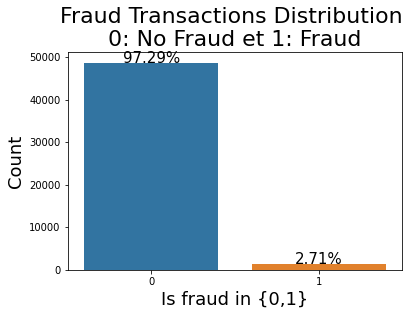

From total data  2.71 % contains fraud train
From total data  97.29 % contains legit train


In [0]:
# Data Visualisation==> Target
#######
####plot
import seaborn as sns
g=sns.countplot(train['isFraud'])
g.set_title("Fraud Transactions Distribution \n 0: No Fraud et 1: Fraud ", fontsize=22)
g.set_xlabel("Is fraud in {0,1}", fontsize=18)
g.set_ylabel('Count', fontsize=18)

#####pourcentage
total = len(train)
for p in g.patches: # g.patches : les battons de courbe 
    height = p.get_height()
    g.text(p.get_x()+p.get_width()/2.,
            height + 3,
            '{:1.2f}%'.format(height/total*100),
            ha="center", fontsize=15) 
########
plt.show()
print('From total data ',np.round(train[train['isFraud']==1].shape[0]/train.shape[0]*100,2),'% contains fraud train')
print('From total data ',np.round(train[train['isFraud']==0].shape[0]/train.shape[0]*100,2),'% contains legit train')
# en remarque que les deux pourcentage est non équilibrés donc il faut augmenter le poids de "1" ou bien utiliser des autres metrics de régression ( cas continue, convertir "isFraud" qui est binaire à varaible continue) ou bien  car accuracy dans ce cas n'est pas le bon metric qui reflete la bon prédiction 

##Mappinp et aggrégation des modalités : 

Mapping email: 
puisque on a presque un nombre de modalité de varaible "email" est  clossal, donc on peut grouper les emails par entreprise, sinon le codage de la varaible "emails" explosera la dimension et la stricture des données ce qui provoquera au plus tards le probleme de sur-apprentissage.
Et aprés l'agrégtion, on extraira à chaque email deux variable le bin et suffix

* Mapping des varaibles: P_emaildomain et R_emaildomain : 

In [0]:
#dictionnaire
emails = {'gmail': 'google', 'att.net': 'att', 'twc.com': 'spectrum', 
          'scranton.edu': 'other', 'optonline.net': 'other', 'hotmail.co.uk': 'microsoft',
          'comcast.net': 'other', 'yahoo.com.mx': 'yahoo', 'yahoo.fr': 'yahoo',
          'yahoo.es': 'yahoo', 'charter.net': 'spectrum', 'live.com': 'microsoft', 
          'aim.com': 'aol', 'hotmail.de': 'microsoft', 'centurylink.net': 'centurylink',
          'gmail.com': 'google', 'me.com': 'apple', 'earthlink.net': 'other', 'gmx.de': 'other',
          'web.de': 'other', 'cfl.rr.com': 'other', 'hotmail.com': 'microsoft', 
          'protonmail.com': 'other', 'hotmail.fr': 'microsoft', 'windstream.net': 'other', 
          'outlook.es': 'microsoft', 'yahoo.co.jp': 'yahoo', 'yahoo.de': 'yahoo',
          'servicios-ta.com': 'other', 'netzero.net': 'other', 'suddenlink.net': 'other',
          'roadrunner.com': 'other', 'sc.rr.com': 'other', 'live.fr': 'microsoft',
          'verizon.net': 'yahoo', 'msn.com': 'microsoft', 'q.com': 'centurylink', 
          'prodigy.net.mx': 'att', 'frontier.com': 'yahoo', 'anonymous.com': 'other', 
          'rocketmail.com': 'yahoo', 'sbcglobal.net': 'att', 'frontiernet.net': 'yahoo', 
          'ymail.com': 'yahoo', 'outlook.com': 'microsoft', 'mail.com': 'other', 
          'bellsouth.net': 'other', 'embarqmail.com': 'centurylink', 'cableone.net': 'other', 
          'hotmail.es': 'microsoft', 'mac.com': 'apple', 'yahoo.co.uk': 'yahoo', 'netzero.com': 'other', 
          'yahoo.com': 'yahoo', 'live.com.mx': 'microsoft', 'ptd.net': 'other', 'cox.net': 'other',
          'aol.com': 'aol', 'juno.com': 'other', 'icloud.com': 'apple'}

us_emails = ['gmail', 'net', 'edu']
def mapping_extr(base,bin=emails,suffix=us_emails):
   for c in ['P_emaildomain', 'R_emaildomain']:
       base[c + '_bin'] = base[c].map(emails)
    
       base[c + '_suffix'] = base[c].map(lambda x: str(x).split('.')[-1])
    
       base[c + '_suffix'] = base[c + '_suffix'].map(lambda x: x if str(x) not in us_emails else 'us')

       del base[c]
# aggrégation : se fait dans le cas ou on a l'eefectifs pour la modalité i de variable X et j de varaible Y sont inférieur à 5.( hypothese de test de indépendance de khi deux)
# et aussi éviter la production ou augmentation de dimension des donnée sau niveau de codage des varaibles qualitatives

In [0]:

mapping_extr(train)
mapping_extr(test)

#on aura deux varaibles de plus mais en fait, avec des modalités regroupées

* Observation le nombre colossal des modalités de certaines varaibles, notamment DEVICEINFO

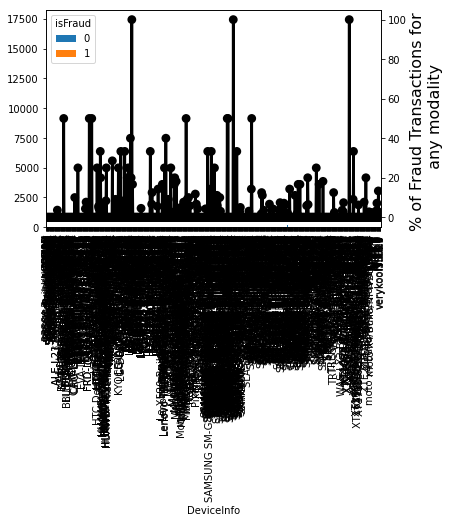

In [0]:
#analyse de la variable DeviceInfo

i="DeviceInfo"
y=train[i].copy()
x= train.isFraud.copy()
#y=train[i].copy() 
y=pd.DataFrame(y)
x=pd.DataFrame(x)
y['isFraud']=x.astype('category') # des pairs afin de faire le croisement 
t=pd.crosstab(y[y.columns[0]],y['isFraud']).plot.bar()
######
if (train[i].dtypes!='object' or train[i].dtypes=='object') :
  gt = t.twinx()
  tmp = pd.crosstab(y[i], y['isFraud'], normalize='index') * 100
  tmp = tmp.reset_index()
  tmp.rename(columns={0:'NoFraud', 1:'Fraud'}, inplace=True) 
  gt = sns.pointplot(x=str(i), y='Fraud', data=tmp, color='black', legend=False)
  gt.set_ylabel("% of Fraud Transactions for \n any modality", fontsize=16) # pour comparer les pourcentages de frauds parmi les non frauds de chaque modalité, par rapport ceux des autres modalités : pour prendre en compte le poids de chaque modalité

# aggrégation : se fait dans le cas ou on a l'eefectifs pour la modalité i de variable X et j de varaible Y sont inférieur à 5.( hypothese de test de indépendance de khi deux)
# et aussi éviter la production ou augmentation de dimension des donnée sau niveau de codage des varaibles qualitatives

* Prgrammatin de la fonction d'aggrégation pour ID31 et ID33 et DEVICEINFO

---
le principe c'est d'éradiquer les modalitée, de ces varaibles, non significatives en les remplacant par NAN qui seront imputées par des modalités significatives


In [0]:

def aggr(x,y,var):
  lis=list((x[var]))
  lis.extend(y[var])
  value=x[var].copy().value_counts().add(y[var].copy().value_counts(), fill_value=0)#addittion de deux series
  modalite=[i for i in list(set(lis))[1:] if  (value[i].astype('float') <= 0.2*value.max() ) == True ] # les modalités que on doit changer
  non_modalite=[i for i in modalite if  (i in list(set(list((y[var]))))[1:] and i not in list(set(list((x[var]))))[1:] ) or (i not in list(set(list((y[var]))))[1:] and i in list(set(list((x[var]))))[1:] ) ] # les modalités que on doit changer
  t= x[var].copy()
  r= y[var].copy()
  for c in modalite: 
    t[t==c]=np.nan
    r[r==c]=np.nan
  for k in non_modalite: 
    t[t==k]=np.nan
    r[r==k]=np.nan 
  x[var]= t.copy()
  y[var]= r.copy()
  
    
    
#

In [0]:
#apply pour 'DeviceInfo' 'id_30' 'id_31' 'id_33'aggr(train,test,'id_30') 
aggr(train,test,'DeviceInfo')

In [0]:
aggr(train,test,'id_31')

In [0]:
aggr(train,test,'id_33')

In [0]:
aggr(train,test,'id_30')

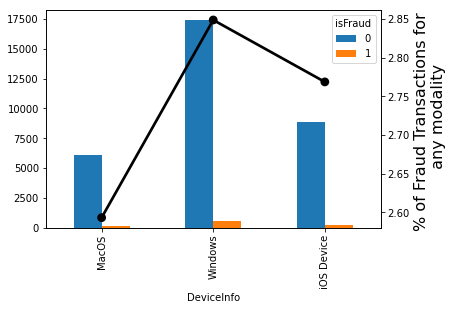

In [0]:
#analyse de la variable DeviceInfo

i="DeviceInfo"
y=train[i].copy()
x= train.isFraud.copy()
#y=train[i].copy() 
y=pd.DataFrame(y)
x=pd.DataFrame(x)
y['isFraud']=x.astype('category') # des pairs afin de faire le croisement 
t=pd.crosstab(y[y.columns[0]],y['isFraud']).plot.bar()
######
if (train[i].dtypes!='object' or train[i].dtypes=='object') :
  gt = t.twinx()
  tmp = pd.crosstab(y[i], y['isFraud'], normalize='index') * 100
  tmp = tmp.reset_index()
  tmp.rename(columns={0:'NoFraud', 1:'Fraud'}, inplace=True) 
  gt = sns.pointplot(x=str(i), y='Fraud', data=tmp, color='black', legend=False)
  gt.set_ylabel("% of Fraud Transactions for \n any modality", fontsize=16) 
# pour labscice z désigne la porpabilité que un client  fasse un fraud sachant que la modalité pour un varibel donnée e

# préparation des données

In [0]:
del train['TransactionID_x']
del test['TransactionID_x']
del train['TransactionID_y']
del test['TransactionID_y']

In [0]:
# réduction de mémoire  # etape avant PCA
from tqdm import tqdm
def reduce_mem_usage(df, verbose=True):
    numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
    start_mem = df.memory_usage().sum() / 1024**2
    for col in tqdm(df.columns):
        col_type = df[col].dtypes
        if col_type in numerics:
            c_min = df[col].min()
            c_max = df[col].max()
            if str(col_type)[:3] == 'int':
                if c_min > np.iinfo(np.int8).min and c_max < np.iinfo(np.int8).max:
                    df[col] = df[col].astype(np.int8)
                elif c_min > np.iinfo(np.int16).min and c_max < np.iinfo(np.int16).max:
                    df[col] = df[col].astype(np.int16)
                elif c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
                    df[col] = df[col].astype(np.int32)
                elif c_min > np.iinfo(np.int64).min and c_max < np.iinfo(np.int64).max:
                    df[col] = df[col].astype(np.int64)
            else:
                if c_min > np.finfo(np.float16).min and c_max < np.finfo(np.float16).max:
                    df[col] = df[col].astype(np.float16)
                elif c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
                    df[col] = df[col].astype(np.float32)
                else:
                    df[col] = df[col].astype(np.float64)
    end_mem = df.memory_usage().sum() / 1024**2
    if verbose: 
        print('Mem. usage decreased to {:5.2f} Mb ({:.1f}% reduction)'.format(end_mem, 100 * (start_mem - end_mem) / start_mem))
    return df

In [0]:
# mémoire réduite  # ETAPE AVANT PCA  # à  supprimer dans le cas d'apparition l'erreur  de genre :  ValueError: Shape of passed values is blah, indices imply blah2
#train=reduce_mem_usage(train)
#test=reduce_mem_usage(test)
print('training set shape:', train.shape)
print('test set shape:', test.shape)

training set shape: (50000, 435)
test set shape: (506691, 434)


In [0]:
# suprission des valeurs des clients qui ont NAN comme valeur de varaiable cible 
## traitements des valeurs manquantes standards et non standards
# Nombre total de valeurs manquantes pour chaque caractéristique
#print(Clean_data.isnull().sum())
########################################## valeurs manquentes par colonne : par varaible
print("\n nombre totale de valeurs manquentes pour ISFraude ",train['isFraud'].isnull().sum() ) # filtrage
# nombre de valeurs manquantes pour la variable cible


 nombre totale de valeurs manquentes pour ISFraude  0


In [0]:
# supprision des doublants : ligne  ###########################################base train

dupli_train=train.duplicated() # récupération de vecteur des valeurs de la fonction duplicate
# on affiche les lignes doublontes par 
print(train[train.duplicated()])
print(" le nombre des valeurs doublons  est : ", train[train.duplicated()].shape)
# Révérification 
############### méthode 1
print(" le nombre des valeurs doublontes aprés le traitement  est : ", len(dupli_train[dupli_train.values==True]))
train =train.drop_duplicates()


Empty DataFrame
Columns: [isFraud, TransactionDT, TransactionAmt, ProductCD, card1, card2, card3, card4, card5, card6, addr1, addr2, dist1, dist2, C1, C2, C3, C4, C5, C6, C7, C8, C9, C10, C11, C12, C13, C14, D1, D2, D3, D4, D5, D6, D7, D8, D9, D10, D11, D12, D13, D14, D15, M1, M2, M3, M4, M5, M6, M7, M8, M9, V1, V2, V3, V4, V5, V6, V7, V8, V9, V10, V11, V12, V13, V14, V15, V16, V17, V18, V19, V20, V21, V22, V23, V24, V25, V26, V27, V28, V29, V30, V31, V32, V33, V34, V35, V36, V37, V38, V39, V40, V41, V42, V43, V44, V45, V46, V47, V48, ...]
Index: []

[0 rows x 435 columns]
 le nombre des valeurs doublons  est :  (0, 435)
 le nombre des valeurs doublontes aprés le traitement  est :  0


In [0]:
# supprision des doublants de ligne {####################################################"" base test}
dupli_test=test.duplicated() # récupération de vecteur des valeurs de la fonction duplicate
# on affiche les lignes doublonts par 
print(test[test.duplicated()])
print(" le nombre des valeurs doublons  est : ", test[test.duplicated()].shape)
# Révérification 
############### méthode 1
print(" le nombre des valeurs doublontes aprés le traitement  est : ", len(dupli_test[dupli_test.values==True]))

test=test.drop_duplicates()
# supprision des doublants : colonne{####################################################"" base test}


Empty DataFrame
Columns: [TransactionDT, TransactionAmt, ProductCD, card1, card2, card3, card4, card5, card6, addr1, addr2, dist1, dist2, C1, C2, C3, C4, C5, C6, C7, C8, C9, C10, C11, C12, C13, C14, D1, D2, D3, D4, D5, D6, D7, D8, D9, D10, D11, D12, D13, D14, D15, M1, M2, M3, M4, M5, M6, M7, M8, M9, V1, V2, V3, V4, V5, V6, V7, V8, V9, V10, V11, V12, V13, V14, V15, V16, V17, V18, V19, V20, V21, V22, V23, V24, V25, V26, V27, V28, V29, V30, V31, V32, V33, V34, V35, V36, V37, V38, V39, V40, V41, V42, V43, V44, V45, V46, V47, V48, V49, ...]
Index: []

[0 rows x 434 columns]
 le nombre des valeurs doublons  est :  (0, 434)
 le nombre des valeurs doublontes aprés le traitement  est :  0


In [0]:
# Valeur manquante  par colonnes 
[print(" nombre totale de valeurs manquentes pour Train ",i, "est :",train[i].isnull().sum() ) for i in train.columns if train[i].isnull().sum()!=0] # filtrage
[print(" nombre totale de valeurs manquentes pour Test ",i, "est :",test[i].isnull().sum() ) for i in test.columns if test[i].isnull().sum()!=0] # filtrage



 nombre totale de valeurs manquentes pour Train  card2 est : 697
 nombre totale de valeurs manquentes pour Train  card3 est : 3
 nombre totale de valeurs manquentes pour Train  card4 est : 6
 nombre totale de valeurs manquentes pour Train  card5 est : 235
 nombre totale de valeurs manquentes pour Train  card6 est : 3
 nombre totale de valeurs manquentes pour Train  addr1 est : 2591
 nombre totale de valeurs manquentes pour Train  addr2 est : 2591
 nombre totale de valeurs manquentes pour Train  dist1 est : 33120
 nombre totale de valeurs manquentes pour Train  dist2 est : 46645
 nombre totale de valeurs manquentes pour Train  D2 est : 26516
 nombre totale de valeurs manquentes pour Train  D3 est : 25556
 nombre totale de valeurs manquentes pour Train  D4 est : 23171
 nombre totale de valeurs manquentes pour Train  D5 est : 32179
 nombre totale de valeurs manquentes pour Train  D6 est : 45175
 nombre totale de valeurs manquentes pour Train  D7 est : 47644
 nombre totale de valeurs manqu

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,

* nombre de NAN par lignes: 

In [0]:
##########################################autre méthode manuelle : valeurs manquantes par ligne
def num_missing(x):
    return sum(x.isnull())
#########################################application pour chaque ligne:

print("\nValeurs manquantes Train  par ligne:")
print(train.apply(num_missing, axis=1))

print("\nValeurs manquantes Test par ligne:")
print(test.apply(num_missing, axis=1))


Valeurs manquantes Train  par ligne:
0        215
1        205
2        186
3        207
4        132
        ... 
49995    223
49996    133
49997    203
49998     82
49999    135
Length: 50000, dtype: int64

Valeurs manquantes Test par ligne:
0         189
1         186
2         188
3         188
4         189
         ... 
506686    229
506687    112
506688    212
506689    212
506690    115
Length: 506691, dtype: int64


In [0]:
#

In [0]:
(train.columns).shape[0]-(test.columns).shape[0]

1

* Supprission des varaibles of missing-rate est > 90%

In [0]:
# supprission des colonnes qui plus de 90% des missing values
def dro_p(base,base1,pourc):
  for i in base.columns :
    if base[i].isnull().sum() >= base.shape[0]*pourc:
      if i in base1.columns:
        base1.drop([i], axis='columns', inplace=True)
        base.drop([i], axis='columns', inplace=True)

dro_p(train,test,0.9) # appelle de la fonction qui supprimer les colonnes correspondants un nombre des valeurs manquantes supérieur que 1/3 de la taille de notre jeu de données
# on doit suuprimer la colonne de base test et de train , sinon il y'aura des problémes au niveau de la prédiction

In [0]:
(train.columns).shape[0]-(test.columns).shape[0]

1

* Supprission des varaibles qui ont un taux de NAN > 90 %

In [0]:
   ##############"""""" taux des valeurs manquantes pour chaque varaible ######################""""
#Recognize missing data # pourcentage des données nulles pour chaque varaible
data_null_train = train.isnull().sum()/len(train) * 100
data_null_train = data_null_train.drop(data_null_train[data_null_train == 0].index).sort_values(ascending=False)[:500]
missing_data_train = pd.DataFrame({'Missing Ratio_train ': data_null_train})
missing_data_train.head()

,Missing Ratio_train
D8,82.500
D9,82.500
M7,81.552
M8,81.552
M9,81.552


In [0]:
            ##############"""""" taux des valeurs manquantes pour chaque varaible : test ######################""""

##
data_null_test = test.isnull().sum()/len(test) * 100
data_null_test = data_null_test.drop(data_null_test[data_null_test == 0].index).sort_values(ascending=False)[:500]
missing_data_test = pd.DataFrame({'Missing Ratio_train ': data_null_test})
missing_data_test.head()

,Missing Ratio_train
id_30,92.553252
id_33,92.215769
id_18,89.959364
id_03,86.879380
id_04,86.879380


Text(0, 0.5, 'Missing rate_train')

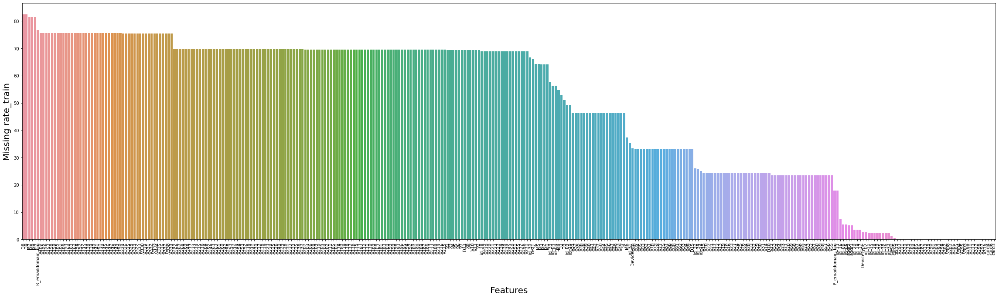

In [0]:
# plot missing rate : train 
import seaborn as sns

plt.subplots(figsize=(40,10))
plt.xticks(rotation='90')
sns.barplot(data_null_train.index, data_null_train)
plt.xlabel('Features', fontsize=20)
plt.ylabel('Missing rate_train', fontsize=20)

Text(0, 0.5, 'Missing rate_test')

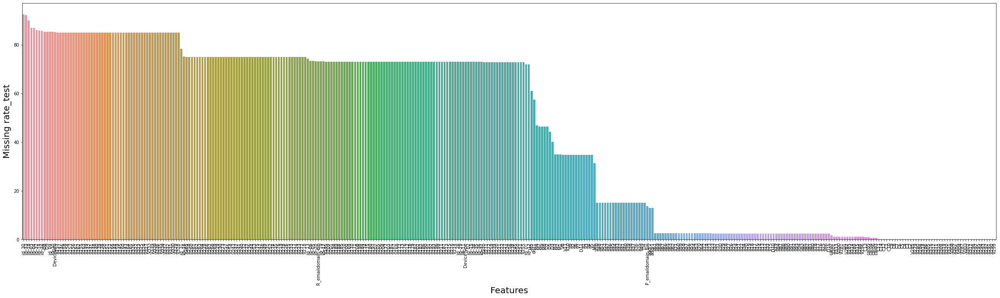

In [0]:
# plot missing rate : test 
import seaborn as sns

plt.subplots(figsize=(40,10))
plt.xticks(rotation='90')
sns.barplot(data_null_test.index, data_null_test)
plt.xlabel('Features', fontsize=20)
plt.ylabel('Missing rate_test', fontsize=20)

* Imputation des NAN par méthode usuelle (mode-mean-médiane) 

In [0]:
# imputation des valeurs manquantes ##################################################################""""""""""
# Maintenant, nous pouvons remplir les valeurs manquantes en utilisant la technique 2: mode
# ########################################"il faut faire attention au varaible qualitative : inimputable par la moyenne

def Imput(base) :
  base1=pd.DataFrame()
  base1=base.copy()
  for i in base.columns:
    if base[i].dtypes!= object:
        t =pd.DataFrame()
        t=base1[i].copy() # pour calculer la moyenne np.nanmean retourne inf et np.mean n'est pas valble dans le cas ou il ya des nan , donc on a procédeé par écarter de nanpourque on puisse calcler mean
            #np.nanmean(t.dropna(inplace=True))
        t.dropna(inplace=True)
        base1[i].fillna(np.mean(np.array(t)),inplace=True)
    if base[i].dtypes=='object':
      base1[i].fillna(base1[i].mode().iloc[0],inplace=True)
  return base1

Train_mode_mean=Imput(train)
Test_mode_mean=Imput(test)

# re-teste les valeurs manquantes de nouveau pour valider par deux méthodes 
[print(" nombre totale de valeurs manquentes pour train ",i, "est :",Train_mode_mean[i].isnull().sum() ) for i in Train_mode_mean.columns if Train_mode_mean[i].isnull().sum()!=0] # filtrage
# il y a plus des valeurs manquantes dans notre jeu de données
[print(" nombre totale de valeurs manquentes pour test ",i, "est :",Test_mode_mean[i].isnull().sum() ) for i in Test_mode_mean.columns if Test_mode_mean[i].isnull().sum()!=0] # filtrage
print(Train_mode_mean.shape)
print(Test_mode_mean.shape)

(50000, 420)
(506691, 419)


In [0]:

variabel_quantitative=[i for i in train.columns if train[i].dtypes=='int64' or train[i].dtypes=='float64']
variabel_qualitative=[i for i in train.columns if train[i].dtypes=='object']
print("taille des varaibles qualitative",len(variabel_qualitative))
print("taille des varaibles qauntitative",len(variabel_quantitative))

taille des varaibles qualitative 31
taille des varaibles qauntitative 389


I was able to impute the categorical variables using the steps listed below. I will gladly welcome any omissions or program that can perform such tasks automatically

Step1: Subsets the object's data types(all) into another container

Step2: Change np.NaN into an object data type, say None. Now, the container is made up of only objects data types

Step3: Change the entire container into categorical datasets

Step4: Encode the data set(i am using .cat.codes)

Step5: Change back the value of encoded None into np.NaN

Step5: Use KNN (from fancyimpute) to impute the missing values

Step6: Re-map the encoded dataset to its initial names

In [0]:
# Il est préférable d'utiliser LabelEncoder que ordinal encoder, LE: operations réversible: 0--> 'a' et 'a'-->0
from sklearn.preprocessing import LabelEncoder
##
train_enco=pd.DataFrame()
test_enco=pd.DataFrame()
###
for i in train.columns:
  train_enco[i]= train[i].copy()
###   
for j in test.columns:
  test_enco[j]= test[j].copy()
####
for col in variabel_qualitative:
    if col in train_enco.columns :
        le = LabelEncoder()
        le.fit(list(train_enco[col].astype(str).values) + list(test_enco[col].astype(str).values))
        train_enco[col] = le.transform(list(train_enco[col].astype(str).values)) # pour décodage train_enco[col]=le.inverse_transform(train_enco[col])
        test_enco[col] = le.transform(list(test_enco[col].astype(str).values))  # opération inverse train_enco[col]=le.inverse_transform(train_enco[col])
        # pour encodeur labelEncode ne différencie par entre nan ) numpy et nan=valeure ou objet
        # on va remplacer les nan coder par les nan
        if 'nan' in list((LabelEncoder().fit(list(test[col].astype(str).values))).classes_):
           test_enco[col][test_enco[col]==list(le.classes_).index('nan')]=np.nan
        if 'nan' in list((LabelEncoder().fit(list(train[col].astype(str).values))).classes_):
           train_enco[col][train_enco[col]==list(le.classes_).index('nan')]=np.nan


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


* Nombre des NAN par Variable

In [0]:
[print(" nombre totale de valeurs manquentes pour train ",i, "est :",train_enco[i].isnull().sum() ) for i in train_enco.columns if train_enco[i].isnull().sum()!=0] # filtrage


 nombre totale de valeurs manquentes pour train  card2 est : 697
 nombre totale de valeurs manquentes pour train  card3 est : 3
 nombre totale de valeurs manquentes pour train  card4 est : 6
 nombre totale de valeurs manquentes pour train  card5 est : 235
 nombre totale de valeurs manquentes pour train  card6 est : 3
 nombre totale de valeurs manquentes pour train  addr1 est : 2591
 nombre totale de valeurs manquentes pour train  addr2 est : 2591
 nombre totale de valeurs manquentes pour train  dist1 est : 33120
 nombre totale de valeurs manquentes pour train  D2 est : 26516
 nombre totale de valeurs manquentes pour train  D3 est : 25556
 nombre totale de valeurs manquentes pour train  D4 est : 23171
 nombre totale de valeurs manquentes pour train  D5 est : 32179
 nombre totale de valeurs manquentes pour train  D8 est : 41250
 nombre totale de valeurs manquentes pour train  D9 est : 41250
 nombre totale de valeurs manquentes pour train  D10 est : 12170
 nombre totale de valeurs manquen

41250

In [0]:
# standardidation et normalisation des varaibles continues : afin d'appliquer knn sur la base de données (train et test)_enco
# il faut faire scaling manuel

In [0]:
# fonction scaling et inverse 
def scaling_min_max(base,minn,maxx, varaible_continue):
  base1=base.copy()
  for i in varaible_continue:
    base1[i]=(base1[i]-minn[i])/(maxx[i]-minn[i]).astype(base[i].dtypes)
  return base1
def descaling_min_max(base_scaled,minn,maxx, varaible_continue):
  base1=base_scaled.copy()
  for i in varaible_continue:
    t=(maxx[i]- minn[i])
    base1[i]= (t)*(np.array(base1[i]).astype('float64')).copy() +  minn[i]
  return base1


*  Scaling pour faire KNN

In [0]:
#scaling 
v=variabel_quantitative[1:len(variabel_quantitative)] # is fraud est catégorielle mais il est déclarer comme varaible continue
Min_train=train_enco[v].min()
Max_train=train_enco[v].max()
Min_test=test_enco[v].min()
Max_test=test_enco[v].max()
#Min_test['id_32'] # accées aux valeures 



In [0]:
train_enco=scaling_min_max(train_enco,Min_train,Max_train,v)
test_enco=scaling_min_max(test_enco,Min_test,Max_test,v)

In [0]:
variabel_quantitative_enco=[i for i in train_enco.columns if train_enco[i].dtypes=='int64' or train_enco[i].dtypes=='float64']
variabel_qualitative_enco=[i for i in train_enco.columns if train_enco[i].dtypes=='object']
print("taille des varaibles qualitative apres encoding",len(variabel_qualitative_enco)) # forcement égale 0
print("taille des varaibles qauntitative apres encoding",len(variabel_quantitative_enco)) # forcement égale len(train_enco.columns)


taille des varaibles qualitative apres encoding 0
taille des varaibles qauntitative apres encoding 420


* Imputation des valeurs manquantes par KNN

In [0]:
# ipmutaion par KNN  # d'abord la coversion de data frame to list by train.values.tolist(), to data frame by pandas.DataFrame
# scalinge est obligatoire pour faire KNN
#########"" catégorical

from sklearn.impute import KNNImputer  # pour varaible continue
from fancyimpute import KNN

#from sklearn.impute import SimpleImputer # pour mixte: continue et qualitative

###########"fonction programmer knn
def knn_impute(base2,nobmer_neighbors):
  imputer = KNNImputer(n_neighbors=nobmer_neighbors)
  return  pd.DataFrame((imputer.fit_transform(base2.values.tolist())),columns=base2.columns)

##### fonction rest api 
### par REST API 
def knn_impute_api(base,nobmer_neighbors):
  return  pd.DataFrame(KNN(k=nobmer_neighbors).fit_transform(base),columns=base.columns)




/usr/local/lib/python3.6/dist-packages/sklearn/externals/six.py:31: FutureWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", FutureWarning)


Miantenaant on a deux fonction pour imputer selon KNN 



1.   Knn_imputer 
2.   knn_imputer_api 


Pour cette partie, on appliquera l'un des deux méthdes 




In [0]:
# reduce de mémoire  : compression 
test_enco=reduce_mem_usage(test_enco)
train_enco= reduce_mem_usage(train_enco)

  1%|▏         | 6/420 [00:00<00:08, 47.83it/s]

Mem. usage decreased to 411.22 Mb (74.7% reduction)


100%|██████████| 420/420 [00:11<00:00, 35.81it/s] 

Mem. usage decreased to 40.58 Mb (74.7% reduction)


* KNN imputation 

In [0]:
train_enco

,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,dist1,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D8,D9,D10,D11,D15,M1,M2,M3,...,V335,V336,V337,V338,V339,id_01,id_02,id_03,id_04,id_05,id_06,id_09,id_10,id_11,id_12,id_13,id_14,id_15,id_16,id_17,id_18,id_19,id_20,id_28,id_29,id_30,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo,P_emaildomain_bin,P_emaildomain_suffix,R_emaildomain_bin,R_emaildomain_suffix
0,0,0.000000e+00,0.014122,4,0.743164,NaN,0.387695,1.0,0.306641,1.0,0.488525,0.831543,0.002687,0.000528,0.000418,0.0,0.000000,0.000000,0.000858,0.000000,0.000000,0.005554,0.000000,0.001274,0.000000,0.000592,0.001275,0.022018,NaN,0.021103,NaN,NaN,NaN,NaN,0.018433,0.086487,0.104797,1.0,1.0,1.0,...,NaN,NaN,NaN,NaN,NaN,1.000000,0.069763,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1,NaN,0.130493,1.0,1.0,0.511719,NaN,0.773926,0.078552,1.0,1.0,NaN,NaN,1.00,NaN,3.0,1.0,0.0,1.0,1.0,1.0,NaN,NaN,NaN,NaN,NaN
1,0,8.940697e-07,0.005943,4,0.100830,0.607910,0.387695,2.0,0.014595,1.0,0.511230,0.831543,NaN,0.000528,0.000418,0.0,0.000000,0.000000,0.000858,0.000000,0.000000,0.000000,0.000000,0.000637,0.000000,0.000592,0.001275,0.000000,NaN,NaN,0.148438,NaN,NaN,NaN,0.000000,NaN,0.104797,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,0.950195,0.097961,NaN,NaN,0.395264,0.950195,NaN,NaN,1.0,1,0.73584,0.260986,1.0,1.0,0.511719,NaN,0.912598,0.714355,1.0,1.0,NaN,14.0,1.00,0.0,2.0,1.0,0.0,0.0,1.0,1.0,2.0,4.0,0.0,NaN,NaN
2,0,6.258488e-05,0.012154,4,0.210571,0.779785,0.387695,4.0,0.481689,2.0,0.522949,0.831543,0.040619,0.000528,0.000418,0.0,0.000000,0.000000,0.000858,0.000000,0.000000,0.005554,0.000000,0.000637,0.000000,0.000592,0.001275,0.000000,NaN,NaN,0.148438,NaN,NaN,NaN,0.000000,0.654297,0.502441,1.0,1.0,1.0,...,NaN,NaN,NaN,NaN,NaN,0.950195,0.190796,0.523926,1.0,0.395264,1.000000,0.589844,1.0,1.0,1,0.79248,NaN,0.0,0.0,0.162842,NaN,0.542969,0.075012,0.0,0.0,NaN,0.0,NaN,NaN,NaN,0.0,0.0,1.0,1.0,0.0,1.0,5.0,0.0,NaN,NaN
3,0,8.976460e-05,0.010292,4,0.984863,0.934082,0.387695,2.0,0.124084,2.0,0.854492,0.831543,NaN,0.001057,0.002092,0.0,0.000000,0.000000,0.003431,0.000000,0.000000,0.005554,0.000000,0.000637,0.000000,0.014809,0.001275,0.176147,0.176147,0.000000,0.262695,0.0,NaN,NaN,0.119141,NaN,0.244995,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,0.950195,0.221069,NaN,NaN,0.395264,0.939941,NaN,NaN,1.0,1,0.79248,NaN,1.0,1.0,0.968750,NaN,0.133057,0.726562,1.0,1.0,NaN,0.0,NaN,NaN,NaN,0.0,0.0,1.0,1.0,0.0,NaN,9.0,0.0,NaN,NaN
4,0,9.608269e-05,0.010292,1,0.201050,0.828125,0.387695,2.0,0.014595,1.0,0.727051,0.831543,NaN,0.000528,0.000418,0.0,0.000000,0.000000,0.000858,0.000000,0.000574,0.000000,0.000524,0.000637,0.000000,0.000592,0.001275,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,1.000000,0.006351,0.523926,1.0,0.406982,1.000000,0.589844,1.0,1.0,1,NaN,0.260986,0.0,0.0,0.511719,0.222168,0.751465,0.848145,0.0,0.0,NaN,0.0,0.75,NaN,3.0,1.0,0.0,1.0,1.0,0.0,0.0,4.0,0.0,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49995,0,1.000000e+00,0.024170,4,0.930664,0.441895,0.387695,4.0,0.919922,2.0,0.452393,0.831543,NaN,0.002113,0.001255,0.0,0.000000,0.010345,0.003431,0.000000,0.000000,0.016663,0.000000,0.002548,0.000000,0.045013,0.002550,0.643066,0.643066,0.003246,NaN,NaN,NaN,NaN,0.547363,NaN,0.592285,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,0.950195,0.112183,NaN,NaN,0.395264,1.000000,NaN,NaN,1.0,0,0.79248,0.260986,1.0,1.0,0.511719,0.111084,0.000000,0.478516,1.0,1.0,0.0,NaN,0.75,NaN,3.0,1.0,0.0,1.0,1.0,0.0,1.0,NaN,NaN,NaN,NaN
49996,0,1.000000e+00,0.041351,2,0.808594,0.828125,0.387695,4.0,0.919922,1.0,0.522949,0.831543,NaN,0.000528,0.000418,0.0,0.000858,0.000000,0.000858,0.000000,0.000574,0.000000,0.000524,0.000637,0.

In [0]:
# sur base de train
# pour éviter la planatation de session on va appliuer knn sur des sous bases de la base globale
Train_knn=train_enco.copy()
for i in np.arange(0,51):
  t= i*990
  e=(i+1)*1000 
  print(i)
  if i == 50:
    e=len(train_enco)
  c=train_enco[t:e]
  l=knn_impute_api(pd.DataFrame(c),2)
  Train_knn[t:e]=(np.array(l)).copy()


0
Imputing row 1/1000 with 203 missing, elapsed time: 2.185
Imputing row 101/1000 with 118 missing, elapsed time: 2.478
Imputing row 201/1000 with 172 missing, elapsed time: 2.757
Imputing row 301/1000 with 187 missing, elapsed time: 3.044
Imputing row 401/1000 with 197 missing, elapsed time: 3.322
Imputing row 501/1000 with 171 missing, elapsed time: 3.583
Imputing row 601/1000 with 192 missing, elapsed time: 3.843
Imputing row 701/1000 with 171 missing, elapsed time: 4.100
Imputing row 801/1000 with 83 missing, elapsed time: 4.386
Imputing row 901/1000 with 80 missing, elapsed time: 4.657
[KNN] Warning: 1000/420000 still missing after imputation, replacing with 0
1
Imputing row 1/1010 with 181 missing, elapsed time: 2.226
Imputing row 101/1010 with 190 missing, elapsed time: 2.518
Imputing row 201/1010 with 176 missing, elapsed time: 2.821
Imputing row 301/1010 with 188 missing, elapsed time: 3.116
Imputing row 401/1010 with 178 missing, elapsed time: 3.404
Imputing row 501/1010 with

In [0]:
Train_knn

,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,dist1,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D8,D9,D10,D11,D15,M1,M2,M3,...,V335,V336,V337,V338,V339,id_01,id_02,id_03,id_04,id_05,id_06,id_09,id_10,id_11,id_12,id_13,id_14,id_15,id_16,id_17,id_18,id_19,id_20,id_28,id_29,id_30,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo,P_emaildomain_bin,P_emaildomain_suffix,R_emaildomain_bin,R_emaildomain_suffix
0,0.0,0.000000e+00,0.014122,4.0,0.743164,0.844727,0.387695,1.0,0.306641,1.0,0.488525,0.831543,0.002687,0.000528,0.000418,0.0,0.000000,0.000000,0.000858,0.000000,0.000000,0.005554,0.000000,0.001274,0.000000,0.000592,0.001275,0.022018,0.163330,0.021103,0.225708,0.042572,0.426758,0.111877,0.018433,0.086487,0.104797,1.0,1.0,1.000000,...,0.011879,0.000000,0.019119,0.010834,0.019119,1.000000,0.069763,0.523926,1.0,0.411865,0.482666,0.589844,1.0,1.0,1.0,0.127563,0.130493,1.0,1.0,0.511719,0.222168,0.773926,0.078552,1.0,1.0,0.480713,6.996094,1.000000,3.000000,3.0,1.0,0.0,1.0,1.0,1.0,0.503418,4.863281,0.0,4.250000,0.000000
1,0.0,8.940697e-07,0.005943,4.0,0.100830,0.607910,0.387695,2.0,0.014595,1.0,0.511230,0.831543,0.002539,0.000528,0.000418,0.0,0.000000,0.000000,0.000858,0.000000,0.000000,0.000000,0.000000,0.000637,0.000000,0.000592,0.001275,0.000000,0.338135,0.024582,0.148438,0.044373,0.426758,0.110474,0.000000,0.138672,0.104797,1.0,1.0,1.000000,...,0.000000,0.000000,0.019058,0.010803,0.019058,0.950195,0.097961,0.523926,1.0,0.395264,0.950195,0.630371,1.0,1.0,1.0,0.735840,0.260986,1.0,1.0,0.511719,0.222168,0.912598,0.714355,1.0,1.0,0.500000,14.000000,1.000000,0.000000,2.0,1.0,0.0,0.0,1.0,1.0,2.000000,4.000000,0.0,7.000000,0.000000
2,0.0,6.258488e-05,0.012154,4.0,0.210571,0.779785,0.387695,4.0,0.481689,2.0,0.522949,0.831543,0.040619,0.000528,0.000418,0.0,0.000000,0.000000,0.000858,0.000000,0.000000,0.005554,0.000000,0.000637,0.000000,0.000592,0.001275,0.000000,0.042358,0.025650,0.148438,0.119263,0.075867,0.065186,0.000000,0.654297,0.502441,1.0,1.0,1.000000,...,0.008133,0.006187,0.000000,0.000000,0.000000,0.950195,0.190796,0.523926,1.0,0.395264,1.000000,0.589844,1.0,1.0,1.0,0.792480,0.130493,0.0,0.0,0.162842,0.135010,0.542969,0.075012,0.0,0.0,0.000000,0.000000,0.750000,2.117188,3.0,0.0,0.0,1.0,1.0,0.0,1.000000,5.000000,0.0,4.535156,0.000000
3,0.0,8.976460e-05,0.010292,4.0,0.984863,0.934082,0.387695,2.0,0.124084,2.0,0.854492,0.831543,0.000365,0.001057,0.002092,0.0,0.000000,0.000000,0.003431,0.000000,0.000000,0.005554,0.000000,0.000637,0.000000,0.014809,0.001275,0.176147,0.176147,0.000000,0.262695,0.000000,0.197021,0.130493,0.119141,0.187134,0.244995,1.0,1.0,1.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.950195,0.221069,0.523926,1.0,0.395264,0.939941,0.589844,1.0,1.0,1.0,0.792480,0.260986,1.0,1.0,0.968750,0.143555,0.133057,0.726562,1.0,1.0,1.000000,0.000000,0.862305,1.000000,3.0,0.0,0.0,1.0,1.0,0.0,1.000000,9.000000,0.0,6.496094,0.000000
4,0.0,9.608269e-05,0.010292,1.0,0.201050,0.828125,0.387695,2.0,0.014595,1.0,0.727051,0.831543,0.037842,0.000528,0.000418,0.0,0.000000,0.000000,0.000858,0.000000,0.000574,0.000000,0.000524,0.000637,0.000000,0.000592,0.001275,0.000000,0.626953,0.279053,0.148438,0.280518,0.042419,0.132812,0.000000,0.062042,0.104797,1.0,1.0,0.524414,...,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.006351,0.523926,1.0,0.406982,1.000000,0.589844,1.0,1.0,1.0,0.571777,0.260986,0.0,0.0,0.511719,0.222168,0.751465,0.848145,0.0,0.0,0.648438,0.000000,0.750000,3.000000,3.0,1.0,0.0,1.0,1.0,0.0,0.000000,4.000000,0.0,4.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49995,0.0,1.000000e+00,0.024170,4.0,0.930664,0.441895,0.387695,4.0,0.919922,2

In [0]:
[print(" nombre totale de valeurs manquentes pour train ",i, "est :",Train_knn[i].isnull().sum() ) for i in Train_knn.columns if Train_knn[i].isnull().sum()!=0] # filtrage


[]

In [0]:
# sur base de test 
# sur base de train
# pour éviter la planatation de session on va appliuer knn sur des sous bases de la base globale
Test_knn=test_enco.copy()
for i in np.arange(0,501):
  t= i*1000
  e=(i+1)*1000 + 10
  print(i)
  if i == 500:
    e=len(test_enco)
  c=test_enco[t:e]
  l=knn_impute_api(pd.DataFrame(c),2)
  Test_knn[t:e]=(np.array(l)).copy()


Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
Imputing row 901/1010 with 165 missing, elapsed time: 4.696
Imputing row 1001/1010 with 192 missing, elapsed time: 4.980
[KNN] Warning: 1010/423190 still missing after imputation, replacing with 0
121
Imputing row 1/1010 with 192 missing, elapsed time: 2.283
Imputing row 101/1010 with 188 missing, elapsed time: 2.546
Imputing row 201/1010 with 120 missing, elapsed time: 2.819
Imputing row 301/1010 with 193 missing, elapsed time: 3.085
Imputing row 401/1010 with 174 missing, elapsed time: 3.344
Imputing row 501/1010 with 172 missing, elapsed time: 3.633
Imputing row 601/1010 with 73 missing, elapsed time: 3.907
Imputing row 701/1010 with 119 missing, elapsed time: 4.169
Imputing row 801/1010 with 120 missing, elapsed time: 4.447
Imputing row 901/1010 with 167 missing, elapsed time: 4.729
Imputing row 1001/1010 with 171 missing, elapsed time: 5.026
[KNN] Warning: 1010/423190 still missing after imputation, repl

In [0]:
Test_knn

,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,dist1,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D8,D9,D10,D11,D15,M1,M2,M3,M4,...,V335,V336,V337,V338,V339,id_01,id_02,id_03,id_04,id_05,id_06,id_09,id_10,id_11,id_12,id_13,id_14,id_15,id_16,id_17,id_18,id_19,id_20,id_28,id_29,id_30,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo,P_emaildomain_bin,P_emaildomain_suffix,R_emaildomain_bin,R_emaildomain_suffix
0,0.000000,0.003109,4.0,0.541016,0.022003,0.378906,4.0,0.919922,2.0,0.159058,0.836914,0.000124,0.002033,0.001832,0.0,0.000000,0.007980,0.002499,0.000000,0.000000,0.010490,0.000000,0.002237,0.000448,0.073608,0.007526,0.653809,0.653809,0.025085,0.364746,0.024811,0.009354,0.401855,0.383057,0.229858,0.375000,1.0,1.000000,0.000000,0.544434,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.549805,0.280273,0.521973,1.0,0.608887,1.000000,0.666504,1.0,1.0,1.0,0.307617,0.291748,1.0,1.0,0.976562,0.222168,0.573730,0.826660,1.0,1.0,0.484863,3.000000,0.484375,4.468750,3.0,0.0,0.0,1.0,0.0,1.0,1.399414,4.0,0.0,4.332031,0.0
1,0.000002,0.004768,4.0,0.187988,0.022003,0.378906,4.0,0.919922,2.0,0.452393,0.836914,0.000495,0.001017,0.000611,0.0,0.000000,0.000000,0.000625,0.000000,0.000000,0.003496,0.000000,0.000448,0.000448,0.007683,0.002510,0.232422,0.232422,0.006504,0.581055,0.006435,0.076599,0.260986,0.211792,0.717773,0.581055,1.0,0.000000,0.000000,0.000000,...,0.006180,0.001730,0.000000,0.000000,0.000000,1.000000,0.003578,0.521973,1.0,0.608887,1.000000,0.666504,1.0,1.0,0.0,0.117554,0.291748,0.0,0.0,0.515625,0.153931,0.775391,0.478516,0.0,0.0,0.430908,3.000000,0.399902,0.454346,3.0,1.0,0.0,1.0,1.0,1.0,1.560547,0.0,0.0,1.830078,0.0
2,0.000005,0.016647,4.0,0.199707,0.948242,0.378906,4.0,0.919922,2.0,0.845215,0.836914,0.326172,0.000678,0.000611,0.0,0.000000,0.000000,0.003122,0.000000,0.000000,0.006992,0.000000,0.000895,0.000000,0.014084,0.002510,0.213745,0.213745,0.009293,0.088928,0.009193,0.009041,0.396484,0.124634,0.154053,0.088928,1.0,1.000000,0.000000,0.000000,...,0.000270,0.000000,0.000000,0.000000,0.000000,0.950195,0.185181,0.521973,1.0,0.616699,1.000000,0.666504,1.0,1.0,1.0,0.788574,0.250000,1.0,1.0,0.976562,0.222168,0.300049,0.726562,1.0,1.0,0.000000,7.046875,0.399902,1.489258,3.0,0.0,1.0,1.0,0.0,0.0,1.000000,5.0,0.0,3.505859,0.0
3,0.000005,0.027740,4.0,0.574219,0.520020,0.378906,4.0,0.481689,2.0,0.238647,0.836914,0.002104,0.001695,0.000611,0.0,0.000000,0.002659,0.000625,0.000000,0.000000,0.003496,0.000000,0.000895,0.000000,0.004482,0.005020,0.065552,0.065552,0.038116,0.221802,0.037689,0.014961,0.404053,0.221802,0.274170,0.221802,1.0,1.000000,1.000000,0.000000,...,0.001441,0.000254,0.000000,0.000000,0.000000,0.549805,0.252930,0.521973,1.0,0.608887,1.000000,0.666504,1.0,1.0,1.0,0.307617,0.291748,0.0,0.0,0.976562,0.222168,0.573730,0.826660,0.0,0.0,1.000000,3.000000,0.491943,3.000000,3.0,0.0,0.0,1.0,0.0,1.0,1.000000,4.0,0.0,0.411133,0.0
4,0.000006,0.006615,4.0,0.978027,0.704102,0.378906,2.0,0.124084,2.0,0.372803,0.836914,0.000742,0.002033,0.001832,0.0,0.000000,0.005318,0.003122,0.000000,0.000000,0.008743,0.000000,0.002686,0.000000,0.008965,0.007526,0.034332,0.034332,0.000000,0.020172,0.000000,0.022110,0.340576,0.020172,0.024918,0.020172,1.0,1.000000,1.000000,1.025391,...,0.017426,0.002031,0.001044,0.001271,0.000639,0.049988,0.328613,0.521973,1.0,0.661621,0.669922,0.666504,1.0,1.0,1.0,0.307617,0.166626,1.0,1.0,0.976562,0.222168,0.819336,0.726562,1.0,1.0,0.432617,3.000000,0.399902,2.390625,3.0,0.0,0.0,1.0,0.0,1.0,0.502930,4.0,0.0,6.449219,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
506686,1.000000,0.009216,0.0,0.737793,0.549805,0.644043,2.0,0.905273,2.0,0.418213,0.543457,0.000742,0.0

In [0]:
# calibrage de varaible qualitative( knn returne la moyenne de la valeurs entres les deux plus proches voisins) ( 0.6 ==>> 1, 0.4 ==>> 0)
Train_knn[variabel_qualitative]=np.around(Train_knn[variabel_qualitative]) # rounds to nearest even value
Test_knn[variabel_qualitative]=np.around(Test_knn[variabel_qualitative]) # rounds to nearest even value

In [0]:
Test_knn

,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,dist1,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D8,D9,D10,D11,D15,M1,M2,M3,M4,...,V335,V336,V337,V338,V339,id_01,id_02,id_03,id_04,id_05,id_06,id_09,id_10,id_11,id_12,id_13,id_14,id_15,id_16,id_17,id_18,id_19,id_20,id_28,id_29,id_30,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo,P_emaildomain_bin,P_emaildomain_suffix,R_emaildomain_bin,R_emaildomain_suffix
0,0.000000,0.003109,4.0,0.541016,0.022003,0.378906,4.0,0.919922,2.0,0.159058,0.836914,0.000124,0.002033,0.001832,0.0,0.000000,0.007980,0.002499,0.000000,0.000000,0.010490,0.000000,0.002237,0.000448,0.073608,0.007526,0.653809,0.653809,0.025085,0.364746,0.024811,0.009354,0.401855,0.383057,0.229858,0.375000,1.0,1.0,0.0,1.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.549805,0.280273,0.521973,1.0,0.608887,1.000000,0.666504,1.0,1.0,1.0,0.307617,0.291748,1.0,1.0,0.976562,0.222168,0.573730,0.826660,1.0,1.0,0.0,3.0,0.484375,4.0,3.0,0.0,0.0,1.0,0.0,1.0,1.0,4.0,0.0,4.0,0.0
1,0.000002,0.004768,4.0,0.187988,0.022003,0.378906,4.0,0.919922,2.0,0.452393,0.836914,0.000495,0.001017,0.000611,0.0,0.000000,0.000000,0.000625,0.000000,0.000000,0.003496,0.000000,0.000448,0.000448,0.007683,0.002510,0.232422,0.232422,0.006504,0.581055,0.006435,0.076599,0.260986,0.211792,0.717773,0.581055,1.0,0.0,0.0,0.0,...,0.006180,0.001730,0.000000,0.000000,0.000000,1.000000,0.003578,0.521973,1.0,0.608887,1.000000,0.666504,1.0,1.0,0.0,0.117554,0.291748,0.0,0.0,0.515625,0.153931,0.775391,0.478516,0.0,0.0,0.0,3.0,0.399902,0.0,3.0,1.0,0.0,1.0,1.0,1.0,2.0,0.0,0.0,2.0,0.0
2,0.000005,0.016647,4.0,0.199707,0.948242,0.378906,4.0,0.919922,2.0,0.845215,0.836914,0.326172,0.000678,0.000611,0.0,0.000000,0.000000,0.003122,0.000000,0.000000,0.006992,0.000000,0.000895,0.000000,0.014084,0.002510,0.213745,0.213745,0.009293,0.088928,0.009193,0.009041,0.396484,0.124634,0.154053,0.088928,1.0,1.0,0.0,0.0,...,0.000270,0.000000,0.000000,0.000000,0.000000,0.950195,0.185181,0.521973,1.0,0.616699,1.000000,0.666504,1.0,1.0,1.0,0.788574,0.250000,1.0,1.0,0.976562,0.222168,0.300049,0.726562,1.0,1.0,0.0,7.0,0.399902,1.0,3.0,0.0,1.0,1.0,0.0,0.0,1.0,5.0,0.0,4.0,0.0
3,0.000005,0.027740,4.0,0.574219,0.520020,0.378906,4.0,0.481689,2.0,0.238647,0.836914,0.002104,0.001695,0.000611,0.0,0.000000,0.002659,0.000625,0.000000,0.000000,0.003496,0.000000,0.000895,0.000000,0.004482,0.005020,0.065552,0.065552,0.038116,0.221802,0.037689,0.014961,0.404053,0.221802,0.274170,0.221802,1.0,1.0,1.0,0.0,...,0.001441,0.000254,0.000000,0.000000,0.000000,0.549805,0.252930,0.521973,1.0,0.608887,1.000000,0.666504,1.0,1.0,1.0,0.307617,0.291748,0.0,0.0,0.976562,0.222168,0.573730,0.826660,0.0,0.0,1.0,3.0,0.491943,3.0,3.0,0.0,0.0,1.0,0.0,1.0,1.0,4.0,0.0,0.0,0.0
4,0.000006,0.006615,4.0,0.978027,0.704102,0.378906,2.0,0.124084,2.0,0.372803,0.836914,0.000742,0.002033,0.001832,0.0,0.000000,0.005318,0.003122,0.000000,0.000000,0.008743,0.000000,0.002686,0.000000,0.008965,0.007526,0.034332,0.034332,0.000000,0.020172,0.000000,0.022110,0.340576,0.020172,0.024918,0.020172,1.0,1.0,1.0,1.0,...,0.017426,0.002031,0.001044,0.001271,0.000639,0.049988,0.328613,0.521973,1.0,0.661621,0.669922,0.666504,1.0,1.0,1.0,0.307617,0.166626,1.0,1.0,0.976562,0.222168,0.819336,0.726562,1.0,1.0,0.0,3.0,0.399902,2.0,3.0,0.0,0.0,1.0,0.0,1.0,1.0,4.0,0.0,6.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
506686,1.000000,0.009216,0.0,0.737793,0.549805,0.644043,2.0,0.905273,2.0,0.418213,0.543457,0.000742,0.000339,0.000305,0.0,0.000625,0.000000,0.000625,0.000617,0.000000,0.000000,0.000000,0.000448,0.000448,0.000640,0.001255,0.000000,0.045929,0.006283,0.000000,0.006210,0.034241,0.562988,0.000000,0.000000,0

In [0]:
# nombre des valeurs manquentes par colonnes aprés l'imputations 
Test_knn.isnull().sum()

TransactionDT           0
TransactionAmt          0
ProductCD               0
card1                   0
card2                   0
                       ..
DeviceInfo              0
P_emaildomain_bin       0
P_emaildomain_suffix    0
R_emaildomain_bin       0
R_emaildomain_suffix    0
Length: 419, dtype: int64

#sauvgarde des données imputées 

In [0]:
Train_knn.to_csv(mypath+"Train_knn.csv",index=False) # save data .csv
Test_knn.to_csv(mypath+"Test_knn.csv",index=False) # save data .csv
Train_mode_mean.to_csv(mypath+"Train_mode_mean.csv",index=False) # save data .csv
Test_mode_mean.to_csv(mypath+"Test_mode_mean.csv",index=False) # save data .csv


* Inverse de LabelEncoder et l'inverse de scaling :

In [0]:
#descaling 
######################################""

Test_knn=descaling_min_max(Test_knn,Min_test,Max_test,v)
Train_knn=descaling_min_max(Train_knn,Min_train,Max_train,v)


In [0]:

#### décoder les varaibles bianaire a varaible qualitataives 
for col in variabel_qualitative:
    if col in Train_knn.columns :
        le = LabelEncoder()
        le.fit(list(train[col].astype(str).values) + list(test[col].astype(str).values))
        Train_knn[col] = le.inverse_transform(Train_knn[col].astype(int) ) # il faut convertir le series des valeures en integer
        Test_knn[col] = le.inverse_transform(Test_knn[col].astype(int) ) # il faut convertir le series des valeures en integer

In [0]:
print("'True' si les jeux des données ne contient plus des valeurs manquantes et doublantes: \n\n")
#vérification :
# re-teste les valeurs manquantes de nouveau pour valider par deux méthodes 
[print(" nombre totale de valeurs manquentes pour train ",i, "est :",Train_mode_mean[i].isnull().sum() ) for i in Train_mode_mean.columns if Train_mode_mean[i].isnull().sum()!=0]==[] # filtrage
# il y a plus des valeurs manquantes dans notre jeu de données
[print(" nombre totale de valeurs manquentes pour test ",i, "est :",Test_mode_mean[i].isnull().sum() ) for i in Test_mode_mean.columns if Test_mode_mean[i].isnull().sum()!=0]==[] # filtrage
# re-teste les valeurs manquantes de nouveau pour valider par deux méthodes 
[print(" nombre totale de valeurs manquentes pour train_knn ",i, "est :",Train_knn[i].isnull().sum() ) for i in Train_knn.columns if Train_knn[i].isnull().sum()!=0]==[] # filtrage
# il y a plus des valeurs manquantes dans notre jeu de données
[print(" nombre totale de valeurs manquentes pour test_knn ",i, "est :",Test_knn[i].isnull().sum() ) for i in Test_knn.columns if Test_knn[i].isnull().sum()!=0] ==[]# filtrage

'True' si les jeux des données ne contient plus des valeurs manquantes et doublantes: 




True

Conculusion :
pour le moment, on a deux bases de données imputées de façons différentes 

* Test_mode_mean
*Train_mode_mean
*Test_knn
*Train_knn

Visualisation de la relation entre is fraud et les autres varaibles 

# corrélation:analyse bivarié + EDA ( Data Exploring)

In [0]:
# analyse bivarie # univarie
# abérrante(pas de sens), car les fraudeurs, ce sont des transactions abérrantes + stat desc (corrélation)

# on trace la sensibilité de isfraud en fonction de chaque varaible ; pour détecter les varaibles pértinentes 
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# la courbe de sensibilité entre varaible qualitative et quantitative, il faut déviser y en tranche( classification unsupervisé:discrétiser la varible y= découpage en classe)et tracer la varaition de x pour chaque tranche de y et pour chaque modalité
# méthode de discrétisation :  La méthode des amplitudes, La méthode des moyennes emboitées, La méthode des grandes différences relatives 
# il faut minimiser le nombre de classe === > probleme de classification non supervisé 
# test de khi_deux 
# boitamoustage : qualitative vs quantitative
#On est souvent emmené à coder une variable quantitative en une variable qualitative pour 
# on fait les courbes par des bases des données non imputées 
#dro_p(train,train,0.5)
#train.dropna()  # supprimer chaque ligne contient au moins une valeurs manquantes
# seulment pour l.copy()
#x['TransactionID_x']=train['TransactionID_x']


/usr/local/lib/python3.6/dist-packages/pandas/plotting/_matplotlib/core.py:338: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
/usr/local/lib/python3.6/dist-packages/pandas/plotting/_matplotlib/core.py:338: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
/usr/local/lib/python3.6/dist-packages/pandas/plotting/_matplotlib/core.py:338: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) a

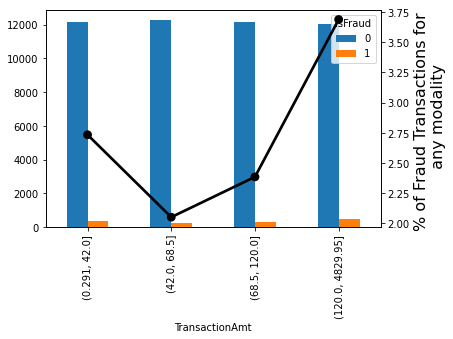

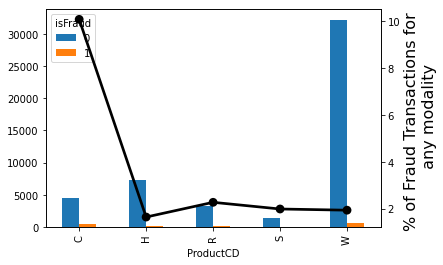

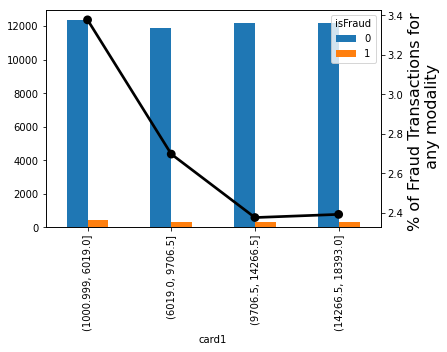

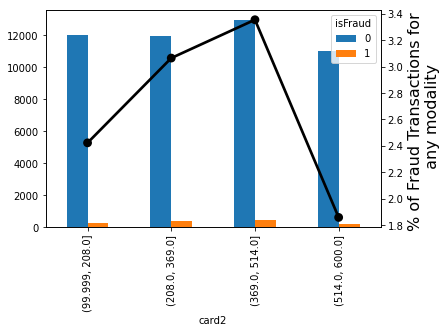

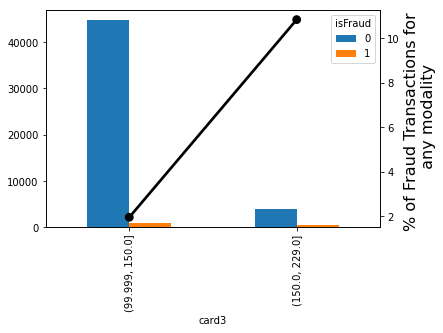

...

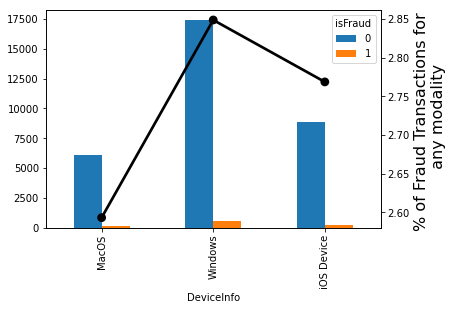

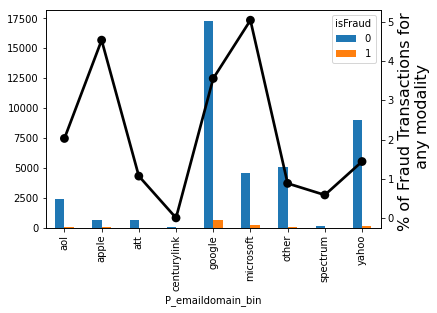

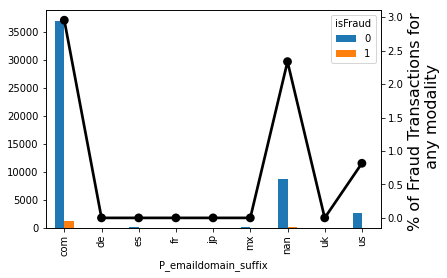

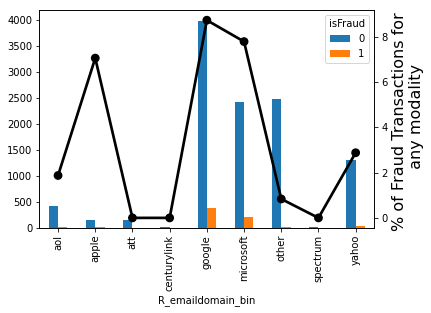

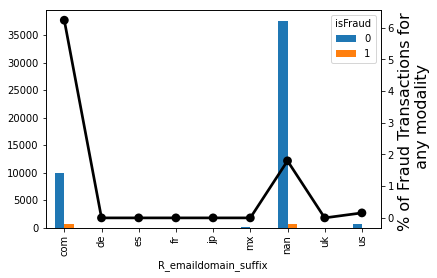

In [0]:
# la distribution de la fonction de la répartion pour isfraud=1 et =0 est réagissent de maniere différentes entre les differentes modalités
#la loi de varaible isFraud ne réagissengt pas de meme maniere au niveaux des différentes modalités
# pour vérifier de maniere statiqtique # consultez le cours de non paramétrique # partie d'ajustement et de comparaison
for i in train.columns[2:]:
  if (train[i].dtypes=='int64' or train[i].dtypes=='float64' )  and ((train[i].value_counts().shape[0] ) > 40)== True  : #and  (True in [i for i  in (train[i].value_counts() > 0.3*len(train[i]))]) ==False: # pil faut au moins en moyenne chaque valeurs sera répeter 13 fois
     y=pd.qcut(train[i],4,duplicates='drop')#,labels=["Ag1","Ag2", "Ag3"]), 15 a optimiser , comme on a choisit aleatoirement 15 donc on ne peur pas éradique les vr continues non corrélés avec isFraud. Par contre, on peut les supprimer dans le cas des varaibles qualit, mais on préfére de faire des test non para
  else:
    y=train[i].copy()

  x= train.isFraud.copy()
  #y=train[i].copy() 
  y=pd.DataFrame(y)
  x=pd.DataFrame(x)
  y['isFraud']=x.astype('category') # des pairs afin de faire le croisement 
  t=pd.crosstab(y[y.columns[0]],y['isFraud']).plot.bar()
######
  if (train[i].dtypes!='object' or train[i].dtypes=='object') :
    gt = t.twinx()
    tmp = pd.crosstab(y[i], y['isFraud'], normalize='index') * 100
    tmp = tmp.reset_index()
    tmp.rename(columns={0:'NoFraud', 1:'Fraud'}, inplace=True) 
    gt = sns.pointplot(x=str(i), y='Fraud', data=tmp, color='black', legend=False)
    gt.set_ylabel("% of Fraud Transactions for \n any modality", fontsize=16) # pour comparer les pourcentages de frauds parmi les non frauds de chaque modalité, par rapport ceux des autres modalités : pour prendre en compte le poids de chaque modalité



In [0]:
#####################333 VISUALISATION DE LA DISTRIBUTION DES VARAIABLES 
def explore_data(features, inputs, path):
    ''' Explore data by plotting KDE graphs. '''
    
    #Define figure subplots
    fig = plt.figure(1)
    fig.subplots_adjust(bottom= -1, left=0.025, top = 2, right=0.975)
    
    #Loop through features    
    i = 1
    for col in features.columns:
      if i:  
        #Set subplot and plot format        
        sns.set_style("whitegrid")
        sns.set_context("paper", font_scale = 0.5, rc={"lines.linewidth": 1})
        plt.subplot(round((len(features.columns)/5)+1),5,0 + i)  #  10 courbes pour chaque ligne 
        j = i - 1
        
        #Plot KDE for all labels
        sns.distplot(inputs[inputs['isFraud'] == 1].iloc[:,j], hist = False, label = 'Fraud')
        sns.distplot(inputs[inputs['isFraud'] == 0].iloc[:,j], hist = False, label = 'No Fraud')
        #sns.distplot(inputs[inputs['FTR'] == 'H'].iloc[:,j], hist = False, label = 'HOME')
        plt.legend();
        i = i + 1
    
    #Define plot format    
    DefaultSize = fig.get_size_inches()
    fig.set_size_inches((DefaultSize[0]*2.2, DefaultSize[1]*2.2))

    plt.show()
    
    #Compute and print label weights
    labels = inputs.loc[:,'isFraud']
    class_weights = labels.value_counts() / len(labels)
    print(class_weights)
    
    #Store description of all features
    feature_details = features.describe().transpose()

    #Return feature details
    return feature_details
    

In [0]:
x=train.copy()
x['isFraud']=x['isFraud'].astype('object')

* EDA : Estimation de la distributin de chaque varaible en fonction de la varaible isFraud ( ==0 ou ==1 )

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:288: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:288: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:288: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:288: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:288: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)


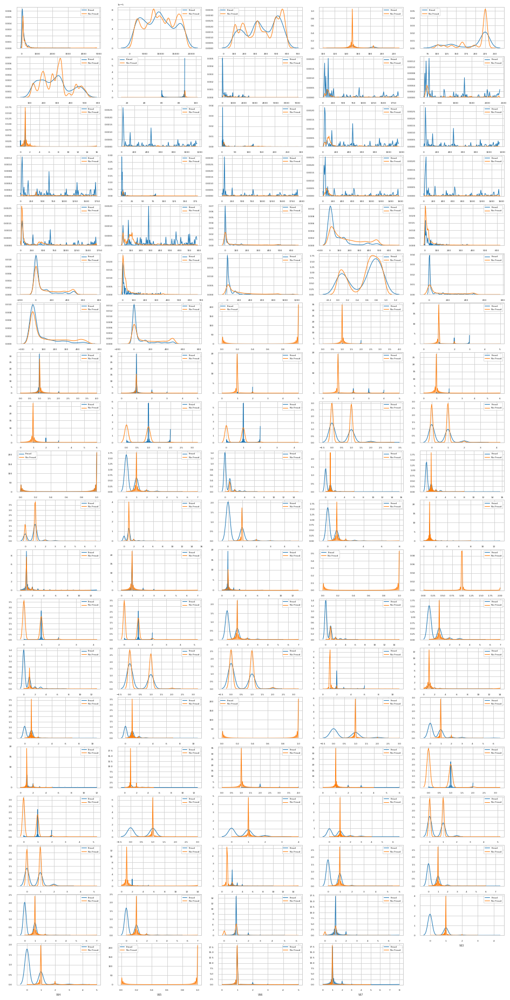

0    0.97286
1    0.02714
Name: isFraud, dtype: float64


In [0]:
#Exploring the data and creating visualizations
#compute a kernel density estimate : estimation à noyaun 

variable_quant=[i for i in x.columns if  x[i].dtypes=='int64' or x[i].dtypes=='float64' and i != 'isFraud'][1:100]
import seaborn as sns
v=variable_quant.copy()
v.append('isFraud')
inputs=x[v].copy()
path=mypath
labels =inputs.loc[:,'isFraud']
features = x[variable_quant].copy()
feature_details = explore_data(features, inputs, path)



#Codage des Varibles Qualitatives à des varaibles indicatrices

In [0]:

variabel_quantitative=[i for i in train.columns if train[i].dtypes=='int64' or train[i].dtypes=='float64']
variabel_qualitative=[i for i in train.columns if train[i].dtypes=='object']
print("taille des varaibles qualitative",len(variabel_qualitative))
print("taille des varaibles qauntitative",len(variabel_quantitative))
variabel_qualitative_knn=[i for i in Train_knn.columns if Train_knn[i].dtypes=='object']
variabel_qualitative_mode=[i for i in Train_mode_mean.columns if Train_mode_mean[i].dtypes=='object']


taille des varaibles qualitative 31
taille des varaibles qauntitative 389


In [0]:
# codage des données nominatives (attention de la multi-colinéaroté)
def indic(base1,base2,variabel_quali_train) :
  train_indicatrice=pd.DataFrame()
  test_indicatrice=pd.DataFrame()
  #variabel_quali_train=[i for i in base1.columns if base1[i].dtypes=='object']
  train_indicatrice=pd.DataFrame(pd.get_dummies(base1[variabel_quali_train]))
  test_indicatrice=pd.DataFrame(pd.get_dummies(base2[variabel_quali_train]))
  # calibrage des deux base données 
  for i in [i for i in test_indicatrice.columns if i not in train_indicatrice.columns]:
    train_indicatrice[i]=0
  for i in [i for i in train_indicatrice.columns if i not in test_indicatrice.columns]:
    test_indicatrice[i]=0 
  # suprission des anciennes colonnes
  base1.drop(variabel_quali_train, axis='columns', inplace=True)
  base2.drop(variabel_quali_train, axis='columns', inplace=True)
  #imputation
  base1[train_indicatrice.columns]=train_indicatrice[train_indicatrice.columns]
  base2[test_indicatrice.columns]=test_indicatrice[test_indicatrice.columns] 


In [0]:
indic(train,test,variabel_qualitative)
indic(Train_knn,Test_knn,variabel_qualitative)
indic(Train_mode_mean,Test_mode_mean,variabel_qualitative)

In [0]:
# il faut  trouver une décalage d'une dégré entre la taille de train...et celle de test...
print(train.shape)
print(test.shape)
print(Train_knn.shape)
print(Test_knn.shape)
print(Train_mode_mean.shape)
print(Test_mode_mean.shape)

(50000, 512)
(506691, 511)
(50000, 516)
(506691, 515)
(50000, 512)
(506691, 511)


In [0]:
# la fonction qui va détecter et supprimer l'indexe de la premiere indicatrice pour chaque varaible (éviter de la multi-col)
def index_indicatrice(base_indicatrice,variable_de_base):
  for i in variable_de_base :
    conteur=0
    for j in base_indicatrice.columns : 
      if conteur == 0 and (i in j)==True:
        conteur +=1
        base_indicatrice.drop(j, axis='columns', inplace=True)





In [0]:
index_indicatrice(train,variabel_qualitative)
index_indicatrice(test,variabel_qualitative)
index_indicatrice(Train_knn,variabel_qualitative_knn)
index_indicatrice(Test_knn,variabel_qualitative_knn)
index_indicatrice(Train_mode_mean,variabel_qualitative_mode)
index_indicatrice(Test_mode_mean,variabel_qualitative_mode)


In [0]:
  # calibrage des deux base données 
for i in [i for i in Train_knn.columns if i not in Train_mode_mean.columns]:
  Train_mode_mean[i]=0
  Test_mode_mean[i]=0
for i in [i for i in Train_mode_mean.columns if i not in Train_knn.columns]:
  Train_knn[i]=0
  Test_knn[i]=0

In [0]:
# il faut  trouver une décalage d'une dégré entre la taille de train...et celle de test...
print(train.shape)
print(test.shape)
print(Train_knn.shape)
print(Test_knn.shape)
print(Train_mode_mean.shape)
print(Test_mode_mean.shape)

(50000, 481)
(506691, 480)
(50000, 485)
(506691, 484)
(50000, 485)
(506691, 484)


résumé: on a 2 bases de données au final avec seulement des varaibles significatives continues et qualitatives codées:


*   imputé par les méthodes usuelles 
*   par KNN 


#Matrice de Corréllation : 

 L'etude la corrélation entre les varaibles sert à fixer des idées au préalable sur la relation ( notamment linéaire dans notre cas : corrélation de pearson) entre les varaibles explicatives et à expliquées, et aussi afin d'éradiquer le probl_me de la redandance d'information en lissant seuelement les varaibles non coorrélléece qui est aussi motivé par ACP.

 Dans notre cas, n remarque que il y a certaines varaibles explicatives de coorrélations linéaire qui arrive jusqua'a 85%.Vu que il ne sont pas trés nombreuse dans leur ignorance ne vas pas remidier le problème d'explosion de dimension
 Ci-dessous on représente la matrice de coorrélation pour ceratines varaibles: 

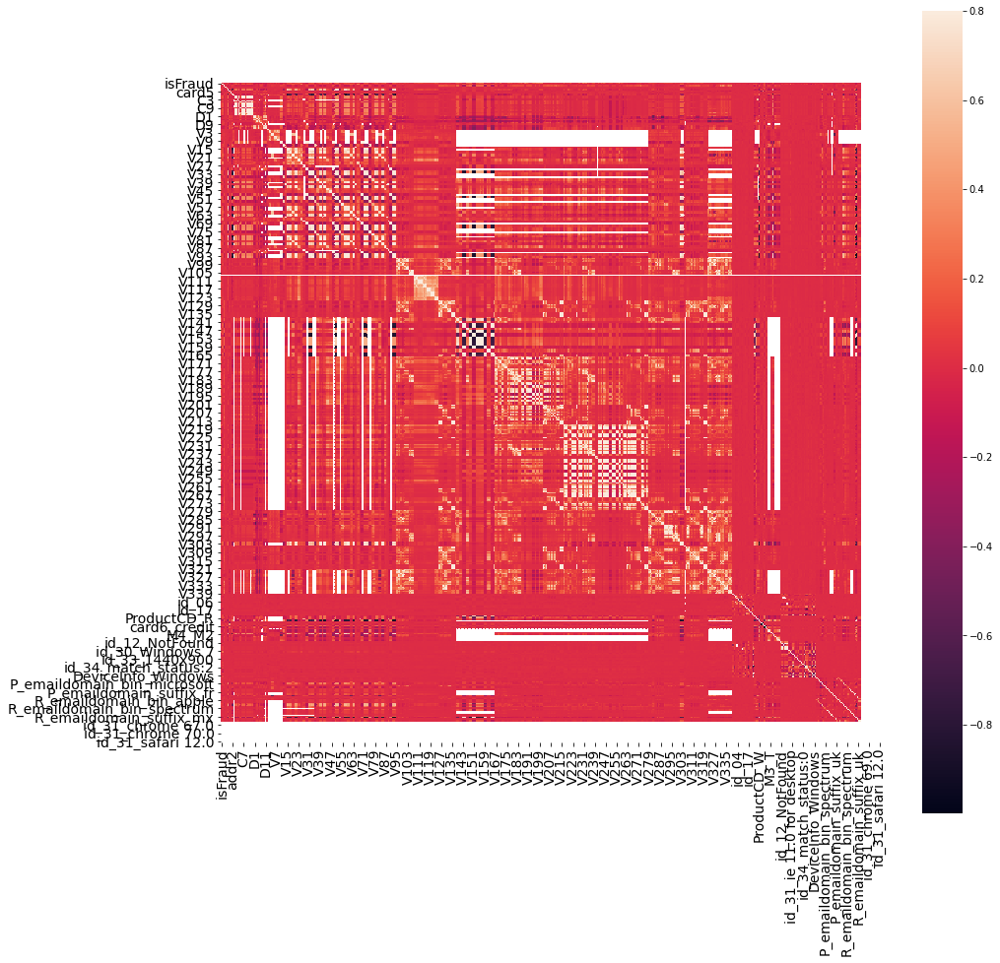

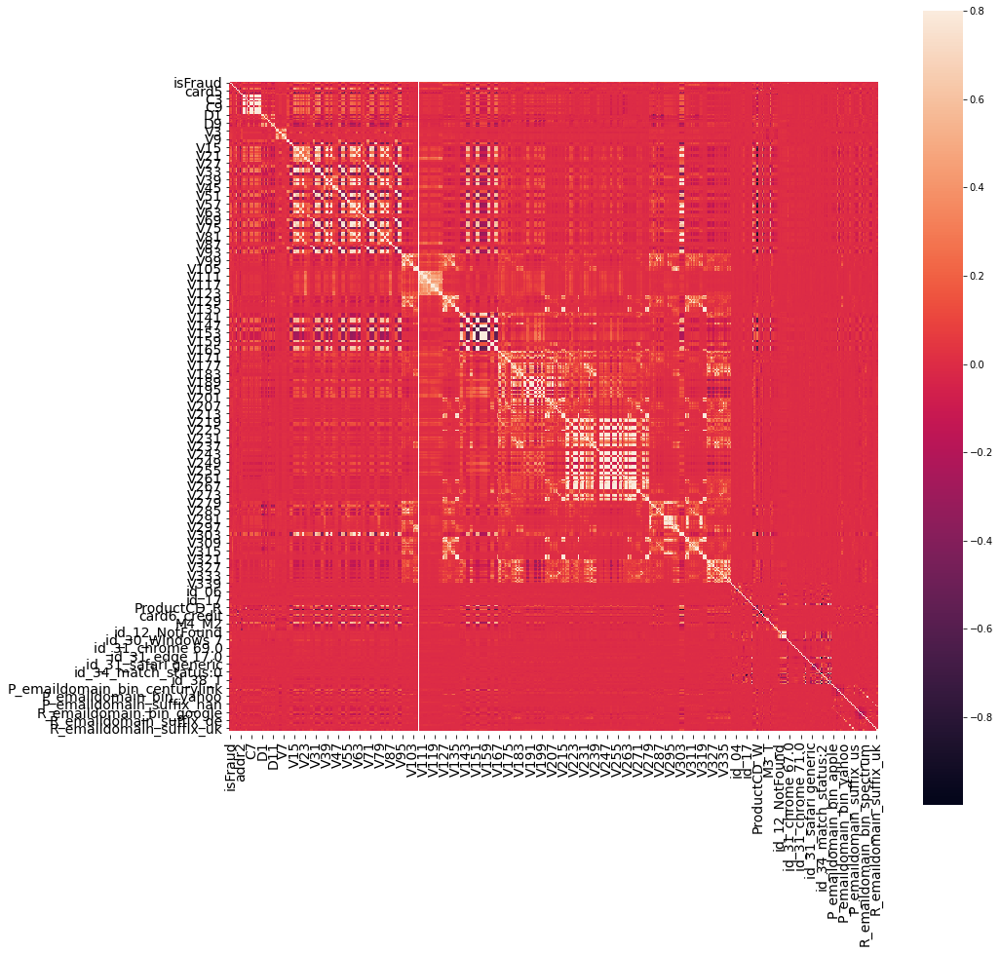

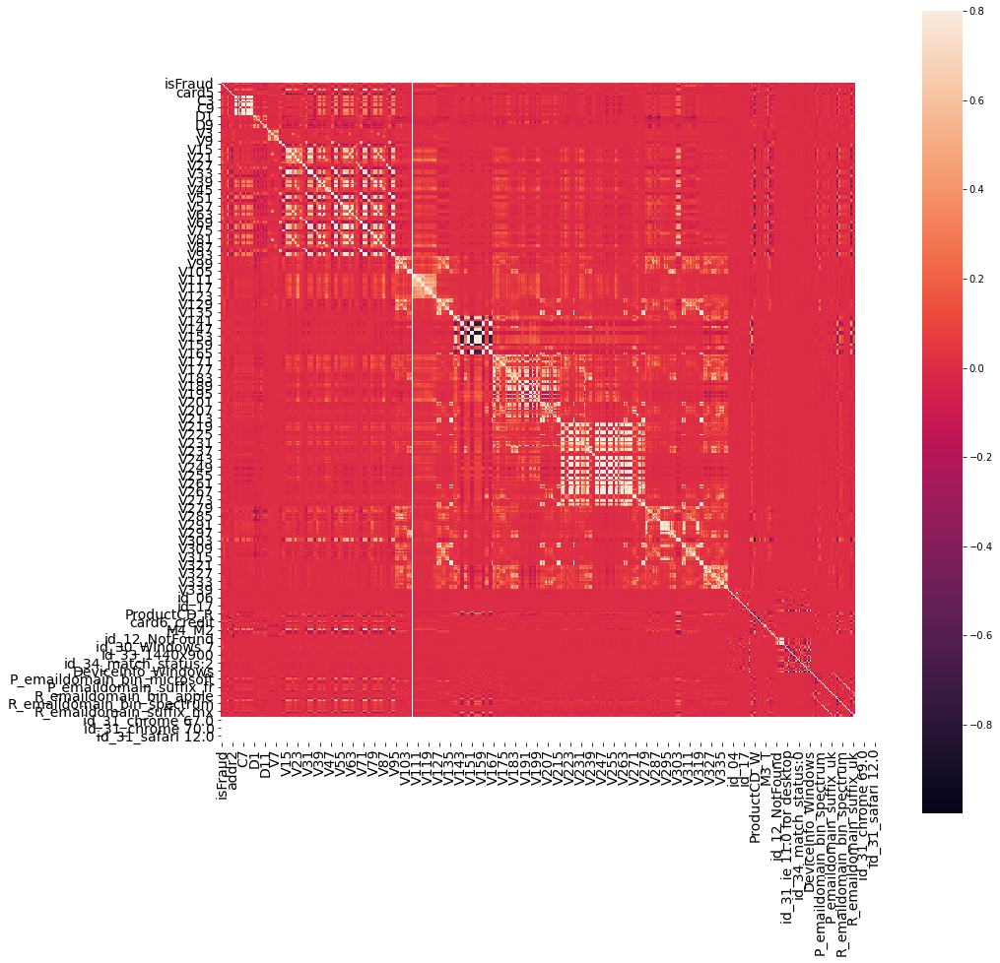

In [0]:
# corrélation 
fig = plt.figure(figsize = (15,15))
sb.heatmap(train.corr(), vmax = .8, square = True)
matplotlib.pyplot.xticks(fontsize=14) # Pour modifier (cad augmenter ou diminuer) la taille des étiquettes sur les axes d'une figure
matplotlib.pyplot.yticks(fontsize=14) # Pour modifier (cad augmenter ou diminuer) la taille des étiquettes sur les axes d'une figure
plt.show()

fig = plt.figure(figsize = (15,15))
sb.heatmap(Train_knn.corr(), vmax = .8, square = True)
matplotlib.pyplot.xticks(fontsize=14) # Pour modifier (cad augmenter ou diminuer) la taille des étiquettes sur les axes d'une figure
matplotlib.pyplot.yticks(fontsize=14) # Pour modifier (cad augmenter ou diminuer) la taille des étiquettes sur les axes d'une figure
plt.show()
fig = plt.figure(figsize = (15,15))
sb.heatmap(Train_mode_mean.corr(), vmax = .8, square = True)
matplotlib.pyplot.xticks(fontsize=14) # Pour modifier (cad augmenter ou diminuer) la taille des étiquettes sur les axes d'une figure
matplotlib.pyplot.yticks(fontsize=14) # Pour modifier (cad augmenter ou diminuer) la taille des étiquettes sur les axes d'une figure
plt.show()

#Dara Frame  de Corréllation des varaibles explicatives "isFraud"

afin d etrouver les varaibles bien corrélées entre eux  ( linéairement)

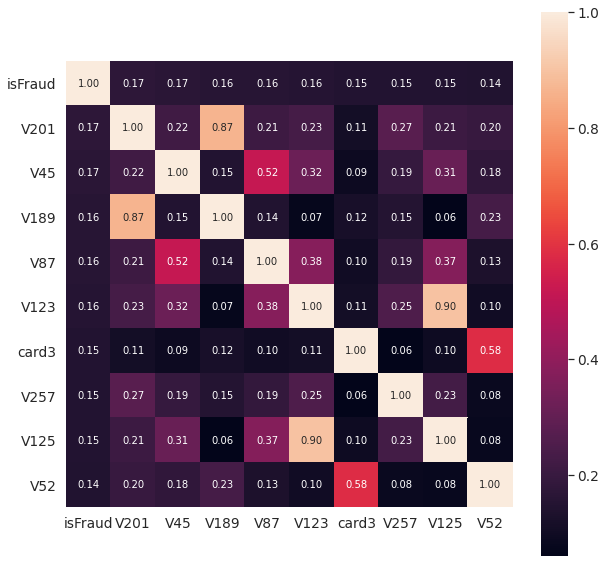

In [12]:
k = 10 #number of variables for heatmap
import seaborn as sns
corrmat = Train_knn.corr()
cols = corrmat.nlargest(k, 'isFraud')['isFraud'].index
cm = np.corrcoef(Train_knn[cols].values.T)
fig = plt.figure(figsize = (10,10)) # taille de la matrice 
sns.set(font_scale=1.25) # la taille de l'écriture d'abscisse ... de la matrice 
hm = sns.heatmap(cm, cbar=True, annot=True, square=True, fmt='.2f', annot_kws={'size': 10}, yticklabels=cols.values, xticklabels=cols.values)
plt.show()

On constate la coorrélation linéaire entre V201 et V189 est fortement positive qui vaut 0.87, dans ce cas on pourra, étape écarté, supprimer l'un des deux pour réduire la dimension et la redandance d'inertié.

# Enregistrement des bases des données traitées ( imputées + décodées )

In [0]:
Train_knn.to_csv(mypath+"Train_knn.csv",index=False) # save data .csv
Test_knn.to_csv(mypath+"Test_knn.csv",index=False) # save data .csv
Train_mode_mean.to_csv(mypath+"Train_mode_mean.csv",index=False) # save data .csv
Test_mode_mean.to_csv(mypath+"Test_mode_mean.csv",index=False) # save data .csv

In [0]:
Train_knn = pd.read_csv(mypath+"Train_knn.csv", sep = ',', header = 0,index_col = None,na_values=['NaN','nan']) # il y a le header=0
Test_knn = pd.read_csv(mypath+"Test_knn.csv", sep = ',', header = 0,index_col = None,na_values=['NaN','nan']) # il y a le header=0
Train_mode_mean = pd.read_csv(mypath+"Train_mode_mean.csv", sep = ',', header = 0,index_col = None,na_values=['NaN','nan']) # il y a le header=0 # transactions + varaibales cibles
Test_mode_mean = pd.read_csv(mypath+"Test_mode_mean.csv", sep = ',', header = 0,index_col = None,na_values=['NaN','nan']) # il y a le header=0 # caractéristique de chaque transaction


#Réduction de la mémoire des données traitées (imputées et décodées)

In [8]:
# reduce dimesion : compression 
Train_knn=reduce_mem_usage(Train_knn)
Test_knn= reduce_mem_usage(Test_knn)
Train_mode_mean=reduce_mem_usage(Train_mode_mean)
Test_mode_mean= reduce_mem_usage(Test_mode_mean)

  0%|          | 0/484 [00:00<?, ?it/s]

Mem. usage decreased to 44.06 Mb (76.2% reduction)


  1%|          | 3/485 [00:00<00:27, 17.73it/s]

Mem. usage decreased to 473.55 Mb (74.7% reduction)


  0%|          | 0/484 [00:00<?, ?it/s]

Mem. usage decreased to 44.01 Mb (76.2% reduction)


100%|██████████| 484/484 [02:02<00:00,  3.96it/s]

Mem. usage decreased to 473.55 Mb (74.7% reduction)


In [0]:
Train_knn

,isFraud,TransactionDT,TransactionAmt,card1,card2,card3,card5,addr1,addr2,dist1,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D8,D9,D10,D11,D15,V1,V2,V3,V4,V5,V6,...,DeviceType_mobile,DeviceInfo_Windows,DeviceInfo_iOS Device,P_emaildomain_bin_apple,P_emaildomain_bin_att,P_emaildomain_bin_centurylink,P_emaildomain_bin_google,P_emaildomain_bin_microsoft,P_emaildomain_bin_nan,P_emaildomain_bin_other,P_emaildomain_bin_spectrum,P_emaildomain_bin_yahoo,P_emaildomain_suffix_de,P_emaildomain_suffix_es,P_emaildomain_suffix_fr,P_emaildomain_suffix_jp,P_emaildomain_suffix_mx,P_emaildomain_suffix_nan,P_emaildomain_suffix_uk,P_emaildomain_suffix_us,R_emaildomain_bin_apple,R_emaildomain_bin_att,R_emaildomain_bin_centurylink,R_emaildomain_bin_google,R_emaildomain_bin_microsoft,R_emaildomain_bin_nan,R_emaildomain_bin_other,R_emaildomain_bin_spectrum,R_emaildomain_bin_yahoo,R_emaildomain_suffix_de,R_emaildomain_suffix_es,R_emaildomain_suffix_fr,R_emaildomain_suffix_jp,R_emaildomain_suffix_mx,R_emaildomain_suffix_nan,R_emaildomain_suffix_uk,R_emaildomain_suffix_us,card4_nan,M1_F,id_30_iOS 12.1.0
0,0.0,8.640000e+04,68.50000,13928.0,522.5,150.0,142.0,315.0,87.0,19.000000,0.999512,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,2.0,0.0,0.999512,0.999512,14.0,103.8750,13.000000,63.531250,27.921875,484.250000,0.107239,12.992188,13.007812,-0.000488,1.0,1.0,1.0,1.000000,1.000000,1.0,...,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0.0,8.640098e+04,29.00000,2754.0,404.0,150.0,102.0,325.0,87.0,17.937500,0.999512,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.999512,0.999512,0.0,215.0000,15.140625,0.015625,29.109375,484.250000,0.105896,0.000000,40.781250,-0.000488,1.0,1.0,1.0,1.000000,1.000000,1.0,...,1,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0.0,8.646902e+04,59.00000,4664.0,490.0,150.0,166.0,330.0,87.0,287.000000,0.999512,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.999512,0.999512,0.0,26.9375,15.796875,0.015625,78.250000,86.062500,0.062469,0.000000,315.000000,315.000000,1.0,1.0,1.0,1.000000,1.000000,1.0,...,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0.0,8.649901e+04,50.00000,18128.0,567.0,150.0,117.0,476.0,87.0,2.583984,1.999023,5.0,0.0,0.0,0.0,4.0,0.0,0.0,1.0,0.0,1.0,0.0,25.000000,0.999512,112.0,112.0000,0.000000,93.937500,0.000000,223.500000,0.125000,84.000000,66.562500,111.062500,1.0,1.0,1.0,0.527832,0.527832,1.0,...,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0.0,8.650598e+04,50.00000,4496.0,514.0,150.0,102.0,420.0,87.0,267.500000,0.999512,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.999512,0.999512,0.0,398.7500,171.875000,0.015625,184.000000,48.125000,0.127319,0.000000,0.006470,-0.000488,1.0,1.0,1.0,0.524414,0.524414,1.0,...,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49995,0.0,1.189336e+06,117.00000,17184.0,321.0,150.0,226.0,299.0,87.0,7.839844,3.998047,3.0,0.0,0.0,3.0,4.0,0.0,0.0,3.0,0.0,4.0,0.0,76.000000,1.999023,409.0,409.0000,2.000000,230.375000,230.500000,411.750000,0.684570,386.000000,53.125000,386.000000,1.0,1.0,1.0,1.000000,1.000000,1.0,...,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
49996,0.0,1.189336e+06,200.00000,15064.0,514.0,150.0,226.0,330.0,87.0,0.487549,0.999512,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.999512,0.999512,0.0,89.8125,13.914062,0.015625,10.781250,462.750000,0.687500,0.501465,87.750000,84.250000,1.0,1.0,1.0,0.512695,0.512695,1.0,...,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
49997,0.0,1.189336e+06,648.00000,1333.0,170.0,150.0,195.

## Split de jeu de donnée 

On construit une base pour l'apprentissage et l'autre pour le test afin de valider le modéle 

In [0]:
# Séparation
#train 

y_train_knn = Train_knn['isFraud'].astype("uint8").copy()
x_train_knn=  Train_knn.drop(['isFraud'], axis='columns')
# test
#y_test à prédire 
submission_knn=  Test_knn  #.drop([ 'TransactionID_x'], axis='columns')


#
y_train_mode_mean = Train_mode_mean['isFraud'].astype("uint8").copy()
x_train_mode_mean=  Train_mode_mean.drop(['isFraud'], axis='columns')
# test
#y_test à prédire 
submission_mode_mean=  Test_mode_mean #.drop([ 'TransactionID_x'], axis='columns')



In [0]:
# isfraud ==> catégorique
#forest random
# split train test prédiction 
X_train_knn, X_test_knn, y_train_knn, y_test_knn = train_test_split( x_train_knn, y_train_knn, test_size=0.33, random_state=42)
X_train_mode_mean, X_test_mode_mean, y_train_mode_mean, y_test_mode_mean = train_test_split( x_train_mode_mean, y_train_mode_mean, test_size=0.33, random_state=42)


Implémentation LGBM : scaling n'est pas nécessaire dans ce cas 

In [0]:
# corrélation entre les varaibles aprés ACp 
#train_data = pd.DataFrame(X_train_ACP)
#C_mat = train_data.corr()
#fig = plt.figure(figsize = (15,15))
#sb.heatmap(C_mat, vmax = .8, square = True)
#plt.show()

In [0]:
from lightgbm import LGBMClassifier
import lightgbm as lgb # pour specifier les datas bases de test et de train
from sklearn.metrics import accuracy_score, precision_score, recall_score, roc_auc_score



# LGBM sans optimisation et spécification des paramètres 

In [0]:
rf = LGBMClassifier()
rf.fit(X_train_knn,y_train_knn, eval_metric=["error", "logloss","auc"], eval_set=[(X_train_knn, y_train_knn), (X_test_knn, y_test_knn)], verbose=0) # error = le taux d'erreur= 1-précision 


LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               importance_type='split', learning_rate=0.1, max_depth=-1,
               min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
               n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
               random_state=None, reg_alpha=0.0, reg_lambda=0.0, silent=True,
               subsample=1.0, subsample_for_bin=200000, subsample_freq=0)

In [0]:
predict_test=rf.predict(X_test_knn)
predict_train = rf.predict(X_train_knn)
#Matrice de confusion 
print("matrice de confusion pour la base de validation ")
print(confusion_matrix( y_test_knn,predict_test))
print("matrice de confusion pour la base d'apprentissage ")

print(confusion_matrix( y_train_knn,predict_train))

accuracy = accuracy_score(y_test_knn, predict_test)
precision=precision_score(y_test_knn, predict_test)
recall=recall_score(y_test_knn, predict_test)
roc=roc_auc_score(y_test_knn, predict_test)
print("Accuracy: %.2f%%" % (accuracy * 100.0))
print("Precision: %.2f%% " % (precision *100))
print("Recall: %.2f%% " % (recall * 100))
print("AUC: %.2f%% " % (roc *100))

matrice de confusion pour la base de validation 
[[16033    24]
 [  266   177]]
matrice de confusion pour la base d'apprentissage 
[[32586     0]
 [  151   763]]
Accuracy: 98.24%
Precision: 88.06% 
Recall: 39.95% 
AUC: 69.90% 


* Submission de LGBM sans spécification des paramètres optimales et entrainé sur la base imputée par KNN*

In [0]:
proba = rf.predict_proba(Test_knn) # la probabilité d"etre fraudeur 
submission['isFraud'] = proba[:,1] # data frame transaction et proba d'appartenance dans le premiere classe
submission.to_csv(mypath+"Submission_knn_LGBM_defaut.csv",index=False) # save data .csv
submission.head()


,isFraud
TransactionID,
3663549,0.000590
3663550,0.011659
3663551,0.010665
3663552,0.000869
3663553,0.004742


* LGBM sans spécification des paramètres optimales et entrainé sur la base imputée par mode_mean*

In [0]:
rf = LGBMClassifier()
rf.fit(X_train_mode_mean,y_train_mode_mean,eval_metric=["error", "logloss","auc"], eval_set=[(X_train_mode_mean, y_train_mode_mean), (X_test_mode_mean, y_test_mode_mean)],verbose=0)

LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               importance_type='split', learning_rate=0.1, max_depth=-1,
               min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
               n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
               random_state=None, reg_alpha=0.0, reg_lambda=0.0, silent=True,
               subsample=1.0, subsample_for_bin=200000, subsample_freq=0)

In [0]:
predict_test=rf.predict(X_test_mode_mean)
predict_train = rf.predict(X_train_mode_mean)
#Matrice de confusion 
print("matrice de confusion pour la base de validation ")
print(confusion_matrix( y_test_mode_mean,predict_test))
print("matrice de confusion pour la base d'apprentissage ")

print(confusion_matrix( y_train_mode_mean,predict_train))

accuracy = accuracy_score(y_test_mode_mean, predict_test)
precision=precision_score(y_test_mode_mean, predict_test)
recall=recall_score(y_test_mode_mean, predict_test)
roc=roc_auc_score(y_test_mode_mean, predict_test)
print("Accuracy: %.2f%%" % (accuracy * 100.0))
print("Precision: %.2f%% " % (precision *100))
print("Recall: %.2f%% " % (recall * 100))
print("AUC: %.2f%% " % (roc *100)) # surface under courbe de roc 

matrice de confusion pour la base de validation 
[[16042    15]
 [  252   191]]
matrice de confusion pour la base d'apprentissage 
[[32583     3]
 [  207   707]]
Accuracy: 98.38%
Precision: 92.72% 
Recall: 43.12% 
AUC: 71.51% 


* Submission de LGBM sans spécification des paramètres optimales et entrainé sur la base imputée par mode_mean*



In [0]:
proba = rf.predict_proba(Test_mode_mean) # la probabilité d"etre fraudeur 
submission['isFraud'] = proba[:,1] # data frame transaction et proba d'appartenance dans le premiere classe
submission.to_csv(mypath+"Submission_mode-mean_LGBM_defaut.csv",index=False) # save data .csv
submission.head()

,isFraud
TransactionID,
3663549,0.001149
3663550,0.006047
3663551,0.001979
3663552,0.000478
3663553,0.000579


LGBM avec spécification des parametres à optimiser

* Les paramètres généraux
* Les paramètres du booster choisit (ceux ci dépendent des choix précédents)
* Les paramètres d’apprentissage (régression et classification n’auront pas ici   les mêmes entrées).






## 1) LGBM pour la base imputée par Mode_mean ( paramétres choisis et non optimisé )

Starting training...


/usr/local/lib/python3.6/dist-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [21]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))
/usr/local/lib/python3.6/dist-packages/lightgbm/basic.py:762: UserWarning: categorical_feature in param dict is overridden.
  warnings.warn('categorical_feature in param dict is overridden.')


[10]	training's auc: 0.858488	training's l1: 0.0475767	training's binary_logloss: 0.0957662	valid_1's auc: 0.831963	valid_1's l1: 0.0471889	valid_1's binary_logloss: 0.0956918
[20]	training's auc: 0.883612	training's l1: 0.0443645	training's binary_logloss: 0.0875239	valid_1's auc: 0.855052	valid_1's l1: 0.0442157	valid_1's binary_logloss: 0.089535
[30]	training's auc: 0.894752	training's l1: 0.0422925	training's binary_logloss: 0.0826968	valid_1's auc: 0.863678	valid_1's l1: 0.0422716	valid_1's binary_logloss: 0.0856631
[40]	training's auc: 0.902543	training's l1: 0.0408396	training's binary_logloss: 0.0793479	valid_1's auc: 0.87052	valid_1's l1: 0.0409614	valid_1's binary_logloss: 0.0834496
[50]	training's auc: 0.907955	training's l1: 0.0395927	training's binary_logloss: 0.076754	valid_1's auc: 0.873004	valid_1's l1: 0.0398306	valid_1's binary_logloss: 0.081777
[60]	training's auc: 0.913079	training's l1: 0.0387412	training's binary_logloss: 0.0747135	valid_1's auc: 0.876338	valid_1'

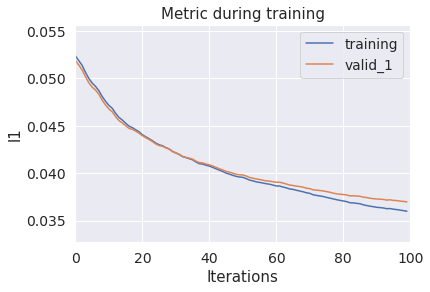

Plotting metrics== "AUC" recorded during training...


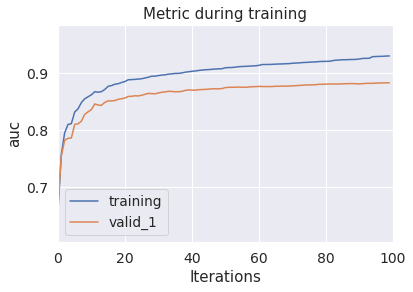

Plotting metrics=="LogLoss" recorded during training...


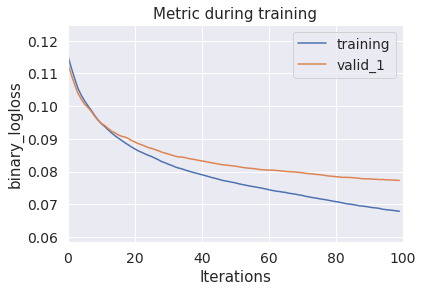

Plotting 54th tree...


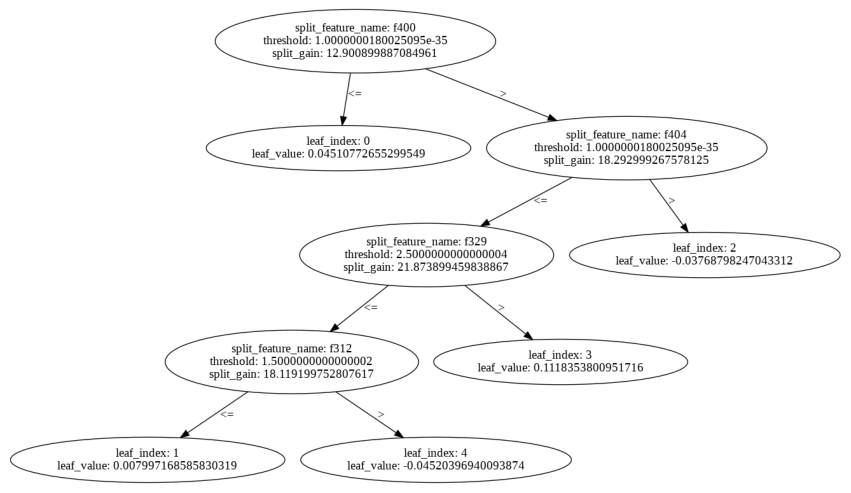

Plotting 54th tree with graphviz...


'Tree54.gv.pdf'

In [0]:
# create dataset for lightgbm
import lightgbm as lgb
lgb_train = lgb.Dataset(X_train_mode_mean, y_train_mode_mean)
lgb_test = lgb.Dataset(X_test_mode_mean, y_test_mode_mean, reference=lgb_train)

# specify your configurations as a dict
params = {
    'objective' : "binary",
    'num_leaves': 5,
    'metric': ('binary_logloss','l1','auc'), #  'l2'
    'verbose': 0
}

evals_result = {}  # to record eval results for plotting

print('Starting training...')
# train
gbm = lgb.train(params,
                lgb_train,
                num_boost_round=100,
                valid_sets=[lgb_train, lgb_test],
                feature_name=['f' + str(i + 1) for i in range(X_train_mode_mean.shape[-1])],
                categorical_feature=[21],
                evals_result=evals_result,
                verbose_eval=10)

print('Plotting metrics== "L1" recorded during training...')
ax = lgb.plot_metric(evals_result, metric='l1')
matplotlib.pyplot.xticks(fontsize=14) # Pour modifier (cad augmenter ou diminuer) la taille des étiquettes sur les axes d'une figure
matplotlib.pyplot.yticks(fontsize=14) # Pour modifier (cad augmenter ou diminuer) la taille des étiquettes sur les axes d'une figure
plt.show()
print('Plotting metrics== "AUC" recorded during training...')
ax = lgb.plot_metric(evals_result, metric='auc')
matplotlib.pyplot.xticks(fontsize=14) # Pour modifier (cad augmenter ou diminuer) la taille des étiquettes sur les axes d'une figure
matplotlib.pyplot.yticks(fontsize=14) # Pour modifier (cad augmenter ou diminuer) la taille des étiquettes sur les axes d'une figure
plt.show()
print('Plotting metrics=="LogLoss" recorded during training...')
ax = lgb.plot_metric(evals_result, metric='binary_logloss')
matplotlib.pyplot.xticks(fontsize=14) # Pour modifier (cad augmenter ou diminuer) la taille des étiquettes sur les axes d'une figure
matplotlib.pyplot.yticks(fontsize=14) # Pour modifier (cad augmenter ou diminuer) la taille des étiquettes sur les axes d'une figure
plt.show()

#print('Plotting feature importances...')
#ax = lgb.plot_importance(gbm, max_num_features=10,figsize=(15, 15)) # les dix meilleurs varaibles explicatives :top features # measur the name of importance measure to plot, can be "Gain", "Cover" or "Frequency
#matplotlib.pyplot.xticks(fontsize=14) # Pour modifier (cad augmenter ou diminuer) la taille des étiquettes sur les axes d'une figure
#matplotlib.pyplot.yticks(fontsize=14) # Pour modifier (cad augmenter ou diminuer) la taille des étiquettes sur les axes d'une figure
#plt.show()


print('Plotting 54th tree...')  # one tree use categorical feature to split
ax = lgb.plot_tree(gbm, tree_index=53, figsize=(15, 15), show_info=['split_gain'])
plt.show()

print('Plotting 54th tree with graphviz...')
graph = lgb.create_tree_digraph(gbm, tree_index=53, name='Tree54')
graph.render(view=True)

* Affichage des features importants par ordre décroissant*

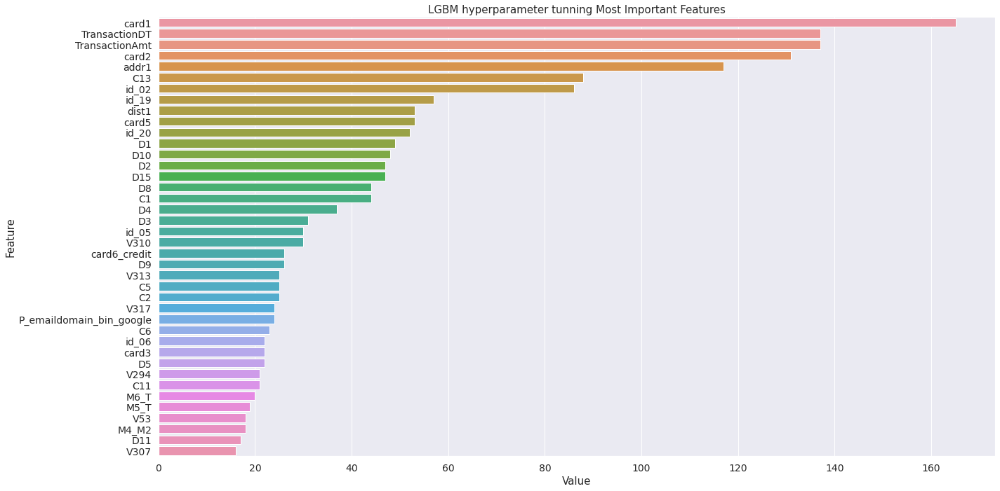

In [0]:
# autre methode d'affichage de feature importance 
cols = list(X_train_mode_mean.columns)
feature_imp = pd.DataFrame(sorted(zip(rf.feature_importances_,cols)), columns=['Value','Feature'])
plt.figure(figsize=(20, 10))
sns.barplot(x="Value", y="Feature", data=feature_imp.sort_values(by="Value", ascending=False).iloc[0:40]) # 40 top feature
plt.title('LGBM hyperparameter tunning Most Important Features')
plt.tight_layout()
matplotlib.pyplot.xticks(fontsize=14) # Pour modifier (cad augmenter ou diminuer) la taille des étiquettes sur les axes d'une figure
matplotlib.pyplot.yticks(fontsize=14) # Pour modifier (cad augmenter ou diminuer) la taille des étiquettes sur les axes d'une figure
plt.show()

In [0]:
# affichage des tops 10 features
feature_imp.sort_values(by = 'Value', ascending = False)[:10]

,Value,Feature
483,165,card1
482,137,TransactionDT
481,137,TransactionAmt
480,131,card2
479,117,addr1
478,88,C13
477,86,id_02
476,57,id_19
475,53,dist1
474,53,card5


*Submission de LGBM avec spécification des paramètres optimales et entrainé sur la base imputée par mode_mean*


In [0]:
proba = gbm.predict(Test_mode_mean) # la probabilité d"etre fraudeur 
submission['isFraud'] = proba # data frame transaction et proba d'appartenance dans le premiere classe
submission.to_csv(mypath+"Submission_mode-mean_LGBM_Param-spécifiés.csv",index=False) # save data .csv
submission.head()

,isFraud
TransactionID,
3663549,0.002744
3663550,0.004703
3663551,0.020713
3663552,0.003327
3663553,0.005603


## 2) LGBM pour la base imputée par KNN ( paramétres choisis et non optimisé )

Starting training...


/usr/local/lib/python3.6/dist-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is [21]
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))
/usr/local/lib/python3.6/dist-packages/lightgbm/basic.py:762: UserWarning: categorical_feature in param dict is overridden.
  warnings.warn('categorical_feature in param dict is overridden.')


[10]	training's auc: 0.857479	training's l1: 0.0472123	training's binary_logloss: 0.0960017	valid_1's auc: 0.835969	valid_1's l1: 0.0475033	valid_1's binary_logloss: 0.0972194
[20]	training's auc: 0.879832	training's l1: 0.0440691	training's binary_logloss: 0.0883994	valid_1's auc: 0.849461	valid_1's l1: 0.0445967	valid_1's binary_logloss: 0.090978
[30]	training's auc: 0.892514	training's l1: 0.0421159	training's binary_logloss: 0.0835658	valid_1's auc: 0.857939	valid_1's l1: 0.0428166	valid_1's binary_logloss: 0.0874185
[40]	training's auc: 0.903153	training's l1: 0.0407458	training's binary_logloss: 0.0799523	valid_1's auc: 0.864197	valid_1's l1: 0.0415587	valid_1's binary_logloss: 0.0848224
[50]	training's auc: 0.909369	training's l1: 0.0396755	training's binary_logloss: 0.0772081	valid_1's auc: 0.867515	valid_1's l1: 0.0405399	valid_1's binary_logloss: 0.0828025
[60]	training's auc: 0.915804	training's l1: 0.0389122	training's binary_logloss: 0.0749091	valid_1's auc: 0.87043	valid_

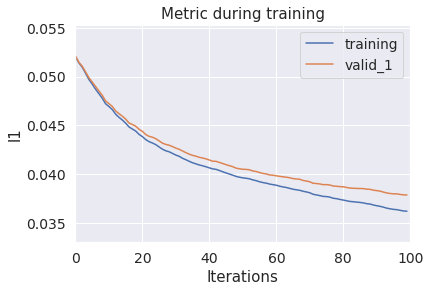

Plotting metrics == auc  recorded during training...


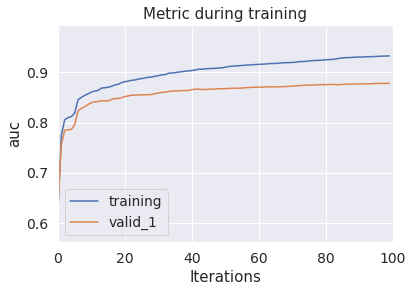

Plotting metrics== log-loss recorded during training...


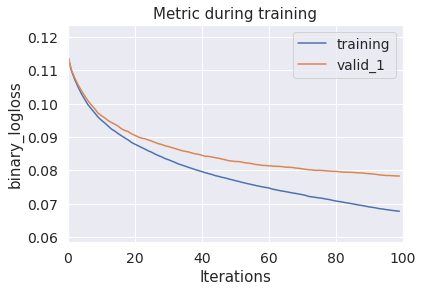

Plotting 54th tree...


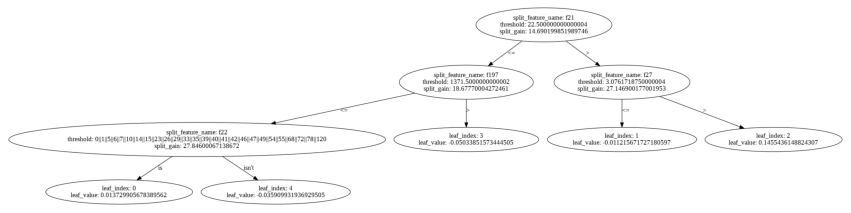

Plotting 54th tree with graphviz...


'Tree54.gv.pdf'

In [0]:
# create dataset for lightgbm
import lightgbm as lgb
lgb_train = lgb.Dataset(X_train_knn, y_train_knn)
lgb_test = lgb.Dataset(X_test_knn, y_test_knn, reference=lgb_train)

# specify your configurations as a dict
params = {
    'objective' : "binary",
    'num_leaves': 5,
    'metric': ('binary_logloss','l1','auc'), #  'l2'
    'verbose': 0
}

evals_result = {}  # to record eval results for plotting

print('Starting training...')
# train
gbm = lgb.train(params,
                lgb_train,
                num_boost_round=100,
                valid_sets=[lgb_train, lgb_test],
                feature_name=['f' + str(i + 1) for i in range(X_train_mode_mean.shape[-1])],
                categorical_feature=[21],
                evals_result=evals_result,
                verbose_eval=10)

print('Plotting metrics== l1 recorded during training...')
ax = lgb.plot_metric(evals_result, metric='l1')
matplotlib.pyplot.xticks(fontsize=14) # Pour modifier (cad augmenter ou diminuer) la taille des étiquettes sur les axes d'une figure
matplotlib.pyplot.yticks(fontsize=14) # Pour modifier (cad augmenter ou diminuer) la taille des étiquettes sur les axes d'une figure
plt.show()
print('Plotting metrics == auc  recorded during training...')
ax = lgb.plot_metric(evals_result, metric='auc')
matplotlib.pyplot.xticks(fontsize=14) # Pour modifier (cad augmenter ou diminuer) la taille des étiquettes sur les axes d'une figure
matplotlib.pyplot.yticks(fontsize=14) # Pour modifier (cad augmenter ou diminuer) la taille des étiquettes sur les axes d'une figure
plt.show()
print('Plotting metrics== log-loss recorded during training...')
ax = lgb.plot_metric(evals_result, metric='binary_logloss')
matplotlib.pyplot.xticks(fontsize=14) # Pour modifier (cad augmenter ou diminuer) la taille des étiquettes sur les axes d'une figure
matplotlib.pyplot.yticks(fontsize=14) # Pour modifier (cad augmenter ou diminuer) la taille des étiquettes sur les axes d'une figure
plt.show()

#print('Plotting feature importances...')
#ax = lgb.plot_importance(gbm, max_num_features=10,figsize=(15, 15)) # les dix meilleurs varaibles explicatives :top features # measur the name of importance measure to plot, can be "Gain", "Cover" or "Frequency
#matplotlib.pyplot.xticks(fontsize=14) # Pour modifier (cad augmenter ou diminuer) la taille des étiquettes sur les axes d'une figure
#matplotlib.pyplot.yticks(fontsize=14) # Pour modifier (cad augmenter ou diminuer) la taille des étiquettes sur les axes d'une figure
#plt.show()


print('Plotting 54th tree...')  # one tree use categorical feature to split
ax = lgb.plot_tree(gbm, tree_index=53, figsize=(15, 15), show_info=['split_gain'])
plt.show()

print('Plotting 54th tree with graphviz...')
graph = lgb.create_tree_digraph(gbm, tree_index=53, name='Tree54')
graph.render(view=True)

* Affichage des features importants par ordre décroissant*

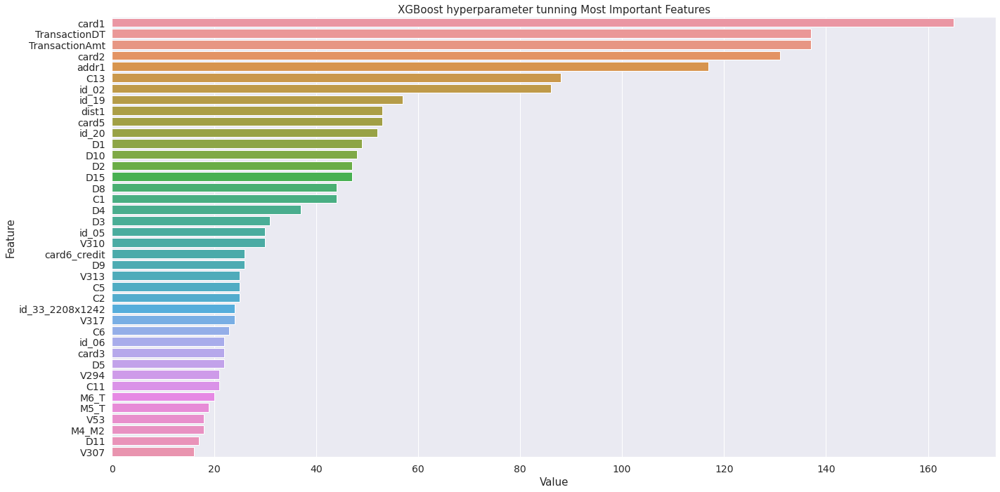

In [0]:
# autre methode d'affichage de feature importance 
cols = list(X_train_knn.columns)
feature_imp = pd.DataFrame(sorted(zip(rf.feature_importances_,cols)), columns=['Value','Feature'])
plt.figure(figsize=(20, 10))
sns.barplot(x="Value", y="Feature", data=feature_imp.sort_values(by="Value", ascending=False).iloc[0:40]) # 40 top feature
plt.title('XGBoost hyperparameter tunning Most Important Features')
plt.tight_layout()
matplotlib.pyplot.xticks(fontsize=14) # Pour modifier (cad augmenter ou diminuer) la taille des étiquettes sur les axes d'une figure
matplotlib.pyplot.yticks(fontsize=14) # Pour modifier (cad augmenter ou diminuer) la taille des étiquettes sur les axes d'une figure
plt.show()

In [0]:
# affichage des tops 10 features

feature_imp.sort_values(by = 'Value', ascending = False)[:10]

,Value,Feature
483,165,card1
482,137,TransactionDT
481,137,TransactionAmt
480,131,card2
479,117,addr1
478,88,C13
477,86,id_02
476,57,id_19
475,53,dist1
474,53,card5


*Submission de LGBM avec spécification des paramètres optimales et entrainé sur la base imputée par KNN*


In [0]:
proba = gbm.predict(Test_knn) # la probabilité d"etre fraudeur 
submission['isFraud'] = proba # data frame transaction et proba d'appartenance dans le premiere classe
submission.to_csv(mypath+"Submission_KNN_LGBM_Param-spécifiés.csv",index=False) # save data .csv
submission.head()

,isFraud
TransactionID,
3663549,0.007285
3663550,0.012831
3663551,0.022020
3663552,0.013582
3663553,0.018493


# 3) LightGBM classifier hyperparameter optimization via scikit-learn's GridSearchCV or Baysian Optimizer  ( LGBM avec Paramétres optimisés par GRCV ou Baysian)

## 3-1) entrainement sur la base imputé par mode_mean

In [0]:
# pour base mean_mode 
import lightgbm as lgb
from sklearn.model_selection import GridSearchCV


In [0]:
estimator = lgb.LGBMClassifier(learning_rate = 0.125, metric = 'l1', 
                        n_estimators = 20, num_leaves = 40) # hyper parametre initialisation 


param_grid = {  
    'n_estimators': [x for x in range(24,200,20)],
    'learning_rate': [0.10, 0.125, 0.15, 0.175, 0.2],
    'num_leaves': [x for x in range(2,50,5)]
     } #hyper  parametre a minimiser  
     
gridsearch = GridSearchCV(estimator, param_grid)

gridsearch.fit(X_train_mode_mean, y_train_mode_mean,
        eval_set = [(X_test_mode_mean, y_test_mode_mean)],
        eval_metric = ['auc', 'binary_logloss'],
        early_stopping_rounds = 5)

Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
[21]	valid_0's auc: 0.879315	valid_0's l1: 0.034146	valid_0's binary_logloss: 0.0780984
[22]	valid_0's auc: 0.878806	valid_0's l1: 0.0339356	valid_0's binary_logloss: 0.0781592
[23]	valid_0's auc: 0.87949	valid_0's l1: 0.0336423	valid_0's binary_logloss: 0.0779564
[24]	valid_0's auc: 0.878482	valid_0's l1: 0.0338181	valid_0's binary_logloss: 0.0783714
[25]	valid_0's auc: 0.878994	valid_0's l1: 0.033693	valid_0's binary_logloss: 0.0781367
[26]	valid_0's auc: 0.883744	valid_0's l1: 0.0335338	valid_0's binary_logloss: 0.0776073
[27]	valid_0's auc: 0.884584	valid_0's l1: 0.0332553	valid_0's binary_logloss: 0.0774555
[28]	valid_0's auc: 0.885257	valid_0's l1: 0.0330323	valid_0's binary_logloss: 0.0770156
[29]	valid_0's auc: 0.88576	valid_0's l1: 0.0329471	valid_0's binary_logloss: 0.076861
[30]	valid_0's auc: 0.885372	valid_0's l1: 0.0328078	valid_0's binary_logloss: 0.0767871
[31]	valid_0's auc: 0.887079	valid_0'

GridSearchCV(cv=None, error_score=nan,
             estimator=LGBMClassifier(boosting_type='gbdt', class_weight=None,
                                      colsample_bytree=1.0,
                                      importance_type='split',
                                      learning_rate=0.125, max_depth=-1,
                                      metric='l1', min_child_samples=20,
                                      min_child_weight=0.001,
                                      min_split_gain=0.0, n_estimators=20,
                                      n_jobs=-1, num_leaves=40, objective=None,
                                      random_state=None, reg_alpha=0.0,
                                      reg_lambda=0.0, silent=True,
                                      subsample=1.0, subsample_for_bin=200000,
                                      subsample_freq=0),
             iid='deprecated', n_jobs=None,
             param_grid={'learning_rate': [0.1, 0.125, 0.15, 0.175, 0.2],
   

#Affichage des paramétres optimales trouvés par l'optimizer 

In [0]:
print('Best parameters found by grid search are:', gridsearch.best_params_)


#déploiement  des paraméters optimisés.

In [0]:


gbm = lgb.LGBMClassifier(learning_rate = gridsearch.best_params_['learning_rate'], metric = 'l1', 
                        n_estimators = gridsearch.best_params_['n_estimators'],num_leaves= gridsearch.best_params_['num_leaves'])

gbm.fit(X_train_mode_mean, y_train_mode_mean,
        eval_set = [(X_test_mode_mean, y_test_mode_mean)],
        eval_metric=['auc', 'binary_logloss'],
early_stopping_rounds=5)

[1]	valid_0's auc: 0.815777	valid_0's l1: 0.0500157	valid_0's binary_logloss: 0.100745
Training until validation scores don't improve for 5 rounds.
[2]	valid_0's auc: 0.824254	valid_0's l1: 0.0486258	valid_0's binary_logloss: 0.0958889
[3]	valid_0's auc: 0.85381	valid_0's l1: 0.0473979	valid_0's binary_logloss: 0.0930141
[4]	valid_0's auc: 0.855708	valid_0's l1: 0.0462088	valid_0's binary_logloss: 0.0908488
[5]	valid_0's auc: 0.871192	valid_0's l1: 0.0449123	valid_0's binary_logloss: 0.0879692
[6]	valid_0's auc: 0.875399	valid_0's l1: 0.0438797	valid_0's binary_logloss: 0.0860135
[7]	valid_0's auc: 0.87641	valid_0's l1: 0.0429801	valid_0's binary_logloss: 0.0845665
[8]	valid_0's auc: 0.878144	valid_0's l1: 0.0420148	valid_0's binary_logloss: 0.082903
[9]	valid_0's auc: 0.882544	valid_0's l1: 0.0412045	valid_0's binary_logloss: 0.0815685
[10]	valid_0's auc: 0.88292	valid_0's l1: 0.0403938	valid_0's binary_logloss: 0.0801842
[11]	valid_0's auc: 0.882597	valid_0's l1: 0.0396407	valid_0's 

LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               importance_type='split', learning_rate=0.1, max_depth=-1,
               metric='l1', min_child_samples=20, min_child_weight=0.001,
               min_split_gain=0.0, n_estimators=84, n_jobs=-1, num_leaves=47,
               objective=None, random_state=None, reg_alpha=0.0, reg_lambda=0.0,
               silent=True, subsample=1.0, subsample_for_bin=200000,
               subsample_freq=0)

* Affichage des features importants par ordre décroissant*




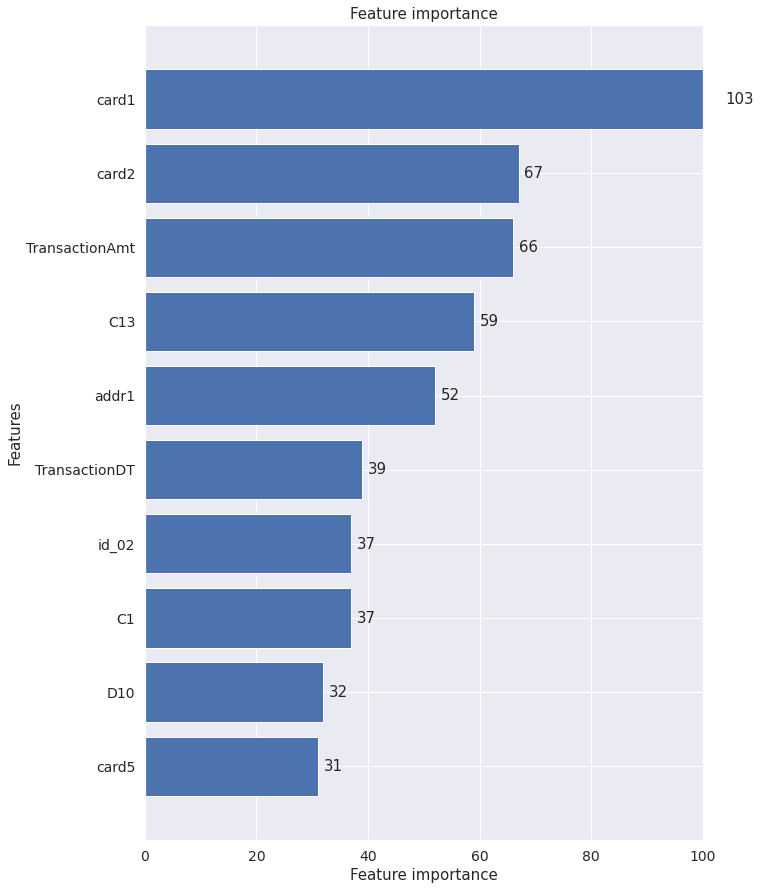

In [0]:
ax = lgb.plot_importance(gbm, height = 0.8, 
                         max_num_features = 10, 
                         xlim = (0,100), 
                         figsize = (10,15)) # , ylim = (0,23)
matplotlib.pyplot.xticks(fontsize=14) # Pour modifier (cad augmenter ou diminuer) la taille des étiquettes sur les axes d'une figure
matplotlib.pyplot.yticks(fontsize=14) # Pour modifier (cad augmenter ou diminuer) la taille des étiquettes sur les axes d'une figure
plt.show()

In [0]:
#features importances : 10  tops 
feature_imp = pd.DataFrame(sorted(zip(gbm.feature_importances_,cols)), columns=['Value','Feature'])

feature_imp.sort_values(by = 'Value', ascending = False)[:10]

,Value,Feature
483,103,card1
482,67,card2
481,66,TransactionAmt
480,59,C13
479,52,addr1
478,39,TransactionDT
477,37,id_02
476,37,C1
475,32,D10
474,31,card5


* Affichage de la Courbe de ROC

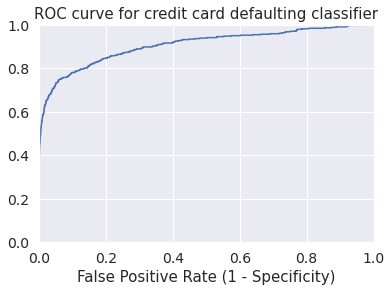

In [0]:
y_pred_prob =  gbm.predict_proba(X_test_mode_mean, num_iteration=gbm.best_iteration_) # la probabilité d"etre fraudeur 
y_pred_prob=y_pred_prob[:,1] # array en python comme les data frame en R
fpr, tpr, thresholds = roc_curve(y_test_mode_mean, y_pred_prob)

plt.plot(fpr, tpr)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.rcParams['font.size'] = 12
matplotlib.pyplot.xticks(fontsize=14) # Pour modifier (cad augmenter ou diminuer) la taille des étiquettes sur les axes d'une figure
matplotlib.pyplot.yticks(fontsize=14) # Pour modifier (cad augmenter ou diminuer) la taille des étiquettes sur les axes d'une figure
plt.title('ROC curve for credit card defaulting classifier')
plt.xlabel('False Positive Rate (1 - Specificity)')
plt.grid(True)

* Validation de modèle par les mesures usuelles 

In [0]:

y_pred = gbm.predict(X_test_mode_mean, num_iteration=gbm.best_iteration_)
print('The accuracy of prediction is:', accuracy_score(y_test_mode_mean, y_pred))
print('The roc_auc_score of prediction is:', roc_auc_score(y_test_mode_mean, y_pred))
print('The null acccuracy is:', max(y_test_mode_mean.mean(), 1 - y_test_mode_mean.mean()))

The accuracy of prediction is: 0.9821212121212122
The roc_auc_score of prediction is: 0.6878959423757154
The null acccuracy is: 0.9731515151515151


* Submission de LGBM avec optimization des paramètres optimales et entrainé sur la base imputée par mode mean*


In [0]:
proba = gbm.predict_proba(Test_mode_mean) # la probabilité d"etre fraudeur 
submission['isFraud'] = proba[:,1] # data frame transaction et proba d'appartenance dans le premiere classe
submission.to_csv(mypath+"Submission_Mode-mean_LGBM_Param-optimisés.csv",index=False) # save data .csv
submission.head()

,isFraud
TransactionID,
3663549,0.003487
3663550,0.011627
3663551,0.006306
3663552,0.003581
3663553,0.003619


# 3-2) Entrainement sur la base imputée par knn

In [0]:
estimator = lgb.LGBMClassifier(learning_rate = 0.125, metric = 'l1', 
                        n_estimators = 20, num_leaves = 40) # hyper parametre initialisation 


param_grid = {  
    'n_estimators': [x for x in range(24,200,20)],
    'learning_rate': [0.10, 0.125, 0.15, 0.175, 0.2],
    'num_leaves': [x for x in range(2,50,5)]
     } #hyper  parametre a minimiser 
gridsearch = GridSearchCV(estimator, param_grid)

gridsearch.fit(X_train_knn, y_train_knn,
        eval_set = [(X_test_knn, y_test_knn)],
        eval_metric = ['auc', 'binary_logloss'],
        early_stopping_rounds = 5)

Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
[3]	valid_0's l1: 0.0462452	valid_0's auc: 0.823742	valid_0's binary_logloss: 0.0971133
[4]	valid_0's l1: 0.0449576	valid_0's auc: 0.846284	valid_0's binary_logloss: 0.0945088
[5]	valid_0's l1: 0.0438502	valid_0's auc: 0.849196	valid_0's binary_logloss: 0.093281
[6]	valid_0's l1: 0.0428227	valid_0's auc: 0.860738	valid_0's binary_logloss: 0.0912844
[7]	valid_0's l1: 0.0418825	valid_0's auc: 0.864735	valid_0's binary_logloss: 0.089784
[8]	valid_0's l1: 0.0409991	valid_0's auc: 0.865651	valid_0's binary_logloss: 0.0886818
[9]	valid_0's l1: 0.0401974	valid_0's auc: 0.86889	valid_0's binary_logloss: 0.0876731
[10]	valid_0's l1: 0.0393953	valid_0's auc: 0.866471	valid_0's binary_logloss: 0.0864152
[11]	valid_0's l1: 0.0388597	valid_0's auc: 0.865468	valid_0's binary_logloss: 0.0859397
[12]	valid_0's l1: 0.0384066	valid_0's auc: 0.867731	valid_0's binary_logloss: 0.0851403
[13]	valid_0's l1: 0.0381616	valid_0's auc

GridSearchCV(cv=None, error_score=nan,
             estimator=LGBMClassifier(boosting_type='gbdt', class_weight=None,
                                      colsample_bytree=1.0,
                                      importance_type='split',
                                      learning_rate=0.125, max_depth=-1,
                                      metric='l1', min_child_samples=20,
                                      min_child_weight=0.001,
                                      min_split_gain=0.0, n_estimators=20,
                                      n_jobs=-1, num_leaves=40, objective=None,
                                      random_state=None, reg_alpha=0.0,
                                      reg_lambda=0.0, silent=True,
                                      subsample=1.0, subsample_for_bin=200000,
                                      subsample_freq=0),
             iid='deprecated', n_jobs=None,
             param_grid={'learning_rate': [0.1, 0.125, 0.15, 0.175, 0.2],
   

#Affichage et Déploiement des hyperparamètres optimisés



In [0]:
print('Best parameters found by grid search are:', gridsearch.best_params_)

Best parameters found by grid search are: {'learning_rate': 0.1, 'n_estimators': 64, 'num_leaves': 42}


In [0]:

gbm = lgb.LGBMClassifier(learning_rate = gridsearch.best_params_['learning_rate'], metric = 'l1', 
                        n_estimators = gridsearch.best_params_['n_estimators'],num_leaves= gridsearch.best_params_['num_leaves'])


gbm.fit(X_train_knn, y_train_knn,
        eval_set = [(X_test_knn, y_test_knn)],
        eval_metric=['auc', 'binary_logloss'],
early_stopping_rounds=5)

[1]	valid_0's l1: 0.0504329	valid_0's auc: 0.784024	valid_0's binary_logloss: 0.103931
Training until validation scores don't improve for 5 rounds.
[2]	valid_0's l1: 0.049206	valid_0's auc: 0.806798	valid_0's binary_logloss: 0.0996964
[3]	valid_0's l1: 0.0480448	valid_0's auc: 0.819135	valid_0's binary_logloss: 0.0968644
[4]	valid_0's l1: 0.0468735	valid_0's auc: 0.838219	valid_0's binary_logloss: 0.094401
[5]	valid_0's l1: 0.0457105	valid_0's auc: 0.840239	valid_0's binary_logloss: 0.0916907
[6]	valid_0's l1: 0.0447099	valid_0's auc: 0.847183	valid_0's binary_logloss: 0.0897632
[7]	valid_0's l1: 0.0436975	valid_0's auc: 0.849298	valid_0's binary_logloss: 0.0879849
[8]	valid_0's l1: 0.0428018	valid_0's auc: 0.863986	valid_0's binary_logloss: 0.0860502
[9]	valid_0's l1: 0.0419713	valid_0's auc: 0.865443	valid_0's binary_logloss: 0.0847366
[10]	valid_0's l1: 0.0411926	valid_0's auc: 0.871968	valid_0's binary_logloss: 0.0833175
[11]	valid_0's l1: 0.0405214	valid_0's auc: 0.874958	valid_0'

LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               importance_type='split', learning_rate=0.1, max_depth=-1,
               metric='l1', min_child_samples=20, min_child_weight=0.001,
               min_split_gain=0.0, n_estimators=64, n_jobs=-1, num_leaves=42,
               objective=None, random_state=None, reg_alpha=0.0, reg_lambda=0.0,
               silent=True, subsample=1.0, subsample_for_bin=200000,
               subsample_freq=0)

* Affichage des features importants par ordre décroissant

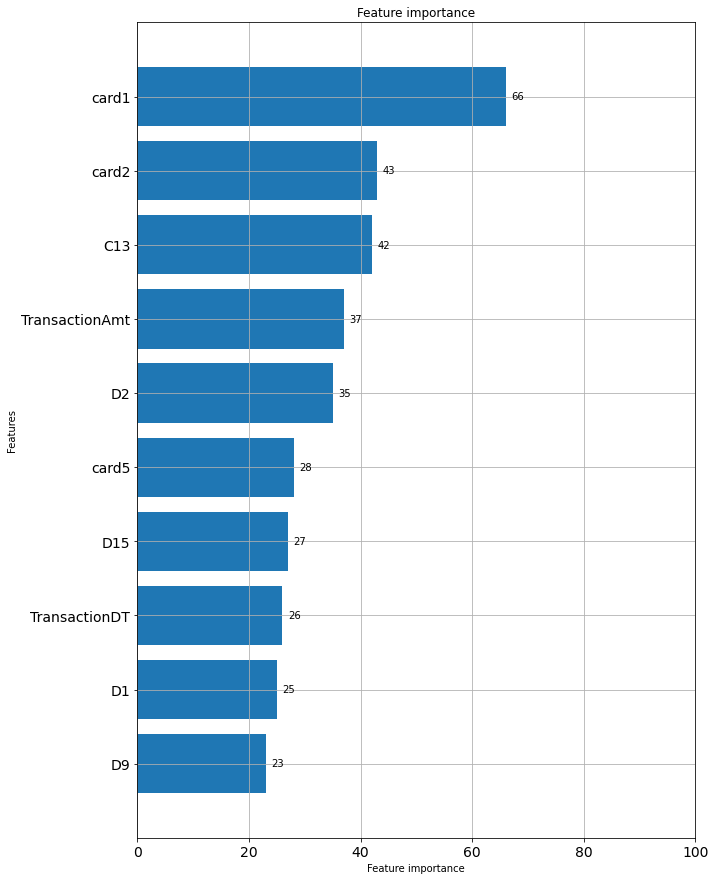

In [0]:
ax = lgb.plot_importance(gbm, height = 0.8, 
                         max_num_features = 10, 
                         xlim = (0,100), 
                         figsize = (10,15)) #, ylim = (0,23)
matplotlib.pyplot.xticks(fontsize=14) # Pour modifier (cad augmenter ou diminuer) la taille des étiquettes sur les axes d'une figure
matplotlib.pyplot.yticks(fontsize=14) # Pour modifier (cad augmenter ou diminuer) la taille des étiquettes sur les axes d'une figure
plt.show()

In [0]:
#features importances : 10  tops 
cols = list(X_train_knn.columns)
feature_imp = pd.DataFrame(sorted(zip(gbm.feature_importances_,cols)), columns=['Value','Feature'])

feature_imp.sort_values(by = 'Value', ascending = False)[:10]

,Value,Feature
483,66,card1
482,43,card2
481,42,C13
480,37,TransactionAmt
479,35,D2
478,28,card5
477,27,D15
476,26,TransactionDT
475,25,D1
474,23,addr1


#Validation de Modèle par les mesures de performances usuelles 

In [0]:
y_pred = gbm.predict(X_test_knn, num_iteration=gbm.best_iteration_)
print('The accuracy of prediction is:', accuracy_score(y_test_knn, y_pred))
print('The roc_auc_score of prediction is:', roc_auc_score(y_test_knn, y_pred))
print('The null acccuracy is:', max(y_test_knn.mean(), 1 - y_test_knn.mean()))

The accuracy of prediction is: 0.9806060606060606
The roc_auc_score of prediction is: 0.6651668836091964
The null acccuracy is: 0.9731515151515151


* La courbe de ROC: curve Roc

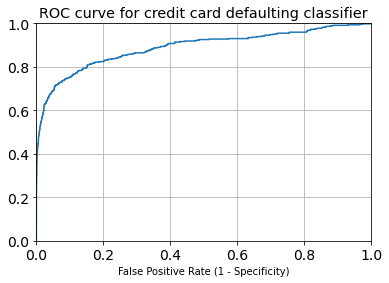

In [0]:
y_pred_prob =  gbm.predict_proba(X_test_knn, num_iteration=gbm.best_iteration_) # la probabilité d"etre fraudeur 
y_pred_prob=y_pred_prob[:,1] # array en python comme les data frame en R
fpr, tpr, thresholds = roc_curve(y_test_knn, y_pred_prob)
plt.plot(fpr, tpr)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.rcParams['font.size'] = 12
plt.title('ROC curve for credit card defaulting classifier')
plt.xlabel('False Positive Rate (1 - Specificity)')
matplotlib.pyplot.xticks(fontsize=14) # Pour modifier (cad augmenter ou diminuer) la taille des étiquettes sur les axes d'une figure
matplotlib.pyplot.yticks(fontsize=14) # Pour modifier (cad augmenter ou diminuer) la taille des étiquettes sur les axes d'une figure
plt.grid(True)

* Submission de LGBM avec optimization des paramètres optimales et entrainé sur la base imputée par KNN*


In [0]:
y_pred_prob = gbm.predict_proba(Test_knn) # la probabilité d"etre fraudeur 
submission['isFraud'] = y_pred_prob[:,1] # data frame transaction et proba d'appartenance dans le premiere classe
submission.to_csv(mypath+"Submission_KNN_LGBM_Param-optimisés.csv",index=False) # save data .csv
# affichage 
submission.head()


,isFraud
TransactionID,
3663549,0.003827
3663550,0.021606
3663551,0.035128
3663552,0.005190
3663553,0.010452


# 3-3)  Modele de LGBM WITH CROSS VALIDATION (KFold or Stratified KFold) avec des  d'hyper-para dèja optimisés ( sur la base imputée pas knn) ce que nous permet d'avoir une bonne idée sur la fiabilité et de la performance de notre algorithme.*

In [0]:
from sklearn.model_selection import KFold, StratifiedKFold, GroupKFold
import gc

In [0]:
kf = KFold(n_splits=3) # construction de 3 modele de LGBM et chacun entre eux s'entraine sur une partie de la base de donnée 
# donc il faut conaténer les bases de données 
features=pd.concat([X_train_knn,X_test_knn], ignore_index=True) # data totale
target = pd.concat([y_train_knn,y_test_knn], ignore_index=True) # data totale   #y_train_knn
nround = 5
models = []
for train_index,test_index in kf.split(features):
    train_features = features.loc[train_index]
    train_target = target.loc[train_index]
    
    test_features = features.loc[test_index]
    test_target = target.loc[test_index]
    
    d_training = lgb.Dataset(train_features, label=train_target, free_raw_data=False) #,categorical_feature=categorical_features
    d_test = lgb.Dataset(test_features, label=test_target, free_raw_data=False)#,categorical_feature=categorical_features
    #LGBM Paramater tuning
    params = {
        'num_leaves': gbm.num_leaves,
        'learning_rate': gbm.learning_rate,
        'n_estimators' :gbm.n_estimators,
        'max_depth': 17,
        'colsample_bytree':.8,
        'subsample':.9,
        'max_depth':15,
        'reg_alpha':.1,
        'reg_lambda':.1,
        'min_split_gain':.01,
        'min_child_weight':2,
        'objective': 'binary',
        'metric': 'auc',
    } #  'boosting_type': 'gbdt',
 

    model = lgb.train(params, train_set=d_training, num_boost_round=nround, valid_sets=[d_training,d_test], verbose_eval=25, early_stopping_rounds=50)
    models.append(model)
    del train_features, train_target, test_features, test_target, d_training, d_test
    gc.collect()

/usr/local/lib/python3.6/dist-packages/lightgbm/engine.py:118: UserWarning: Found `n_estimators` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


Training until validation scores don't improve for 50 rounds.
[25]	training's auc: 0.968242	valid_1's auc: 0.920422
[50]	training's auc: 0.994735	valid_1's auc: 0.929028
Did not meet early stopping. Best iteration is:
[64]	training's auc: 0.998394	valid_1's auc: 0.93017
Training until validation scores don't improve for 50 rounds.
[25]	training's auc: 0.964601	valid_1's auc: 0.899632
[50]	training's auc: 0.993997	valid_1's auc: 0.912375
Did not meet early stopping. Best iteration is:
[64]	training's auc: 0.998392	valid_1's auc: 0.916721
Training until validation scores don't improve for 50 rounds.
[25]	training's auc: 0.969808	valid_1's auc: 0.890741
[50]	training's auc: 0.994735	valid_1's auc: 0.903446
Did not meet early stopping. Best iteration is:
[64]	training's auc: 0.997709	valid_1's auc: 0.909177


* Affichage des 10 futures importants pour chaque modéle LGBm ( avec parametres optimisés précédemment ) sur une partie de jeu de données. Dans notre cas, on a chosi k==3 alétoirement* 

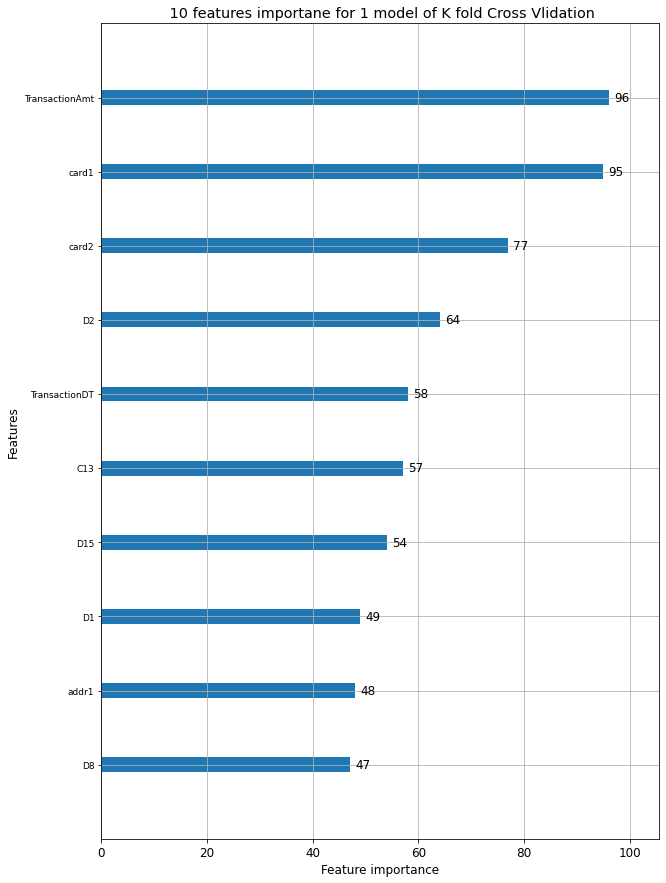

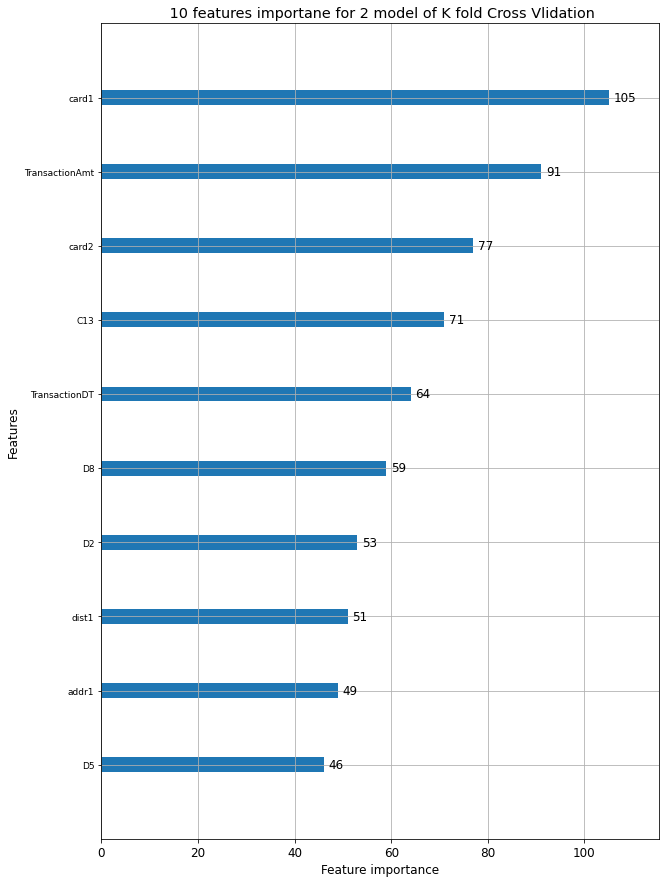

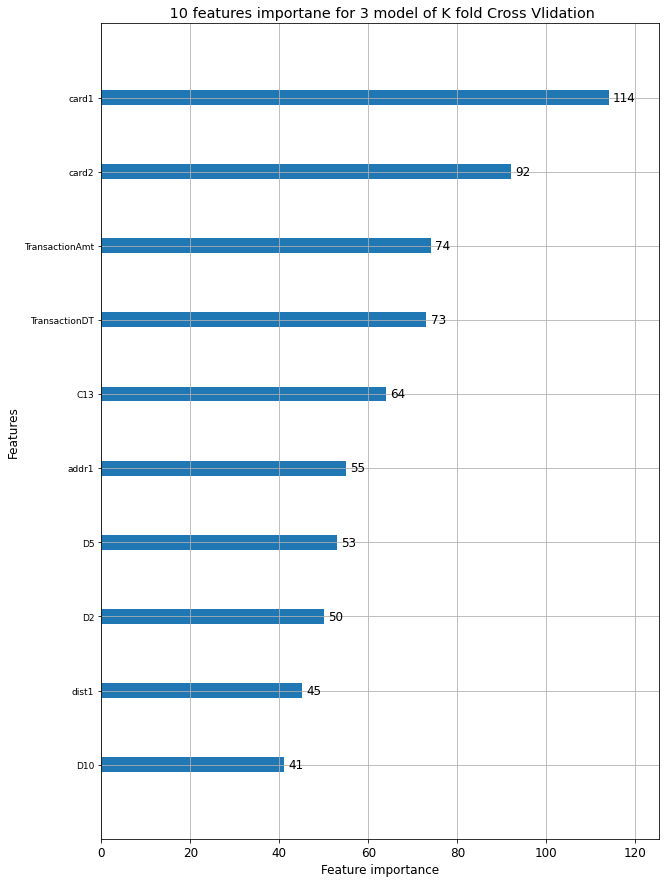

In [0]:
i=1
for model in models:
    lgb.plot_importance(model,title=" 10 features importane for "+ str(i)+ " model of K fold Cross Vlidation",max_num_features = 10,figsize = (10,15))
    matplotlib.pyplot.xticks(fontsize=12) # Pour modifier (cad augmenter ou diminuer) la taille des étiquettes sur les axes d'une figure
    matplotlib.pyplot.yticks(fontsize=9) # Pour modifier (cad augmenter ou diminuer) la taille des étiquettes sur les axes d'une figure
    i+=1
    plt.show()

* Prgramation de la fonction de prédiction de Croos Validation : par vote pour la prédiction des classes d'appartenances et par moyenne non pondérées pour la Prediction de la probabilité d'appartenance*

In [0]:
# prédiction al proba d'aoppartenance = la moyenne des proba des model ou la moyenne de proba pondéré des models( non la classe d'appartennace par vote majoritaire et non par maximum a posterieuré et non par vote pondéré)
#results = []
def pred(models, X,results= []):
  
  for model in models:
    if  results == []:
        results = (model.predict(X, num_iteration=model.best_iteration)) / len(models) # pour la régression np.expm1(model.predict(X, num_iteration=model.best_iteration)) / len(models)
    else:
        results +=(model.predict(X, num_iteration=model.best_iteration)) / len(models) # # pour la régression np.expm1(model.predict(X, num_iteration=model.best_iteration)) / len(models)
    del model
  gc.collect()
  return results


In [0]:
# exemple de la prédiction
pred(models, Test_knn)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:4: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
  after removing the cwd from sys.path.


array([0.0020987 , 0.01213586, 0.01602347, ..., 0.00444256, 0.00951823,
       0.00357521])

In [0]:
# fonction de prédiction 
#convert into binary values
def pred_class(models,base):
  y_pred= pred(models, base)
  for i in range(0,len(y_pred)):
     if (y_pred[i] >= 0.5):
       y_pred[i] = 1
     else:
         y_pred[i] =0
  return y_pred

* Validation de modèle de LGBM avec des paramètres optimisés ,avec motivation de cross validation, par les mesures de performances usuelles*

In [0]:
y_pred = pred_class(models,X_test_knn)
print('\n\n The accuracy of prediction is:', accuracy_score(y_test_knn, y_pred))
print('\n\n The null acccuracy is:', max(y_test_knn.mean(), 1 - y_test_knn.mean()))

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:4: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
  after removing the cwd from sys.path.




 The accuracy of prediction is: 0.9884242424242424


 The null acccuracy is: 0.9731515151515151


* Submission de LGBM avec optimization des paramètres optimales et entrainé sur la base imputée par KNN*

In [0]:
results=pred(models, Test_knn,results=[]) # results
y_pred_prob = results # la probabilité d"etre fraudeur 
submission['isFraud'] = ((y_pred_prob)) # data frame transaction et proba d'appartenance dans le premiere classe
submission.to_csv(mypath+"Submission_KNN_LGBM_Param-optimisés_crossèvalidation.csv",index=False) # save data .csv
submission.head()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:4: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
  after removing the cwd from sys.path.


,isFraud
TransactionID,
3663549,0.002099
3663550,0.012136
3663551,0.016023
3663552,0.002386
3663553,0.003722


*LGBM CROSS VALIDATION PROGRAMMER MANUELLEMENT: le meme modèle précédent*



In [0]:
# maintenat on va implémenté l'ancien modéle usuelement ( usuel returne resultat par vote et proba moyenne , l'ancien ne returne par resultats par vote)
# Modeling
data= pd.concat([X_train_knn,X_test_knn], ignore_index=True) # data totale 
y=pd.concat([y_train_knn,y_test_knn], ignore_index=True)   # de data 
def LGBM_cross(data,test,proba_classe=0): # proba_classe= c ad vous désirez quoi comme returne probabilité préite ou la calsse d'apparetanance prédite, test= base_a_predire
   features = [f_ for f_ in data.columns if f_ in test]

   folds = KFold(n_splits=3, shuffle=True, random_state=123)
   oof_preds = np.zeros(data.shape[0])
   sub_preds = np.zeros(test.shape[0])
   for n_fold, (trn_idx, val_idx) in enumerate(folds.split(data)):
      trn_x, trn_y = data[features].iloc[trn_idx], y.iloc[trn_idx]
      val_x, val_y = data[features].iloc[val_idx], y.iloc[val_idx]
      

      clf = LGBMClassifier(
        n_estimators=gbm.n_estimators,
        learning_rate=gbm.learning_rate,
        num_leaves=gbm.num_leaves,
        colsample_bytree=.8,
        subsample=.9,
        max_depth=15,
        reg_alpha=.1,
        reg_lambda=.1,
        min_split_gain=.01,
        min_child_weight=2
        )
    
      clf.fit(trn_x, trn_y, 
            eval_set= [(trn_x, trn_y), (val_x, val_y)], 
            eval_metric='auc', verbose=250, early_stopping_rounds=150
           )
    
      oof_preds[val_idx] = clf.predict_proba(val_x, num_iteration=clf.best_iteration_)[:, 1]
      if proba_classe== 1: # return proba
        sub_preds += clf.predict_proba(test[features], num_iteration=clf.best_iteration_)[:, 1] / folds.n_splits
        #sub_preds_proba += clf.predict_proba(test[features], num_iteration=clf.best_iteration_)[:, 1] / folds.n_splits
      else: 
        sub_preds += clf.predict(test[features], num_iteration=clf.best_iteration_)
      print('\n \n Fold %2d AUC : %.6f\n \n ' % (n_fold + 1, roc_auc_score(val_y, oof_preds[val_idx])))
      del clf, trn_x, trn_y, val_x, val_y
      gc.collect()
   if  proba_classe== 0  : # regle de décision par vote 
     sub_preds[sub_preds==2]=1
     sub_preds[sub_preds==3]=1
     sub_preds[sub_preds==1]=0
     sub_preds[sub_preds==0]=0
   print('\n \n the auc total of prediction is Full AUC score %.6f\n \n ' % roc_auc_score(y, oof_preds))   

   return sub_preds

In [0]:
LGBM_cross(data,Test_mode_mean,0)

Training until validation scores don't improve for 150 rounds.
Did not meet early stopping. Best iteration is:
[64]	training's binary_logloss: 0.0250157	training's auc: 0.998177	valid_1's binary_logloss: 0.0660585	valid_1's auc: 0.91842

 
 Fold  1 AUC : 0.918420
 
 
Training until validation scores don't improve for 150 rounds.
Did not meet early stopping. Best iteration is:
[64]	training's binary_logloss: 0.0244273	training's auc: 0.998578	valid_1's binary_logloss: 0.0683565	valid_1's auc: 0.90986

 
 Fold  2 AUC : 0.909860
 
 
Training until validation scores don't improve for 150 rounds.
Did not meet early stopping. Best iteration is:
[64]	training's binary_logloss: 0.0262687	training's auc: 0.998542	valid_1's binary_logloss: 0.0627734	valid_1's auc: 0.918915

 
 Fold  3 AUC : 0.918915
 
 

 
 the auc total of prediction is Full AUC score 0.915207
 
 


array([0., 0., 0., ..., 0., 0., 0.])

* Validation de modèle de LGBM avec des paramètres optimisés ,avec motivation de cross validation programmé manuellement, par les mesures de performances usuelles*

In [0]:

y_pred = LGBM_cross(data,X_test_knn,0)
print('The accuracy of prediction is:', accuracy_score(y_test_knn, y_pred))
print('\n\nThe null acccuracy is:', max(y_test_knn.mean(), 1 - y_test_knn.mean()))

Training until validation scores don't improve for 150 rounds.
Did not meet early stopping. Best iteration is:
[64]	training's binary_logloss: 0.0245077	training's auc: 0.998612	valid_1's binary_logloss: 0.0650748	valid_1's auc: 0.91978

 
 Fold  1 AUC : 0.919780
 
 
Training until validation scores don't improve for 150 rounds.
Did not meet early stopping. Best iteration is:
[64]	training's binary_logloss: 0.0248177	training's auc: 0.998183	valid_1's binary_logloss: 0.0675131	valid_1's auc: 0.912501

 
 Fold  2 AUC : 0.912501
 
 
Training until validation scores don't improve for 150 rounds.
Did not meet early stopping. Best iteration is:
[64]	training's binary_logloss: 0.0264344	training's auc: 0.998251	valid_1's binary_logloss: 0.0634832	valid_1's auc: 0.915681

 
 Fold  3 AUC : 0.915681
 
 

 
 the auc total of prediction is Full AUC score 0.915718
 
 
The accuracy of prediction is: 0.9731515151515151


The null acccuracy is: 0.9731515151515151


*Submission de LGBM avec optimization des paramètres optimales, motivé par cross validation programmé manuelllement, et entrainé sur la base imputée par KNN*
 

In [0]:

results=LGBM_cross(data,Test_knn,1) # results
y_pred_prob = np.array(results) # la probabilité d"etre fraudeur 
submission['isFraud'] = ((y_pred_prob)) # data frame transaction et proba d'appartenance dans le premiere classe
submission.to_csv(mypath+"Submission_KNN_LGBM_Param-optimisés_cross-validation-manuel.csv",index=False) # save data .csv
submission.head()

Training until validation scores don't improve for 150 rounds.
Did not meet early stopping. Best iteration is:
[64]	training's binary_logloss: 0.0245077	training's auc: 0.998612	valid_1's binary_logloss: 0.0650748	valid_1's auc: 0.91978

 
 Fold  1 AUC : 0.919780
 
 
Training until validation scores don't improve for 150 rounds.
Did not meet early stopping. Best iteration is:
[64]	training's binary_logloss: 0.0248177	training's auc: 0.998183	valid_1's binary_logloss: 0.0675131	valid_1's auc: 0.912501

 
 Fold  2 AUC : 0.912501
 
 
Training until validation scores don't improve for 150 rounds.
Did not meet early stopping. Best iteration is:
[64]	training's binary_logloss: 0.0264344	training's auc: 0.998251	valid_1's binary_logloss: 0.0634832	valid_1's auc: 0.915681

 
 Fold  3 AUC : 0.915681
 
 

 
 the auc total of prediction is Full AUC score 0.915718
 
 


,isFraud
TransactionID,
3663549,0.004399
3663550,0.005493
3663551,0.003450
3663552,0.002349
3663553,0.003349


## 4) Implémentation de KNN : K nears neighbors 

Cet Implémentation est procédé par l'équilibrage des classes de la variable cible "isFraud":

Comme Knn est se base sur la distance comme metric pour calculer la similarité donc il est sensible du problemème des données désiquilibrées:

Maintenat on a deux jeux de données, celle implémentée par mode et mean et celle implémentée par KNN

pour cette partie l'étape de scaling est trés importante
pour que : Gradient Descent trouve plus rapidement le minimum de la fonction de coût
Plus concrétement, voici une liste d’algorithmes non exhaustive pour lesquels il faudra procéder au Feature Scaling ( régression + distance comme métrique de similarité):

Logistic Regression
Regression Analysis (polynomial, multivariate regression…)
Support Vector Machines (SVM)
K-Nearest Neighbors (KNN)
K-Means (clustering…)
Principal Component Analysis (PCA)

Normalisation et La standardisation des varaibles continue : 
est appliquée quand les input features répondent à des distributions normales (Distributions Gaussiennes) avec des moyennes et des écart-types différents ( attention de faire split avant scaling)




**Scaling par la méthode de MIN-MAx**

In [0]:
from sklearn.preprocessing import MinMaxScaler, StandardScaler

def Min_Max_stand(dff):
  df=dff.copy()
  Var_continue= [x for x in v if (x in df.columns)==True and x != "isFraud"]
  #Var_continue.remove('isFraud')
  variabel_qualitative=[ i for i in df.columns if i not in Var_continue]
  ##Normalisation :  on va l'aapliquer seuelment sur la base imputé par KNN 
  mm_scaler =MinMaxScaler()
  df_mm = mm_scaler.fit_transform(df[Var_continue])
  df_mm = pd.DataFrame(df_mm, columns=Var_continue)
  #standardisation : StandardScaler is scales each column to have 0 mean and unit variance.
  s_scaler =StandardScaler()
  df_s = s_scaler.fit_transform(df_mm[Var_continue])
  df_s = pd.DataFrame(df_s, columns=Var_continue)
  df_s[variabel_qualitative]=df[variabel_qualitative]
  return df_s


* pour la suite de code, on ne constituera le modèle en se basant sur la base d'apprentissage imputée par KNN 

In [0]:
variabel_quantitative=[i for i in train.columns if train[i].dtypes!='object']
v=variabel_quantitative[1:len(variabel_quantitative)]  # pour écarter la varaible sible "isFraud"

In [0]:

Train_scaled= Min_Max_stand(Train_knn) # varaible exogènes  scaled
Test_scaled= Min_Max_stand(Test_knn)

## calibrage des classes de isFraud ( imbalanced Data ==> balanced Data)

*undersampling car la base de donnée pour la classe 0 de is fraud est sous représentée*



In [0]:
# Class count
count_class_0, count_class_1 = Train_scaled.isFraud.value_counts()

# Divide by class
df_class_0 = Train_scaled[Train_scaled['isFraud'] == 0]
df_class_1 = Train_scaled[Train_scaled['isFraud'] == 1]




Random under-sampling:
1.0    1357
0.0    1357
Name: isFraud, dtype: int64


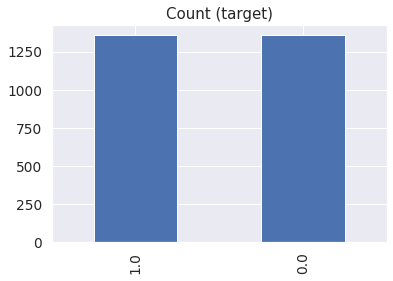

In [23]:
import numpy as np
import pandas as pd
df_class_0_under = df_class_0.sample(count_class_1)
df_train_under = pd.concat([df_class_0_under, df_class_1], axis=0)

print('Random under-sampling:')
print(df_train_under.isFraud.value_counts())

df_train_under.isFraud.value_counts().plot(kind='bar', title='Count (target)');

In [0]:
# VOILA LES DONN2E SBALANCED 
Train_scaled_balaced  = df_train_under
Test_scaled_balanced= Test_scaled 

In [0]:
#split
from sklearn.model_selection import train_test_split

y=Train_scaled_balaced['isFraud'].copy()
del Train_scaled_balaced['isFraud']
X=Train_scaled_balaced.copy()

X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.4,random_state=42, stratify=y)

## 4-1) Implémentation de KNN : K nears neighbors (K optimisé visuellement et les données calibrées par undersampling)

# imputation de KNN sur des données équilibrées et gaussiennes

In [0]:
# Maintenant on va appliquer KNN ( on est toutes les données sont scaled et équilibrées )
# KNN pour des k différentes 

from sklearn.neighbors import KNeighborsClassifier
import numpy as np
#Setup arrays to store training and test accuracies
neighbors = np.arange(1,12) # pour chosir e le meilleru K qui  maximise accuracy de base de test 
train_accuracy =np.empty(len(neighbors))
test_accuracy = np.empty(len(neighbors))

for i,k in enumerate(neighbors):
    #Setup a knn classifier with k neighbors
    knn = KNeighborsClassifier(n_neighbors=k)
    
    #Fit the model
    knn.fit(X_train, y_train)
    
    #Compute accuracy on the training set
    train_accuracy[i] = knn.score(X_train, y_train)
    
    #Compute accuracy on the test set
    test_accuracy[i] = knn.score(X_test, y_test)

## le chois de paramètre K

#Optimization de paramétre tunnig (k) a partir l'etude de la sensibilité de accuracy test en fonction de K

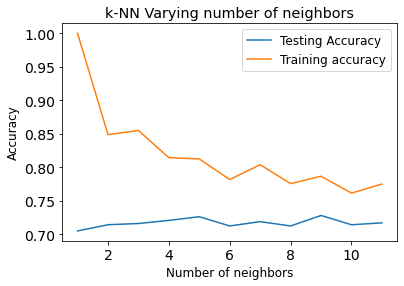

In [0]:
#Generate plot
plt.title('k-NN Varying number of neighbors')
plt.plot(neighbors, test_accuracy, label='Testing Accuracy')
plt.plot(neighbors, train_accuracy, label='Training accuracy')
plt.legend()
matplotlib.pyplot.xticks(fontsize=14) # Pour modifier (cad augmenter ou diminuer) la taille des étiquettes sur les axes d'une figure
matplotlib.pyplot.yticks(fontsize=14) # Pour modifier (cad augmenter ou diminuer) la taille des étiquettes sur les axes d'une figure
plt.xlabel('Number of neighbors')
plt.ylabel('Accuracy')
plt.show()



Approxomativement, on prendra K==2, mais pour bien choisir, il faut d'appliqué Cross Validation sur plusieurs K. Vu que la mémoire d'éxecution en ligne est limitée, donc on se cale pour K==2 chosi sur étude de sensibilité de l'accuarcy sur une seule base de donné.

In [0]:
k=5
    #Setup a knn classifier with k neighbors
knn = KNeighborsClassifier(n_neighbors=k)
    
    #Fit the model
knn.fit(X_train, y_train)
    
    #Compute accuracy on the training set
train_accuracy = knn.score(X_train, y_train)
print("train accuracy est :",train_accuracy)
    
    #Compute accuracy on the test set
test_accuracy = knn.score(X_test, y_test)
print("test accuracy est :",test_accuracy)


train accuracy est : 0.8126535626535627
test accuracy est : 0.7265193370165746


# la matrix de confusion 


In [0]:
#import confusion_matrix
from sklearn.metrics import confusion_matrix
y_pred = knn.predict(X_test)
pd.DataFrame(confusion_matrix(y_test,y_pred))


,0,1
0,437,106
1,191,352


In [0]:
#import classification_report
from sklearn.metrics import classification_report
print(classification_report(y_test,y_pred))


              precision    recall  f1-score   support

         0.0       0.70      0.80      0.75       543
         1.0       0.77      0.65      0.70       543

    accuracy                           0.73      1086
   macro avg       0.73      0.73      0.72      1086
weighted avg       0.73      0.73      0.72      1086



* la courbe de ROC

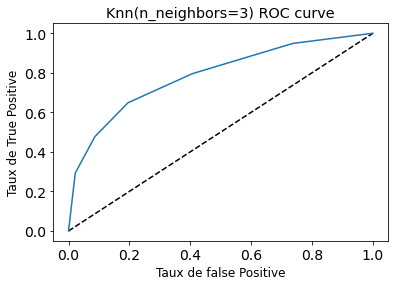

In [0]:
y_pred_proba = knn.predict_proba(X_test)[:,1]
from sklearn.metrics import roc_curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
plt.plot([0,1],[0,1],'k--')
plt.plot(fpr,tpr, label='Knn')
plt.xlabel('Taux de false Positive')
plt.ylabel('Taux de True Positive')
plt.title('Knn(n_neighbors=3) ROC curve')
matplotlib.pyplot.xticks(fontsize=14) # Pour modifier (cad augmenter ou diminuer) la taille des étiquettes sur les axes d'une figure
matplotlib.pyplot.yticks(fontsize=14) # Pour modifier (cad augmenter ou diminuer) la taille des étiquettes sur les axes d'une figure
plt.show()

In [0]:
#Area under ROC curve
from sklearn.metrics import roc_auc_score
roc_auc_score(y_test,y_pred_proba)


0.7860871157779066

* Submission de KNN avec K== 5 optimisé visuellement et le modèle entrainé sur le jeu imputé par KNN

In [0]:
y_pred_prob = knn.predict_proba(Test_scaled_balanced) # la probabilité d"etre fraudeur 
submission['isFraud'] = ((y_pred_prob[:,1])) # data frame transaction et proba d'appartenance dans le premiere classe
submission.to_csv(mypath+"Submission_Jeu-KNN__Modéle-KNN(K=5)_optimisé-visuellement.csv",index=False) # save data .csv
#Affichage 
submission.head() # la probabilité d"etre fraudeur

,isFraud
TransactionID,
3663549,0.2
3663550,0.2
3663551,0.4
3663552,0.2
3663553,0.4


On a observé que le modele provoque le robleme de sur apprentissage donc on a deux solution, soit de faire cross validation pour le modele implémenté de K==5 ou bien de optimisée de nouveau K par cross validation :
*Validation croisie pour éviter la provocation de sur apprentissage : optimization des parametres K par cross validation : cad pour chaque K donné on va appliqué cross validation afin de calculer l'accuracy moyenne pour différente base d'apprentissage et pour Chaque k ( nombre de voisin)*

## 4-2) Implémentation de KNN : K nears neighbors (K optimisé visuellement et les données calibrées par undersampling)

In [0]:
# on prévélige de optimiser k de nouveau por cross validation 

Méthode: Hyperparameter tuning

The value of k (i.e 7) we selected above was selected by observing the curve of accuracy vs number of neighbors. This is a primitive way of hyperparameter tuning.

There is a better way of doing it which involves:

1) Trying a bunch of different hyperparameter values

2) Fitting all of them separately

3) Checking how well each performs

4) Choosing the best performing one

5) Using cross-validation every time

Scikit-learn provides a simple way of achieving this using GridSearchCV i.e Grid Search cross-validation.

In [0]:
#import GridSearchCV
from sklearn.model_selection import GridSearchCV # optimizer 
#In case of classifier like knn the parameter to be tuned is n_neighbors
param_grid = {'n_neighbors':np.arange(1,50)} # parametre a optimisé 
knn = KNeighborsClassifier()
knn_cv= GridSearchCV(knn,param_grid,cv=5)
knn_cv.fit(X,y)

GridSearchCV(cv=5, error_score=nan,
             estimator=KNeighborsClassifier(algorithm='auto', leaf_size=30,
                                            metric='minkowski',
                                            metric_params=None, n_jobs=None,
                                            n_neighbors=5, p=2,
                                            weights='uniform'),
             iid='deprecated', n_jobs=None,
             param_grid={'n_neighbors': array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34,
       35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49])},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=0)

#Affichage des best score et best parametre 

In [0]:
knn_cv.best_score_ # best accuracy


0.7026666123014822

In [0]:
knn_cv.best_params_


{'n_neighbors': 11}

on remarque que le meilleur k est 11:

In [0]:
# # on applique cross validation pour KNN pour K==2 pour faire submission par moyenne ( ou vote), mais vu que l'accuracy après cross validation donne 0.39 donc on aura pas obtenu des bonnes prédictions ce que nous laisse de dire de faire cette étape ne sera pas utile:

In [0]:
k=11
    #Setup a knn classifier with k neighbors
knn = KNeighborsClassifier(n_neighbors=k)
    
    #Fit the model
knn.fit(X_train, y_train)
    
    #Compute accuracy on the training set
train_accuracy = knn.score(X_train, y_train)
print("train accuracy est :",train_accuracy)
    
    #Compute accuracy on the test set
test_accuracy = knn.score(X_test, y_test)
print("test accuracy est :",test_accuracy)

train accuracy est : 0.7751842751842751
test accuracy est : 0.7173112338858195


* la courbe de ROV

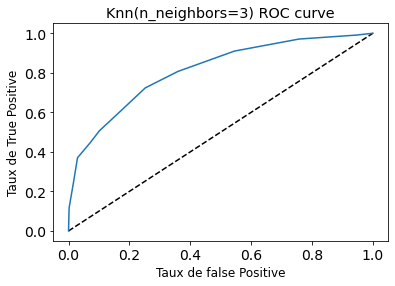

In [0]:
y_pred_proba = knn.predict_proba(X_test)[:,1]
from sklearn.metrics import roc_curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
plt.plot([0,1],[0,1],'k--')
plt.plot(fpr,tpr, label='Knn')
plt.xlabel('Taux de false Positive')
plt.ylabel('Taux de True Positive')
plt.title('Knn(n_neighbors=3) ROC curve')
matplotlib.pyplot.xticks(fontsize=14) # Pour modifier (cad augmenter ou diminuer) la taille des étiquettes sur les axes d'une figure
matplotlib.pyplot.yticks(fontsize=14) # Pour modifier (cad augmenter ou diminuer) la taille des étiquettes sur les axes d'une figure
plt.show()

* Area under ROC curve

In [0]:
#Area under ROC curve
from sklearn.metrics import roc_auc_score
roc_auc_score(y_test,y_pred_proba)


* Submission par KNN (k==11) optimisé par GridSearchCV et les données calibrées par undersampling

In [0]:
y_pred_prob = knn.predict_proba(Test_scaled_balanced) # la probabilité d"etre fraudeur 
submission['isFraud'] = ((y_pred_prob[:,1])) # data frame transaction et proba d'appartenance dans le premiere classe
submission.to_csv(mypath+"Submission_Jeu-KNN__Modéle-KNN(K=11)_optimisé-GridSearchCV.csv",index=False) # save data .csv
#Affichage 
submission.head() # la probabilité d"etre fraudeur

,isFraud
TransactionID,
3663549,0.272727
3663550,0.090909
3663551,0.363636
3663552,0.181818
3663553,0.181818


## 4-3) Implémentation de KNN : K nears neighbors (K optimisé Viseullement et les données calibrées par Oversampling)

## Implémentation de KNN avec over sampling 

In [26]:
from imblearn.over_sampling import RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler

/usr/local/lib/python3.6/dist-packages/sklearn/externals/six.py:31: FutureWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.neighbors.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.neighbors. Anything that cannot be imported from sklearn.neighbors is now part of the private API.
  warnings.warn(message, FutureWarning)


.Scaling

In [0]:
variabel_quantitative=[i for i in train.columns if train[i].dtypes!='object']
v=variabel_quantitative[1:len(variabel_quantitative)]  # pour écarter la varaible sible "isFraud"
Train_scaled= Min_Max_stand(Train_knn) # varaible exogènes  scaled
Test_scaled= Min_Max_stand(Test_knn)

In [0]:
# Class count
count_class_0, count_class_1 = Train_scaled.isFraud.value_counts()

# Divide by class
df_class_0 = Train_scaled[Train_scaled['isFraud'] == 0]
df_class_1 = Train_scaled[Train_scaled['isFraud'] == 1]



Random under-sampling:
0.0    48643
1.0    48643
Name: isFraud, dtype: int64


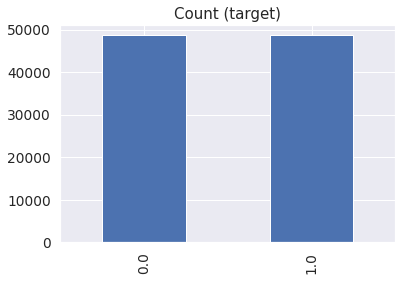

In [29]:
#random over smapling 
#ros = RandomOverSampler(random_state=0) # ros = random over sampling 
#ros.fit(X, y)
#X_resampled, y_resampled = ros.sample(X, y)
import numpy as np
import pandas as pd
df_class_1_over= df_class_1.sample(count_class_0,replace=True)
Train_Scaled_over = pd.concat([df_class_1_over, df_class_0], axis=0)

print('Random under-sampling:')
print(Train_Scaled_over.isFraud.value_counts())

Train_Scaled_over.isFraud.value_counts().plot(kind='bar', title='Count (target)');

* spécification des données 

In [0]:
# données scaled 

Z=Train_Scaled_over.copy()
y=Z['isFraud'].copy() # varaible cible
del Z['isFraud']
X=Z.copy() # Variable exogène

# base  prédire 
Test_scaled_over=Test_scaled

#Implémentation KNN sur le jeu de donnée scaled et oversampled

In [0]:
#split 
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.33,random_state=42, stratify=y)


In [0]:
#Maintenant on va appliquer KNN ( on est toutes les données sont scaled et équilibrées )
# KNN pour des k différentes 
from sklearn.neighbors import KNeighborsClassifier
import numpy as np
#Setup arrays to store training and test accuracies
neighbors = np.arange(1,5) # pour chosir e le meilleru K qui  maximise accuracy de base de test 
train_accuracy =np.empty(len(neighbors))
test_accuracy = np.empty(len(neighbors))

for i,k in enumerate(neighbors):
    print(i)
    #Setup a knn classifier with k neighbors
    knn = KNeighborsClassifier(n_neighbors=k)
    
    #Fit the model
    knn.fit(X_train, y_train)
    
    #Compute accuracy on the training set
    train_accuracy[i] = knn.score(X_train[1:10], y_train[1:10])
    
    #Compute accuracy on the test set
    test_accuracy[i] = knn.score(X_test, y_test)

0
1
2
3


# La sensibilité des accuracys en fonction de K 

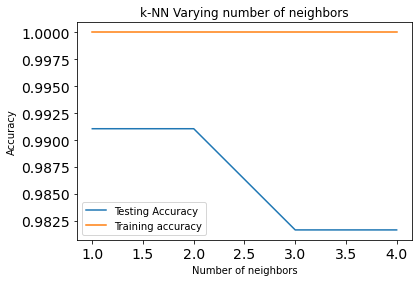

In [0]:
plt.title('k-NN Varying number of neighbors')
plt.plot(neighbors, test_accuracy, label='Testing Accuracy')
plt.plot(neighbors, train_accuracy, label='Training accuracy')
plt.legend()
matplotlib.pyplot.xticks(fontsize=14) # Pour modifier (cad augmenter ou diminuer) la taille des étiquettes sur les axes d'une figure
matplotlib.pyplot.yticks(fontsize=14) # Pour modifier (cad augmenter ou diminuer) la taille des étiquettes sur les axes d'une figure
plt.xlabel('Number of neighbors')
plt.ylabel('Accuracy')
plt.show()

approxomativement on prendrea K==2, mais pour bien chosir, il faut d'appliqué Cross Validation sur plusieurs K. Vu que la mémoire d'éxecution en ligne est limitée, donc on se cale pour K==2 chosi sur étude de sensibilité de l'accuarcy sur une seule base de donné.

#Implementation de knn pour k==2 correspond à celui  qui maximise l'accuracy de test et qui ne provoque pas le sur-apprentissage  

In [32]:
    #Setup a knn classifier with k neighbors
knn = KNeighborsClassifier(n_neighbors=2)
    
    #Fit the model
knn.fit(X_train, y_train)
    
    #Compute accuracy on the training set
train_accuracy = knn.score(X_train, y_train)
print("train accuracy est :",train_accuracy)
    
    #Compute accuracy on the test set
test_accuracy = knn.score(X_test, y_test)
print("test accuracy est :",test_accuracy) #0.991

train accuracy est : 1.0
test accuracy est : 0.9910605824637907


* La Matrice de confusion 

In [0]:
#import confusion_matrix pour data set 
from sklearn.metrics import confusion_matrix
y_pred = knn.predict(X_test)
pd.DataFrame(confusion_matrix(y_test,y_pred))


,0,1
0,15766,287
1,0,16052


* Le rapport du modèle

In [0]:
#import classification_report pour data set 
from sklearn.metrics import classification_report
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

         0.0       1.00      0.98      0.99     16053
         1.0       0.98      1.00      0.99     16052

    accuracy                           0.99     32105
   macro avg       0.99      0.99      0.99     32105
weighted avg       0.99      0.99      0.99     32105



* La Courbe de ROC

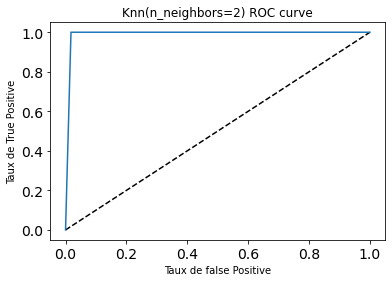

In [0]:
y_pred_proba = knn.predict_proba(X_test)[:,1]
from sklearn.metrics import roc_curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
plt.plot([0,1],[0,1],'k--')
plt.plot(fpr,tpr, label='Knn')
plt.xlabel('Taux de false Positive')
plt.ylabel('Taux de True Positive')
plt.title('Knn(n_neighbors=2) ROC curve')
matplotlib.pyplot.xticks(fontsize=14) # Pour modifier (cad augmenter ou diminuer) la taille des étiquettes sur les axes d'une figure
matplotlib.pyplot.yticks(fontsize=14) # Pour modifier (cad augmenter ou diminuer) la taille des étiquettes sur les axes d'une figure
plt.show()

* Area Under ROC curve 

In [0]:
#Area under ROC curve
from sklearn.metrics import roc_auc_score
roc_auc_score(y_test,y_pred_proba)


0.9910608608982745


* Submission de KNN avec K== 2 optimisé visuellement et le modèle entrainé sur le jeu imputé par KNN avec isFraud calibré par oversampler

# Vu que la base de donnée à prédire est trés massive,la mémoire de l'éxécution est limitée et après plusieurs éxécution sans succés, on faira la submission seuelment pour une petite échantillon:

In [0]:
y_pred_prob = knn.predict_proba(Test_scaled_over) # la probabilité d"etre fraudeur 
#submission['isFraud'] = ((y_pred_prob[:,1])) # data frame transaction et proba d'appartenance dans le premiere classe
#submission.to_csv(mypath+"Submission_Jeu-KNN__Modèle-KNN(K=2)_optimisé-visuellement_OverSamling.csv",index=False) # save data .csv
#Affichage 
#submission.head()
((y_pred_prob[:,1]))